In [1]:
import os
import mne
import antropy as ant
import pandas as pd
from mne_bids import BIDSPath, read_raw_bids, print_dir_tree, make_report
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import seaborn as sns

In [3]:
#For plots outside jupiter
get_ipython().run_line_magic("matplotlib", " qt ")

In [4]:
def topoplot(data, montage="standard_1020", vmin=None, vmax=None, mask=None, title=None,
             cmap=None, n_colors=100, cbar_title=None, cbar_ticks=None, figsize=(4, 4), dpi=80,
             fontsize=14, **kwargs):
    """
    Topoplot.

    This is a wrapper around :py:func:`mne.viz.plot_topomap`.

    For more details, please refer to this `example notebook
    <https://github.com/raphaelvallat/yasa/blob/master/notebooks/15_topoplot.ipynb>`_.

    .. versionadded:: 0.4.1

    Parameters
    ----------
    data : :py:class:`pandas.Series`
        A pandas Series with the values to plot. The index MUST be the channel
        names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    montage : str
        The name of the montage to use. Valid montages can be found at
        :py:func:`mne.channels.make_standard_montage`.
    vmin, vmax : float
        The minimum and maximum values of the colormap. If None, these will be
        defined based on the min / max values of ``data``.
    mask : :py:class:`pandas.Series`
        A pandas Series indicating the significant electrodes. The index MUST
        be the channel names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    title : str
        The plot title.
    cmap : str
        A matplotlib color palette. A list of color palette can be found at:
        https://seaborn.pydata.org/tutorial/color_palettes.html
    n_colors : int
        The number of colors to discretize the color palette.
    cbar_title : str
        The title of the colorbar.
    cbar_ticks : list
        The ticks of the colorbar.
    figsize : tuple
       Width, height in inches.
    dpi : int
        The resolution of the plot.
    fontsize : int
        Global font size of all the elements of the plot.
    **kwargs : dict
        Other arguments that are passed to :py:func:`mne.viz.plot_topomap`.

    Returns
    -------
    fig : :py:class:`matplotlib.figure.Figure`
        Matplotlib Figure

    Examples
    --------

    1. Plot all-positive values

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([4, 8, 7, 1, 2, 3, 5],
        ...                  index=['F4', 'F3', 'C4', 'C3', 'P3', 'P4', 'Oz'],
        ...                  name='Values')
        >>> fig = yasa.topoplot(data, title='My first topoplot')

    2. Plot correlation coefficients (values ranging from -1 to 1)

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([-0.5, -0.7, -0.3, 0.1, 0.15, 0.3, 0.55],
        ...                  index=['F3', 'Fz', 'F4', 'C3', 'Cz', 'C4', 'Pz'])
        >>> fig = yasa.topoplot(data, vmin=-1, vmax=1, n_colors=8,
        ...                     cbar_title="Pearson correlation")
    """
    # Increase font size while preserving original
    old_fontsize = plt.rcParams['font.size']
    plt.rcParams.update({'font.size': fontsize})
    plt.rcParams.update({'savefig.bbox': 'tight'})
    plt.rcParams.update({'savefig.transparent': 'True'})

    # Make sure we don't do any in-place modification
    assert isinstance(data, pd.Series), 'Data must be a Pandas Series'
    data = data.copy()

    # Add mask, if present
    if mask is not None:
        assert isinstance(mask, pd.Series), 'mask must be a Pandas Series'
        assert mask.dtype.kind in 'bi', "mask must be True/False or 0/1."
    else:
        mask = pd.Series(1, index=data.index, name="mask")

    # Convert to a dataframe (col1 = values, col2 = mask)
    data = data.to_frame().join(mask, how="left")

    # Preprocess channel names: C4-M1 --> C4
    data.index = data.index.str.split('-').str.get(0)

    # Define electrodes coordinates
    Info = mne.create_info(data.index.tolist(), sfreq=100, ch_types='eeg')
    Info.set_montage(montage, match_case=False, on_missing='ignore')
    chan = Info.ch_names

    # Define vmin and vmax
    if vmin is None:
        vmin = data.iloc[:, 0].min()
    if vmax is None:
        vmax = data.iloc[:, 0].max()

    # Choose and discretize colormap
    if cmap is None:
        if vmin < 0 and vmax <= 0:
            cmap = 'mako'
        elif vmin < 0 and vmax > 0:
            cmap = 'Spectral_r'
        elif vmin >= 0 and vmax > 0:
            cmap = 'rocket_r'

    cmap = ListedColormap(sns.color_palette(cmap, n_colors).as_hex())

    if 'sensors' not in kwargs:
        kwargs['sensors'] = False
    if 'res' not in kwargs:
        kwargs['res'] = 256
    if 'names' not in kwargs:
        kwargs['names'] = chan
    if 'show_names' not in kwargs:
        kwargs['show_names'] = True
    if 'mask_params' not in kwargs:
        kwargs['mask_params'] = dict(marker=None)

    # Hidden feature: if names='values', show the actual values.
    if kwargs['names'] == 'values':
        kwargs['names'] = data.iloc[:, 0][chan].round(2).to_numpy()

    # Start the plot
    with sns.axes_style("white"):
        plt.rcParams.update({'font.family': 'monospace'})
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        im, _ = mne.viz.plot_topomap(
            data=data.iloc[:, 0][chan], pos=Info, vmin=vmin, vmax=vmax,
            mask=data.iloc[:, 1][chan], cmap=cmap, show=False, axes=ax,
            **kwargs)

        if title is not None:
            ax.set_title(title)

        # Add colorbar
        if cbar_title is None:
            cbar_title = data.iloc[:, 0].name

        cax = fig.add_axes([0.95, 0.3, 0.02, 0.5])
        cbar = fig.colorbar(im, cax=cax, ticks=cbar_ticks, fraction=0.5)
        cbar.set_label(cbar_title)

        # Revert font-size
        plt.rcParams.update({'font.size': old_fontsize})


    return fig

In [5]:
def mne_open(filename):
    """
    Function wrapper to read many eeg file types.
    Returns the Raw mne object or the RawEpoch object depending on the case. 
    """

    if '.set' in filename:
        try:
            return mne.io.read_raw_eeglab(filename,preload=True)
        except:
            return mne.read_epochs_eeglab(filename, events=None)
    elif '.cnt' in filename:
        return mne.io.read_raw_cnt(filename,preload=True)
    elif '.vhdr' in filename:
        return mne.io.read_raw_brainvision(filename,preload=True)
    elif '.bdf':
        return mne.io.read_raw_bdf(filename,preload=True)
    elif '.edf':
        return mne.read_raw_edf(filename,preload=True)
    else:
        return None

In [4]:
raw = mne_open("C:/Users/acer/Desktop/sub-001_ses-01_eeg_sub-001_ses-01_task-Rest_eeg.set")

Reading C:\Users\acer\Desktop\sub-001_ses-01_eeg_sub-001_ses-01_task-Rest_eeg.fdt
Reading 0 ... 294099  =      0.000 ...   588.198 secs...


C:\Users\acer\AppData\Local\Temp/ipykernel_5744/2597581755.py:9: RuntimeWarning: Data file name in EEG.data (sub-001_ses-01_task-Rest_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-001_ses-01_eeg_sub-001_ses-01_task-Rest_eeg.fdt).
  return mne.io.read_raw_eeglab(filename,preload=True)
C:\Users\acer\AppData\Local\Temp/ipykernel_5744/2597581755.py:9: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  return mne.io.read_raw_eeglab(filename,preload=True)


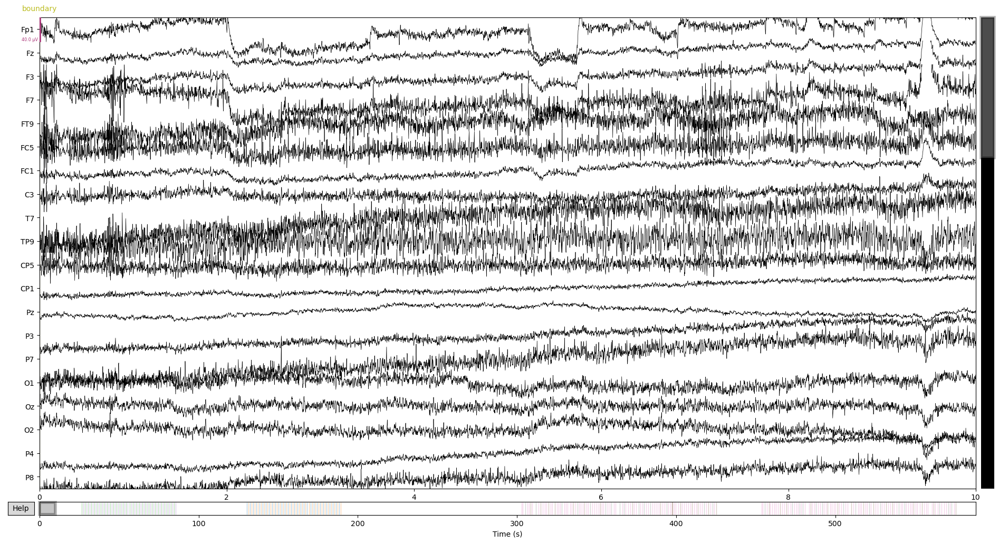

Channels marked as bad: none


In [6]:
raw.plot()

In [6]:
def sens_topoplot(data, montage="standard_1020", vmin=None, vmax=None, mask=None, title=None,
             cmap=None, n_colors=100, cbar_title=None, cbar_ticks=None, figsize=(4, 4), dpi=80,
             fontsize=14, **kwargs):
    """
    Topoplot.

    This is a wrapper around :py:func:`mne.viz.plot_topomap`.

    For more details, please refer to this `example notebook
    <https://github.com/raphaelvallat/yasa/blob/master/notebooks/15_topoplot.ipynb>`_.

    .. versionadded:: 0.4.1

    Parameters
    ----------
    data : :py:class:`pandas.Series`
        A pandas Series with the values to plot. The index MUST be the channel
        names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    montage : str
        The name of the montage to use. Valid montages can be found at
        :py:func:`mne.channels.make_standard_montage`.
    vmin, vmax : float
        The minimum and maximum values of the colormap. If None, these will be
        defined based on the min / max values of ``data``.
    mask : :py:class:`pandas.Series`
        A pandas Series indicating the significant electrodes. The index MUST
        be the channel names (e.g. ['C4', 'F4'] or ['C4-M1', 'C3-M2']).
    title : str
        The plot title.
    cmap : str
        A matplotlib color palette. A list of color palette can be found at:
        https://seaborn.pydata.org/tutorial/color_palettes.html
    n_colors : int
        The number of colors to discretize the color palette.
    cbar_title : str
        The title of the colorbar.
    cbar_ticks : list
        The ticks of the colorbar.
    figsize : tuple
       Width, height in inches.
    dpi : int
        The resolution of the plot.
    fontsize : int
        Global font size of all the elements of the plot.
    **kwargs : dict
        Other arguments that are passed to :py:func:`mne.viz.plot_topomap`.

    Returns
    -------
    fig : :py:class:`matplotlib.figure.Figure`
        Matplotlib Figure

    Examples
    --------

    1. Plot all-positive values

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([4, 8, 7, 1, 2, 3, 5],
        ...                  index=['F4', 'F3', 'C4', 'C3', 'P3', 'P4', 'Oz'],
        ...                  name='Values')
        >>> fig = yasa.topoplot(data, title='My first topoplot')

    2. Plot correlation coefficients (values ranging from -1 to 1)

    .. plot::

        >>> import yasa
        >>> import pandas as pd
        >>> data = pd.Series([-0.5, -0.7, -0.3, 0.1, 0.15, 0.3, 0.55],
        ...                  index=['F3', 'Fz', 'F4', 'C3', 'Cz', 'C4', 'Pz'])
        >>> fig = yasa.topoplot(data, vmin=-1, vmax=1, n_colors=8,
        ...                     cbar_title="Pearson correlation")
    """
    # Increase font size while preserving original
    old_fontsize = plt.rcParams['font.size']
    plt.rcParams.update({'font.size': fontsize})
    plt.rcParams.update({'savefig.bbox': 'tight'})
    plt.rcParams.update({'savefig.transparent': 'True'})

    # Make sure we don't do any in-place modification
    assert isinstance(data, pd.Series), 'Data must be a Pandas Series'
    data = data.copy()

    # Add mask, if present
    if mask is not None:
        assert isinstance(mask, pd.Series), 'mask must be a Pandas Series'
        assert mask.dtype.kind in 'bi', "mask must be True/False or 0/1."
    else:
        mask = pd.Series(1, index=data.index, name="mask")

    # Convert to a dataframe (col1 = values, col2 = mask)
    data = data.to_frame().join(mask, how="left")

    # Preprocess channel names: C4-M1 --> C4
    data.index = data.index.str.split('-').str.get(0)

    # Define electrodes coordinates
    Info = mne.create_info(data.index.tolist(), sfreq=100, ch_types='eeg')
    Info.set_montage(montage, match_case=False, on_missing='ignore')
    chan = Info.ch_names

    # Define vmin and vmax
    if vmin is None:
        vmin = data.iloc[:, 0].min()
    if vmax is None:
        vmax = data.iloc[:, 0].max()

    # Choose and discretize colormap
    if cmap is None:
        if vmin < 0 and vmax <= 0:
            cmap = 'mako'
        elif vmin < 0 and vmax > 0:
            cmap = 'Spectral_r'
        elif vmin >= 0 and vmax > 0:
            cmap = 'rocket_r'

    cmap = ListedColormap(sns.color_palette(cmap, n_colors).as_hex())

    if 'sensors' not in kwargs:
        kwargs['sensors'] = False
    if 'res' not in kwargs:
        kwargs['res'] = 256
    if 'names' not in kwargs:
        kwargs['names'] = chan
    if 'show_names' not in kwargs:
        kwargs['show_names'] = True
    if 'mask_params' not in kwargs:
        kwargs['mask_params'] = dict(marker=None)

    # Hidden feature: if names='values', show the actual values.
    if kwargs['names'] == 'values':
        kwargs['names'] = data.iloc[:, 0][chan].round(2).to_numpy()

    # Start the plot
    with sns.axes_style("white"):
        plt.rcParams.update({'font.family': 'monospace'})
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        im, _ = mne.viz.plot_topomap(
            data=data.iloc[:, 0][chan], pos=Info, vmin=vmin, vmax=vmax,
            mask=data.iloc[:, 1][chan], cmap=cmap, show=False, axes=ax,
            sphere=0.099,
            **kwargs)

        if title is not None:
            ax.set_title(title)

        # Add colorbar
        if cbar_title is None:
            cbar_title = data.iloc[:, 0].name

        #cax = fig.add_axes([0.95, 0.3, 0.02, 0.5])
        #cbar = fig.colorbar(im, cax=cax, ticks=cbar_ticks, fraction=0.5)
        #cbar.set_label(cbar_title)

        # Revert font-size
        plt.rcParams.update({'font.size': old_fontsize})


    return fig

In [9]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_delta.csv")
# df['iowa'] = (df['channel'] == "Pz")
# df['iowa'] = (df['channel'] == "PO3")
# df['iowa'] = (df['channel'] == "PO4")

conditions = [(df['channel']=='Pz')|(df['channel']=='PO3')|(df['channel']=='PO4')]
choices = [True]
df['iowa'] = np.select(conditions, choices, default=False)


In [5]:
df

,channel,estimate,estimate1,estimate2,.y.,group1,group2,n1,n2,statistic,...,conf.low,conf.high,method,alternative,p.adj,p.adj.signif,labels.FDR,sign,sign_unc,iowa
0,AF3,0.113177,-0.802032,-0.915209,d_mean,hc,pd,16,15,1.549300,...,-0.036655,0.263009,T-test,two.sided,0.357333,ns,FDR = 0.36,0,0,False
1,AF4,0.058819,-0.825325,-0.884144,d_mean,hc,pd,16,15,0.769236,...,-0.098758,0.216395,T-test,two.sided,0.471742,ns,FDR = 0.47,0,0,False
2,C3,0.102036,-0.823750,-0.925786,d_mean,hc,pd,16,15,1.359572,...,-0.052468,0.256539,T-test,two.sided,0.357333,ns,FDR = 0.36,0,0,False
3,C4,0.139842,-0.808823,-0.948665,d_mean,hc,pd,16,15,1.750664,...,-0.024756,0.304440,T-test,two.sided,0.352711,ns,FDR = 0.35,0,0,False
4,CP1,0.130626,-0.735890,-0.866516,d_mean,hc,pd,16,15,2.004799,...,-0.004699,0.265952,T-test,two.sided,0.350400,ns,FDR = 0.35,0,0,False
5,CP2,0.097603,-0.758171,-0.855774,d_mean,hc,pd,16,15,1.370242,...,-0.049410,0.244616,T-test,two.sided,0.357333,ns,FDR = 0.36,0,0,False
6,CP5,0.113467,-0.810528,-0.923995,d_mean,hc,pd,16,15,1.710370,...,-0.022939,0.249872,T-test,two.sided,0.352711,ns,FDR = 0.35,0,0,False
7,CP6,0.066618,-0.852744,-0.919363,d_mean,hc,pd,16,15,0.906148,...,-0.085073,0.218309,T-test,two.sided,0.429714,ns,FDR = 0.43,0,0,False
8,Cz,0.126461,-0.703005,-0.829466,d_mean,hc,pd,16,15,2.053289,...,-0.001024,0.253946,T-test,two.sided,0.350400,ns,FDR = 0.35,0,0,False
9,F3,0.149000,-0.798892,-0.947892,d_mean,hc,pd,16,15,2.275909,...,0.013515,0.284485,T-test,two.sided,0.350400,ns,FDR = 0.35,0,1,False


In [364]:
iowa = df
iowa = iowa.set_index("channel")


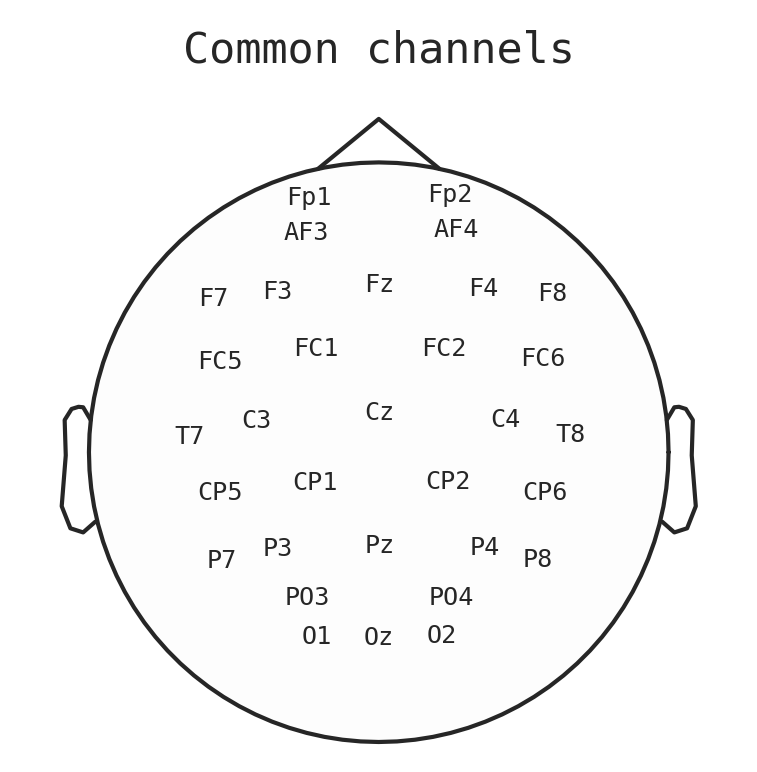

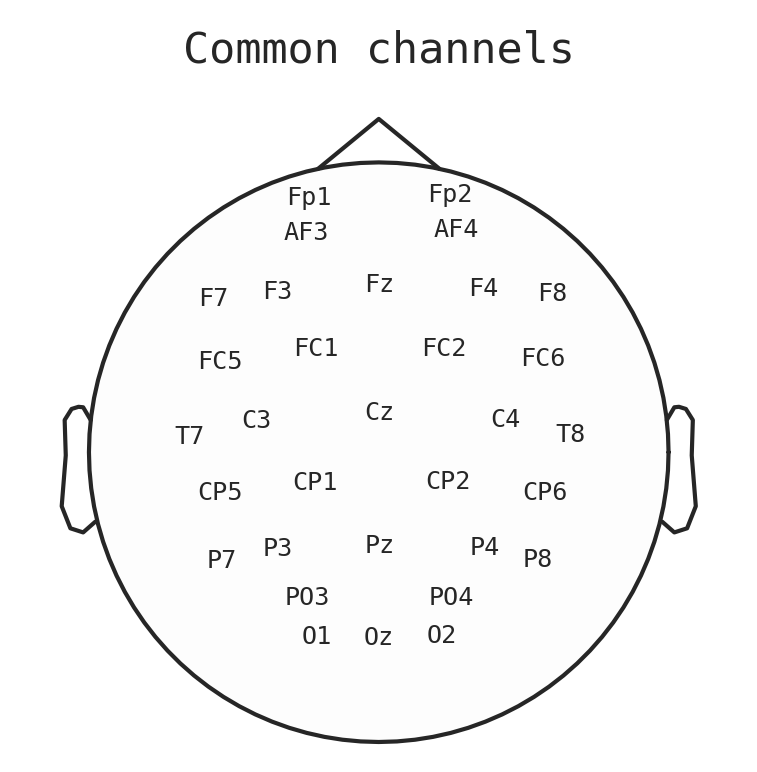

In [10]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_delta.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05) 
sens_topoplot(df["significant"],  montage='standard_1020',cbar_title="",fontsize=8.7, figsize=(3,6), cmap='binary', show_names=True, dpi = 300, title="Common channels")

### TOPOPLOTS THETA

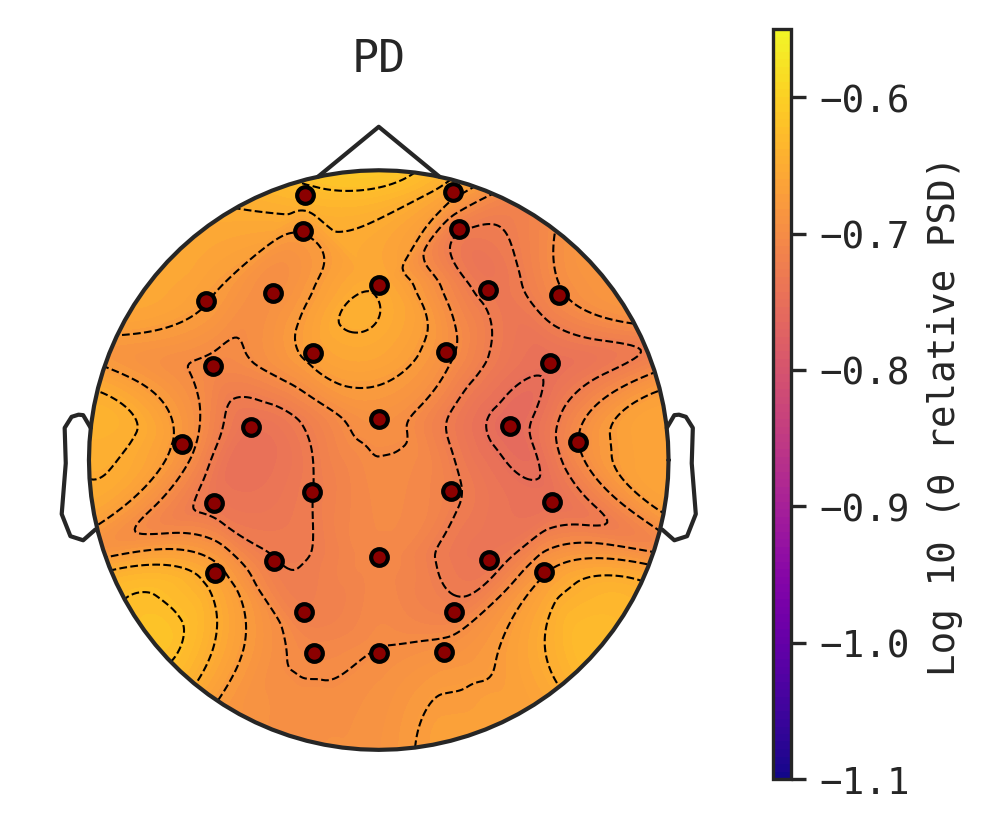

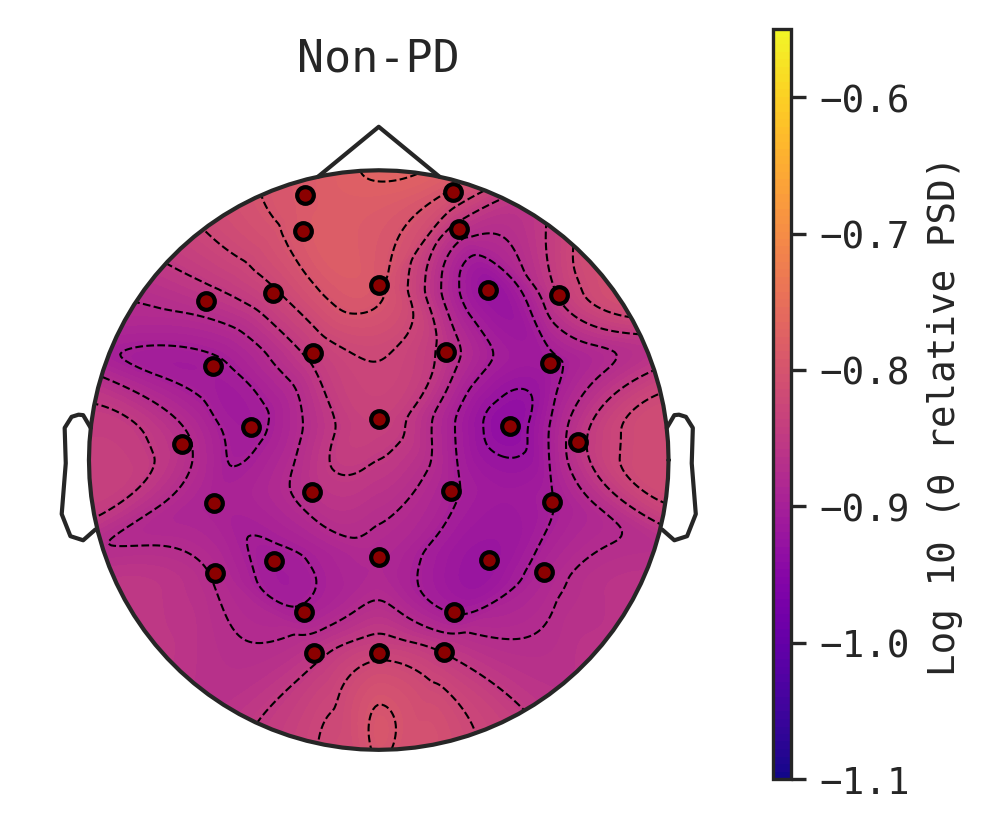

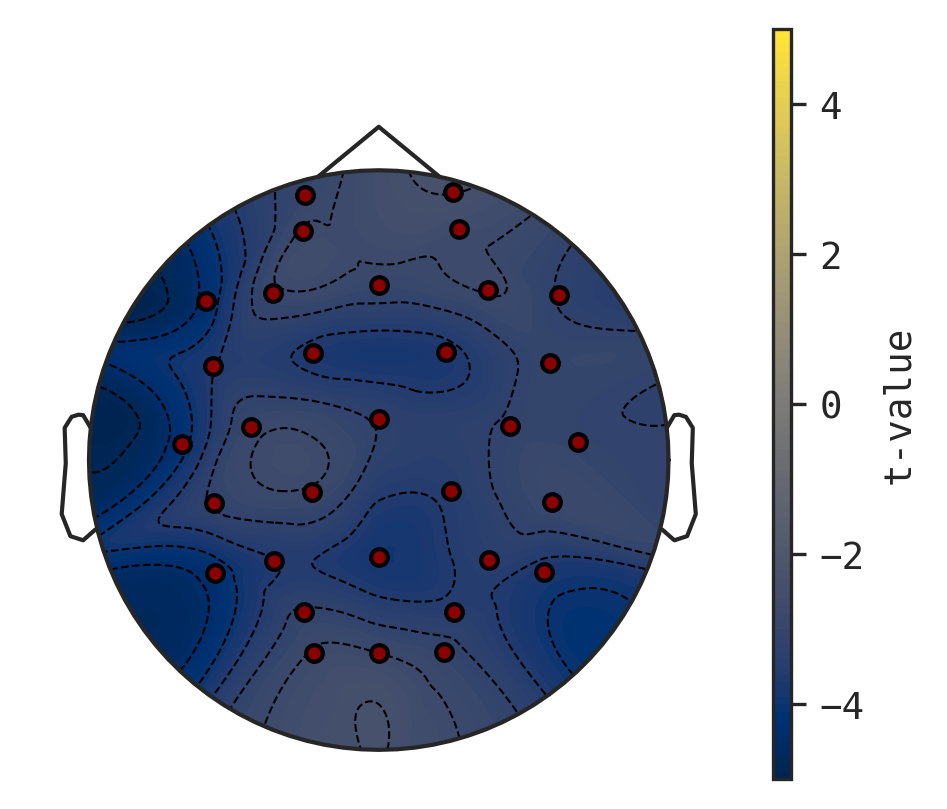

In [11]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_theta.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_theta.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_theta.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_t.png", dpi = 150)

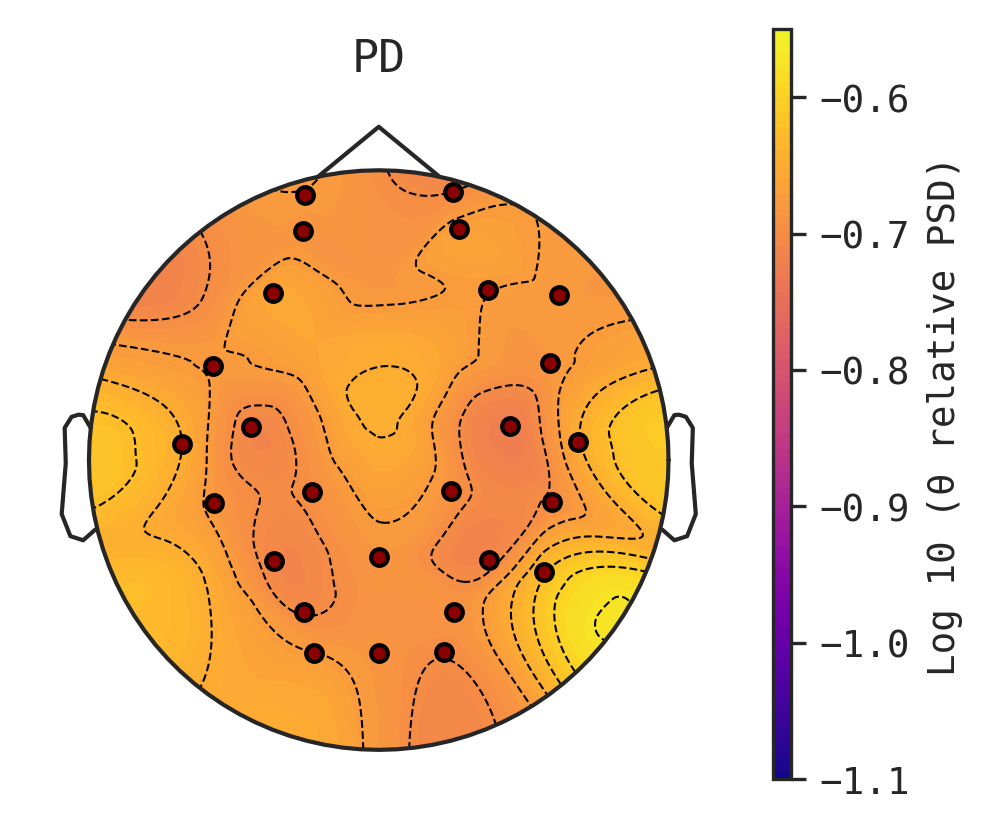

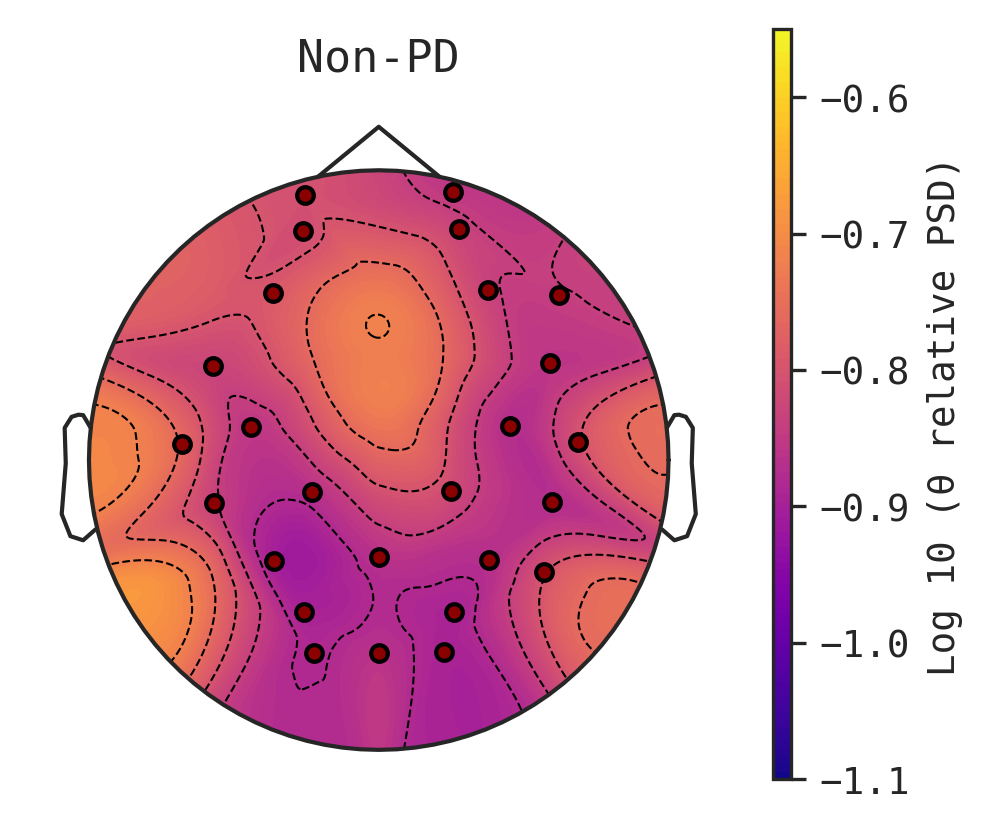

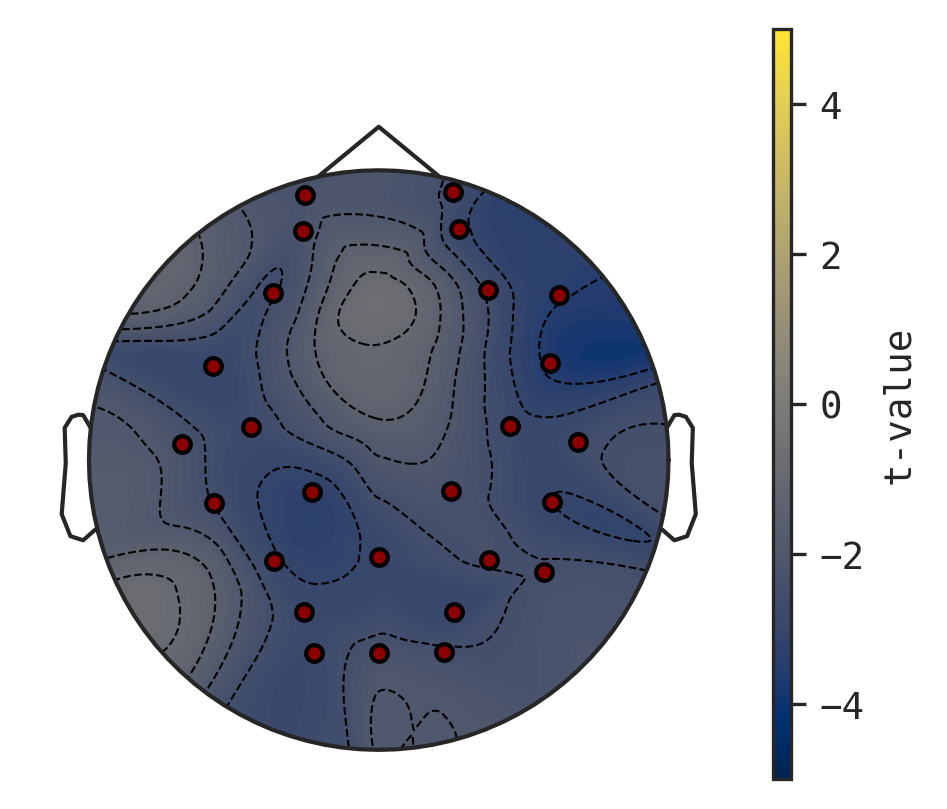

In [6]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_theta.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_theta.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_theta.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_t.png", dpi = 150)

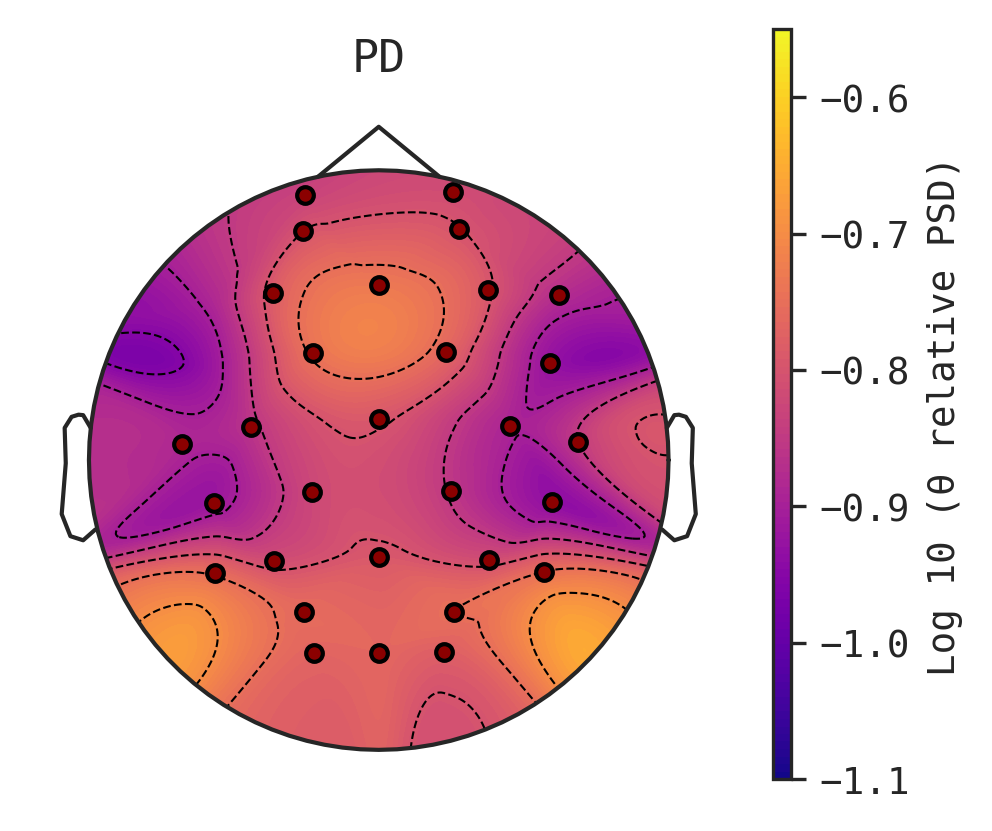

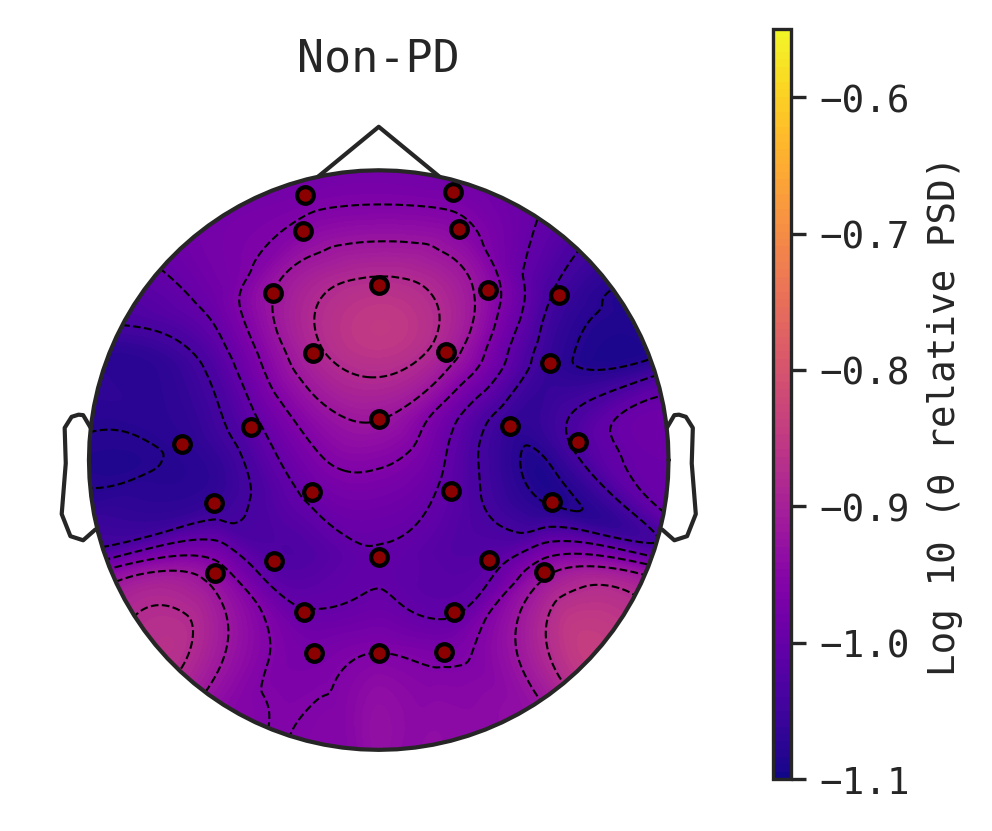

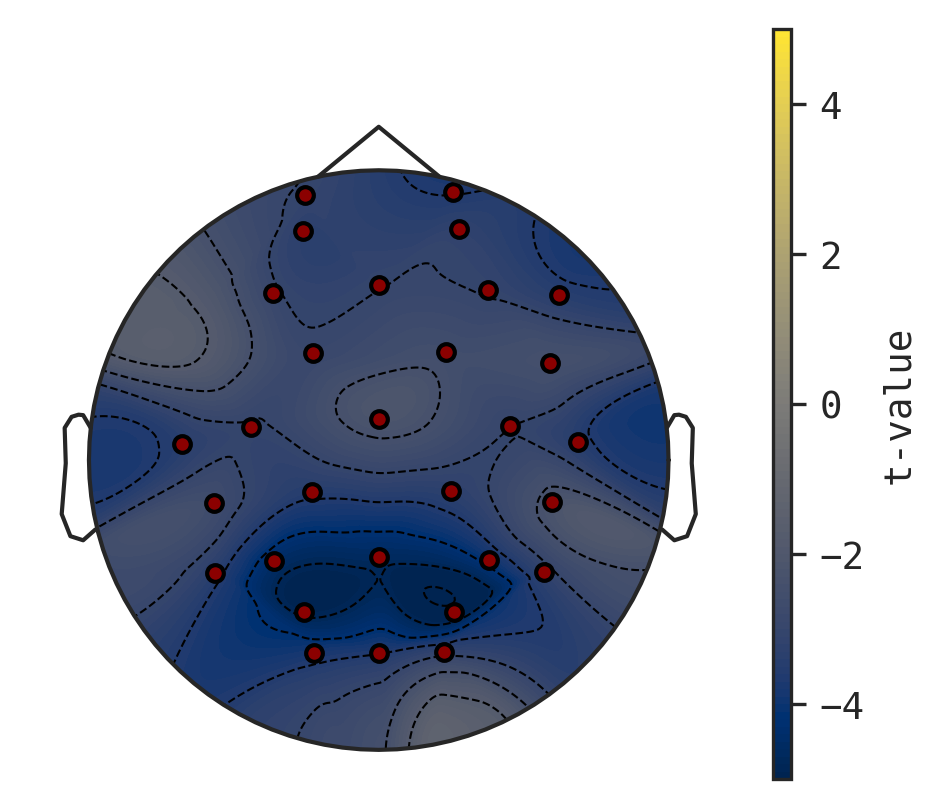

In [7]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_theta.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_theta.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_theta.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_t.png", dpi = 150)

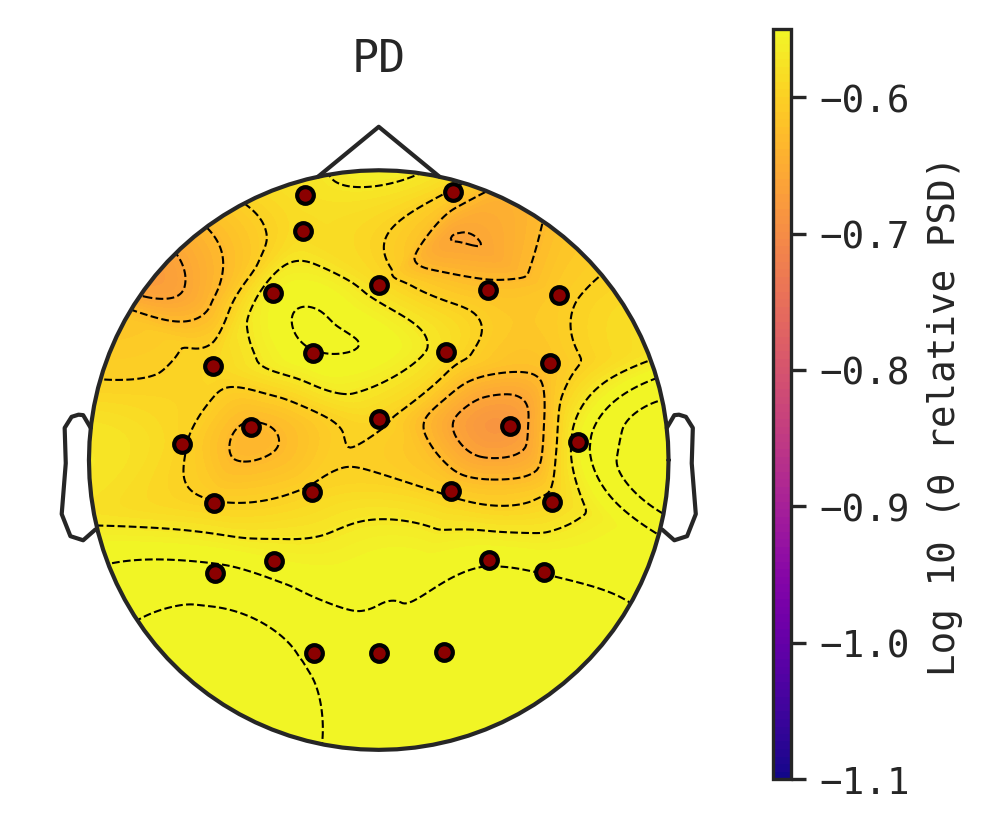

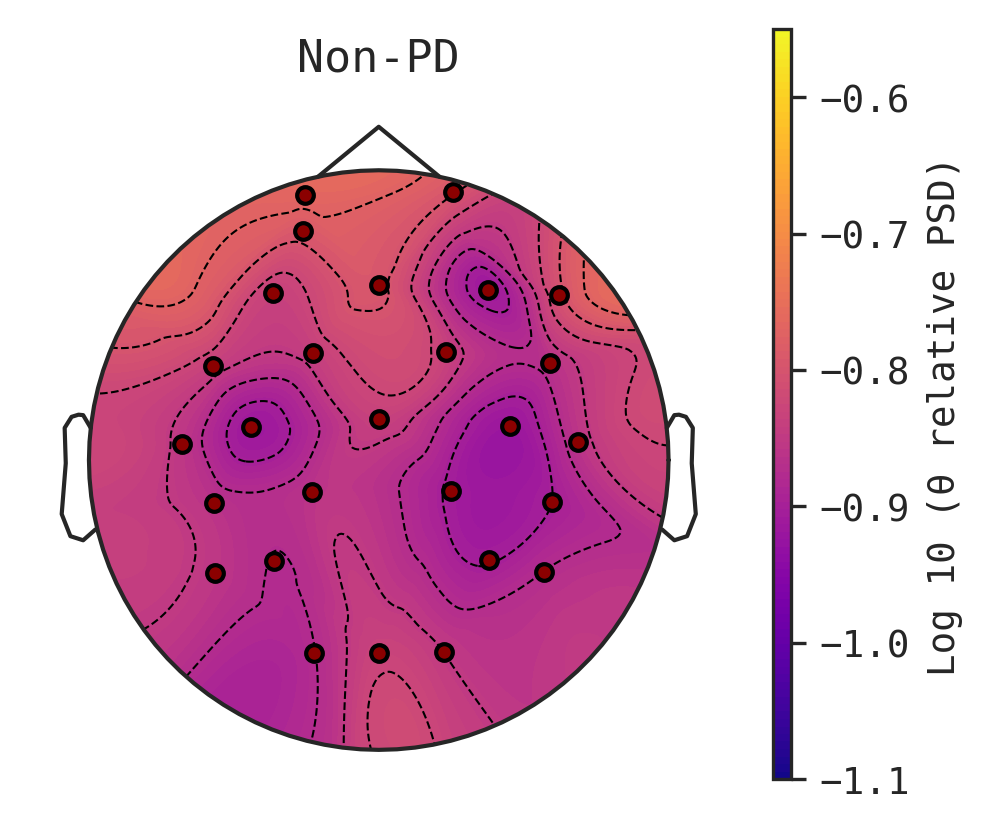

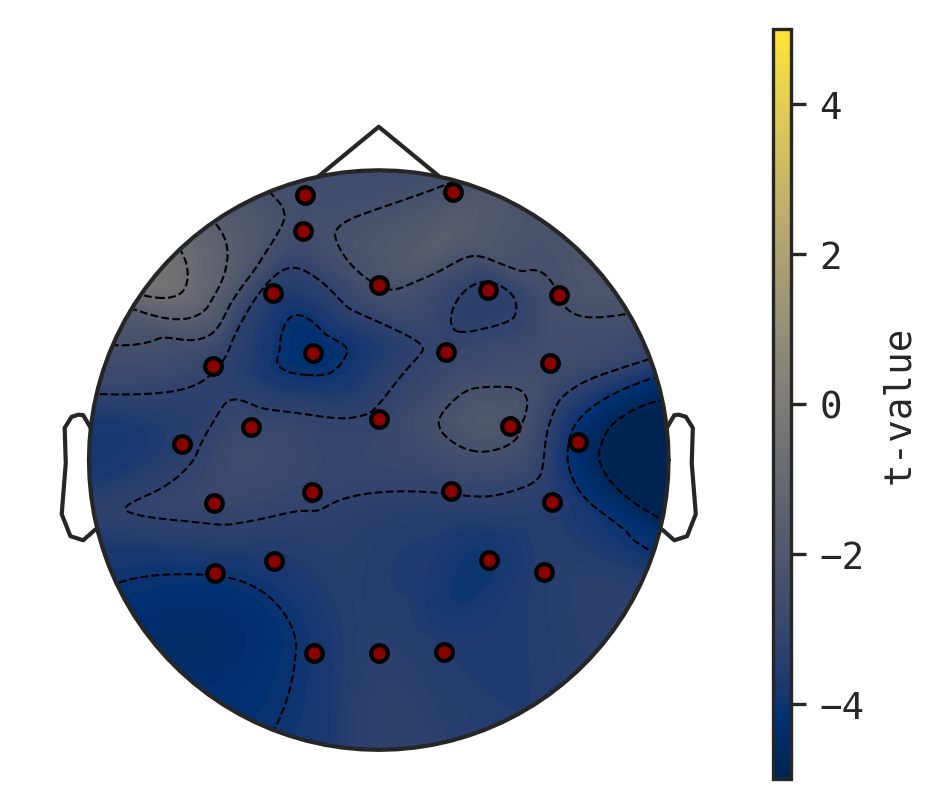

In [8]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_theta.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"], vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_theta.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_theta.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_t.png", dpi = 150)

### TOPOPLOTS PREALPHA

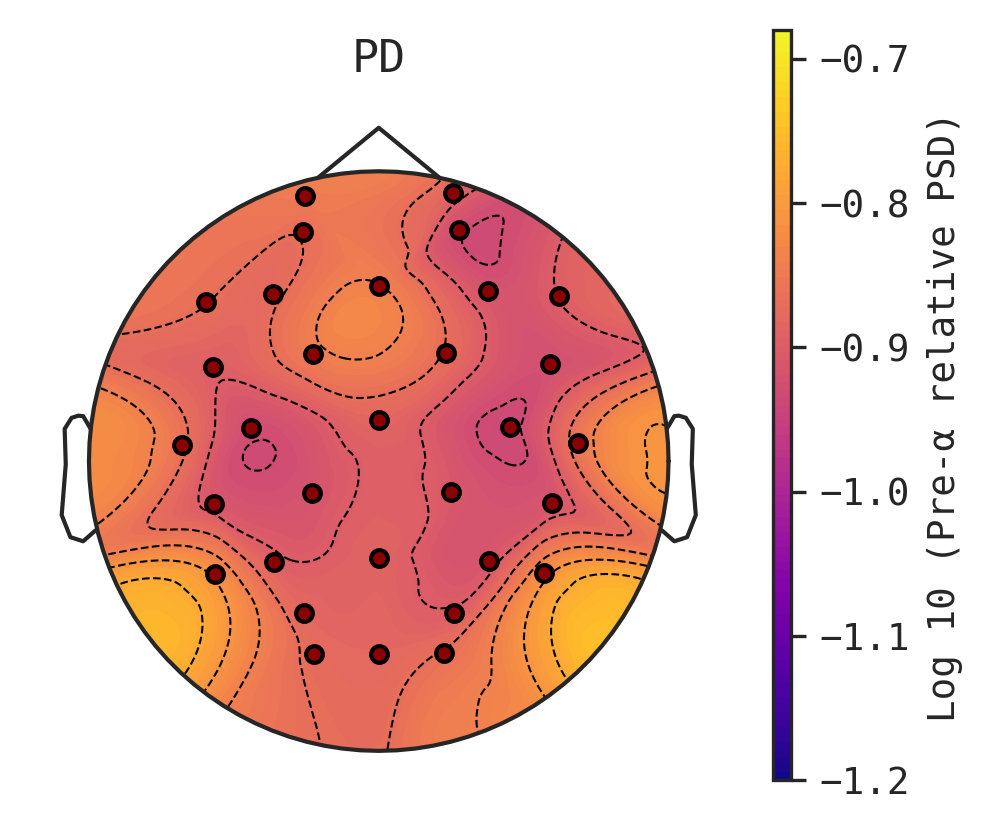

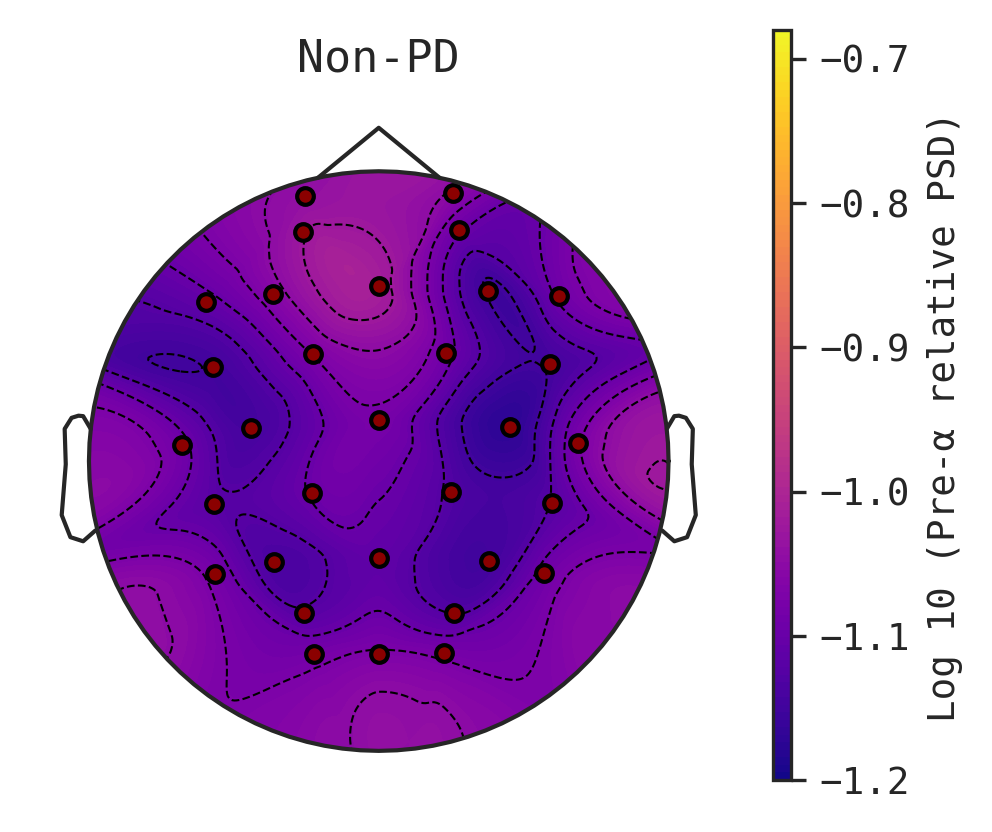

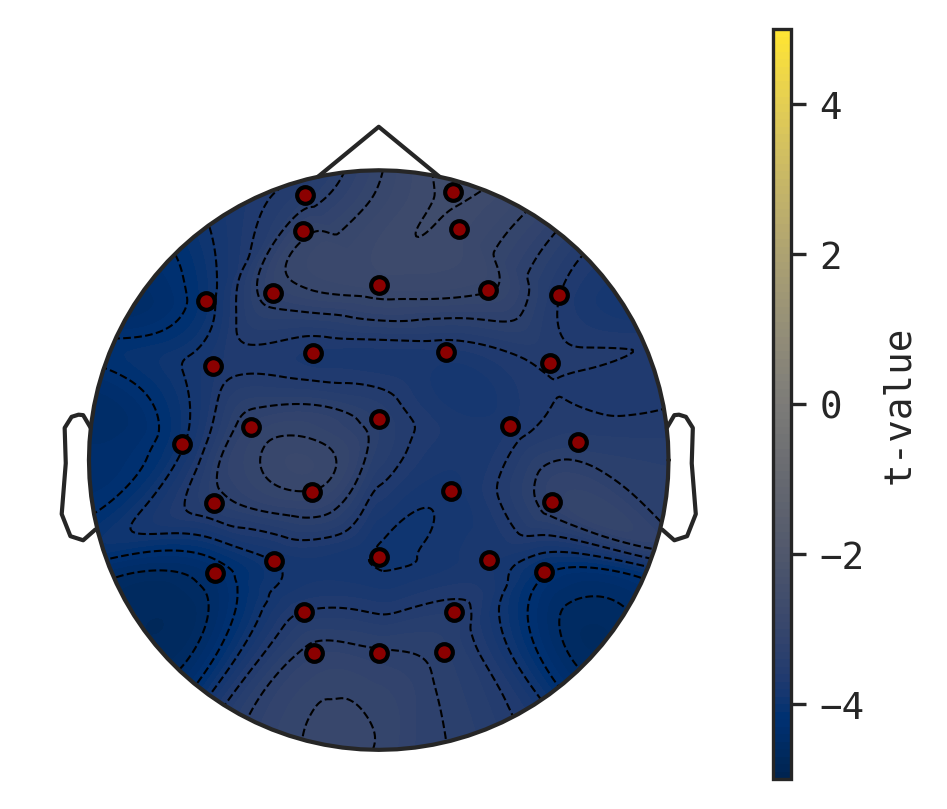

In [10]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_prealpha.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_prealpha.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_prealpha.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_prealpha.png", dpi = 150)

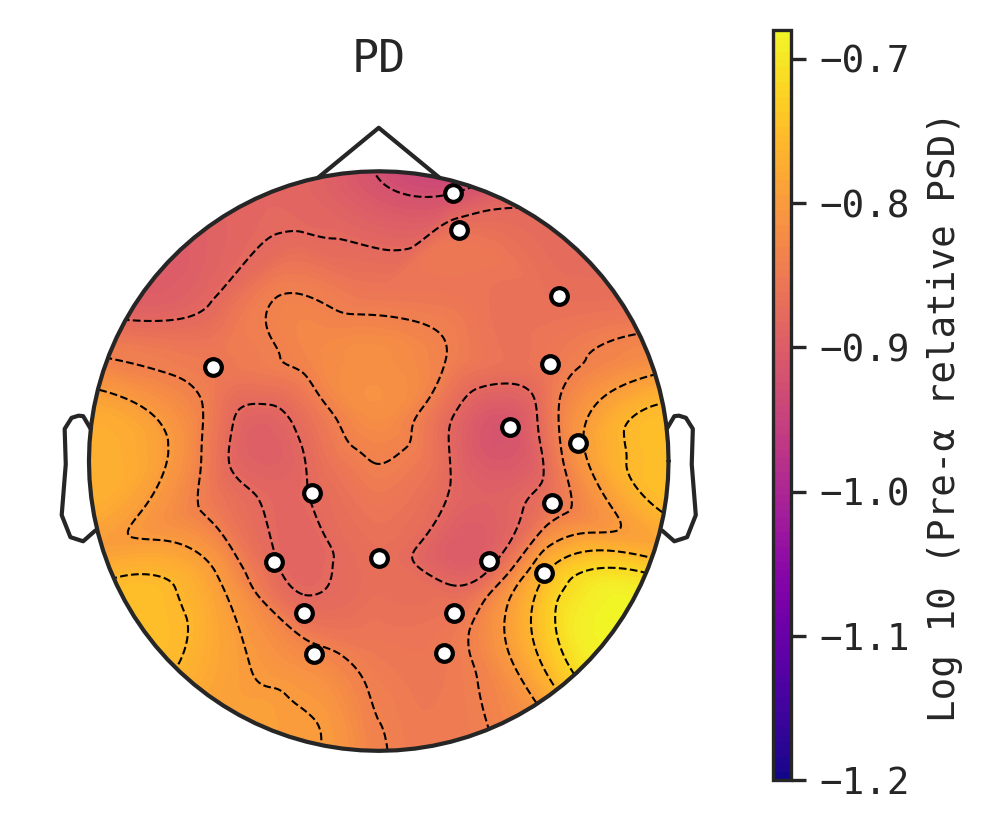

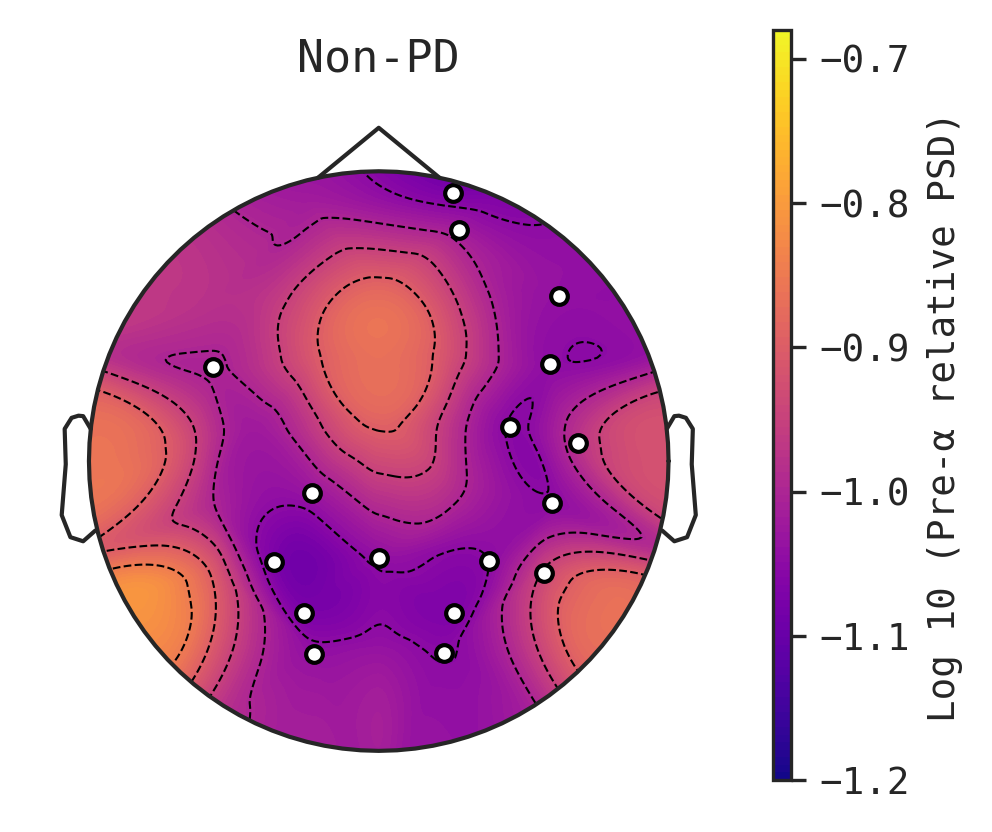

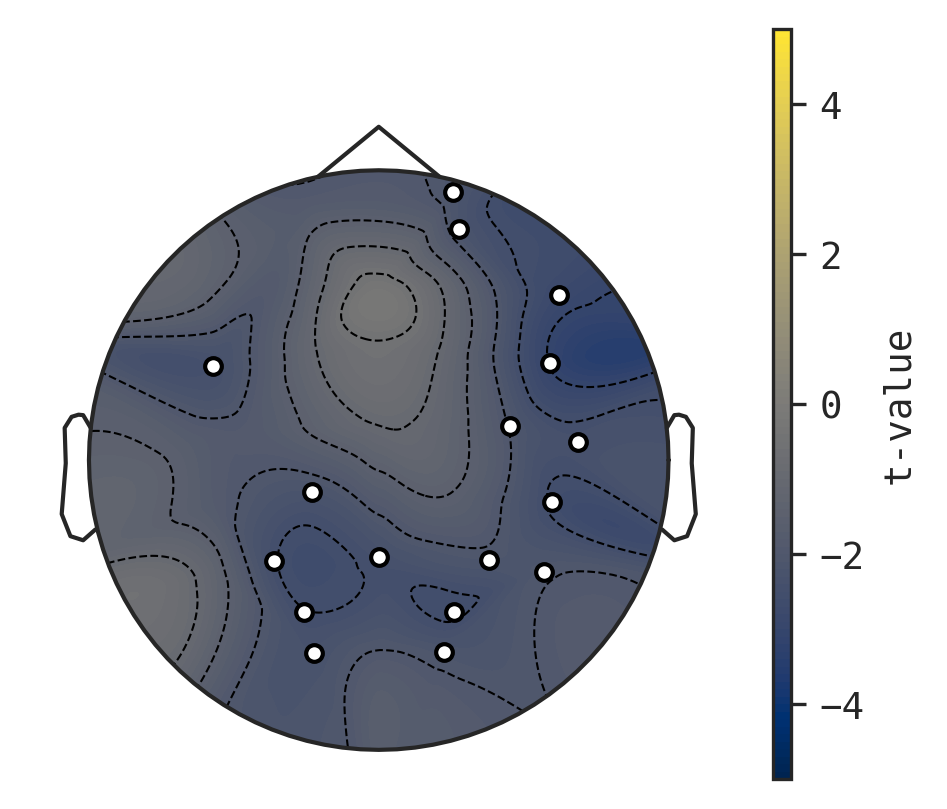

In [11]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_prealpha.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_pd_prealpha.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_hc_prealpha.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_prealpha.png", dpi = 150)

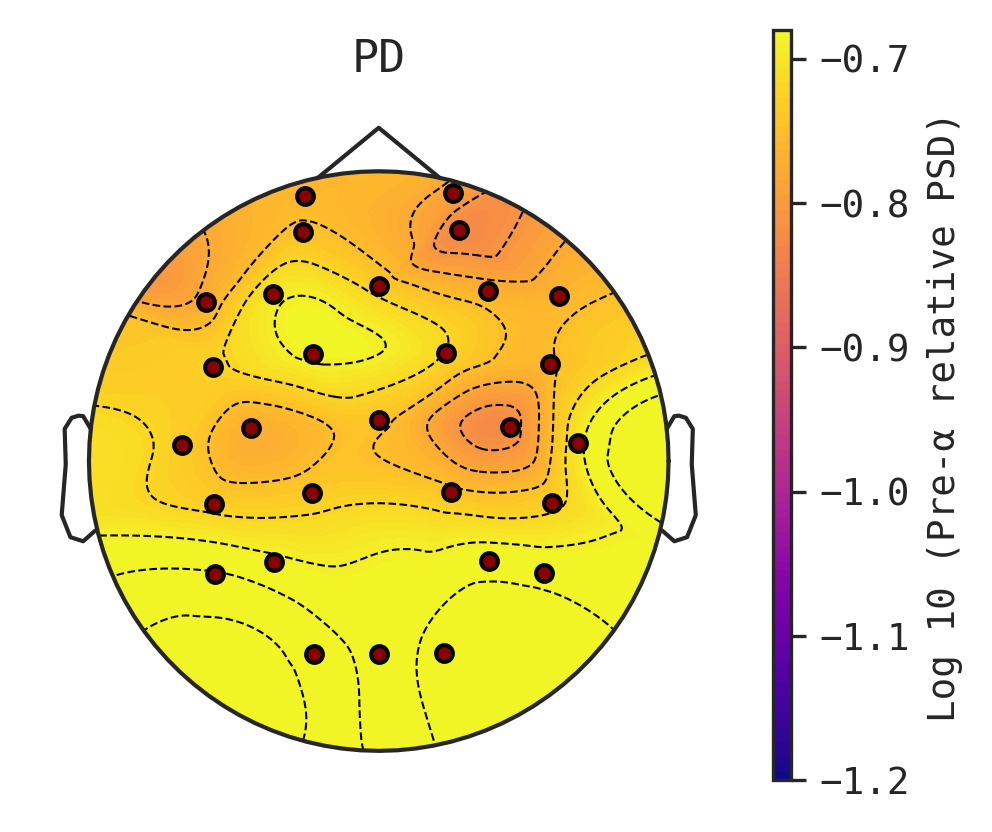

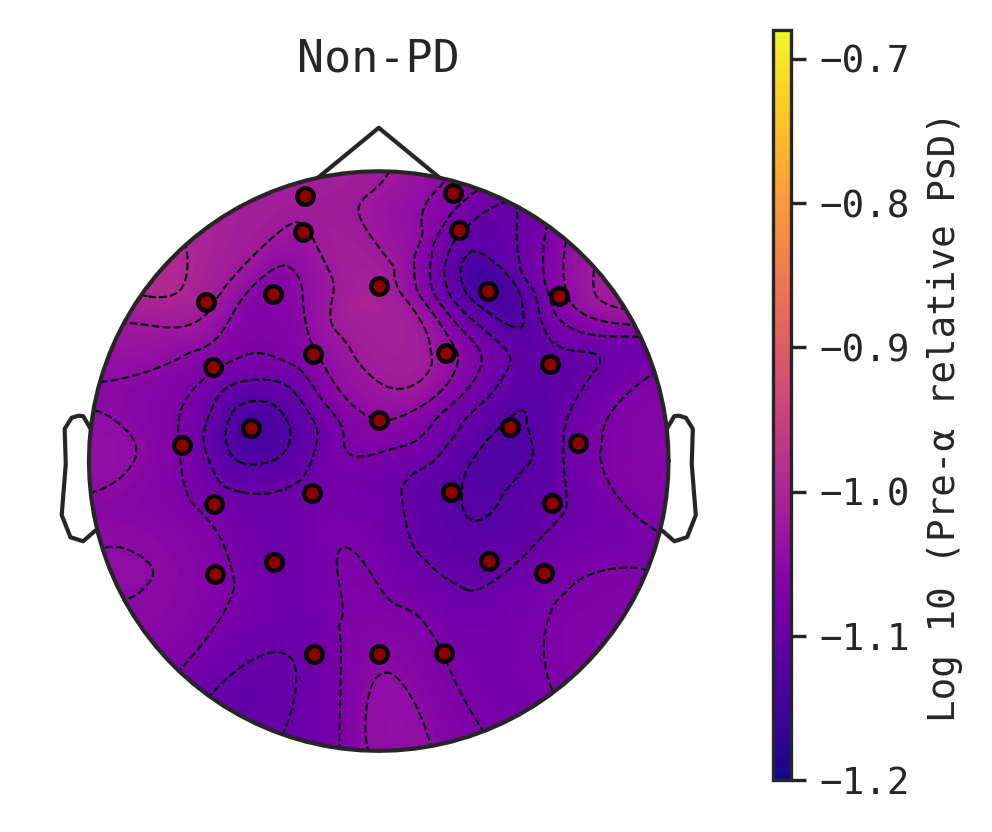

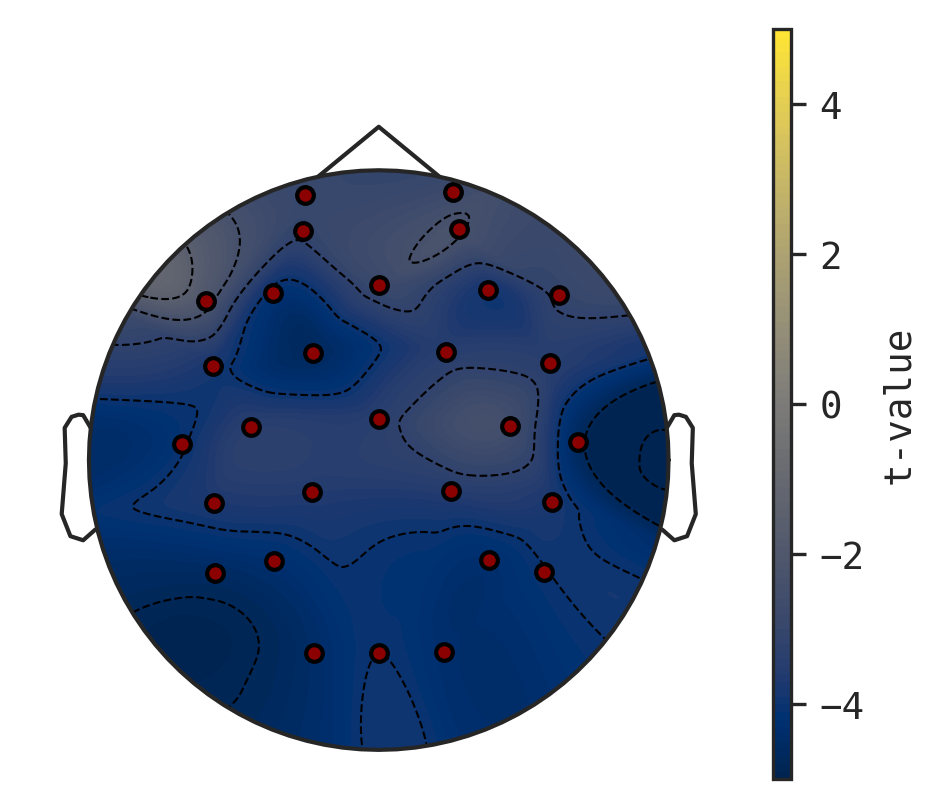

In [12]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_prealpha.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_prealpha.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_prealpha.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_prealpha.png", dpi = 150)

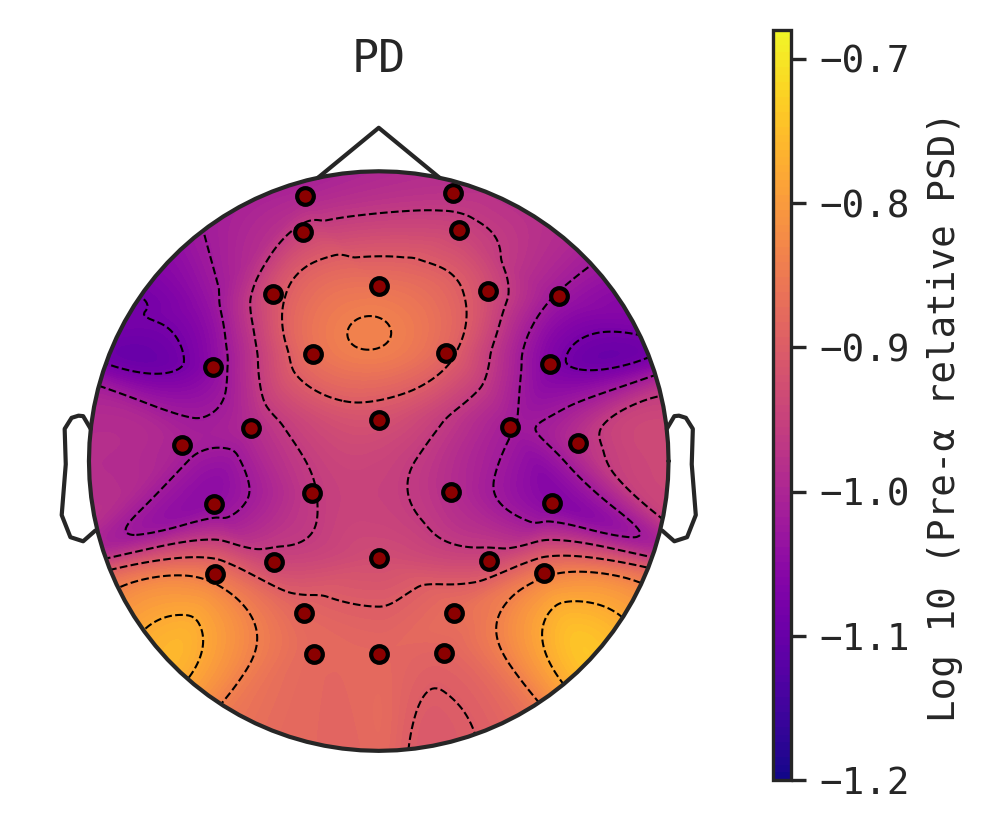

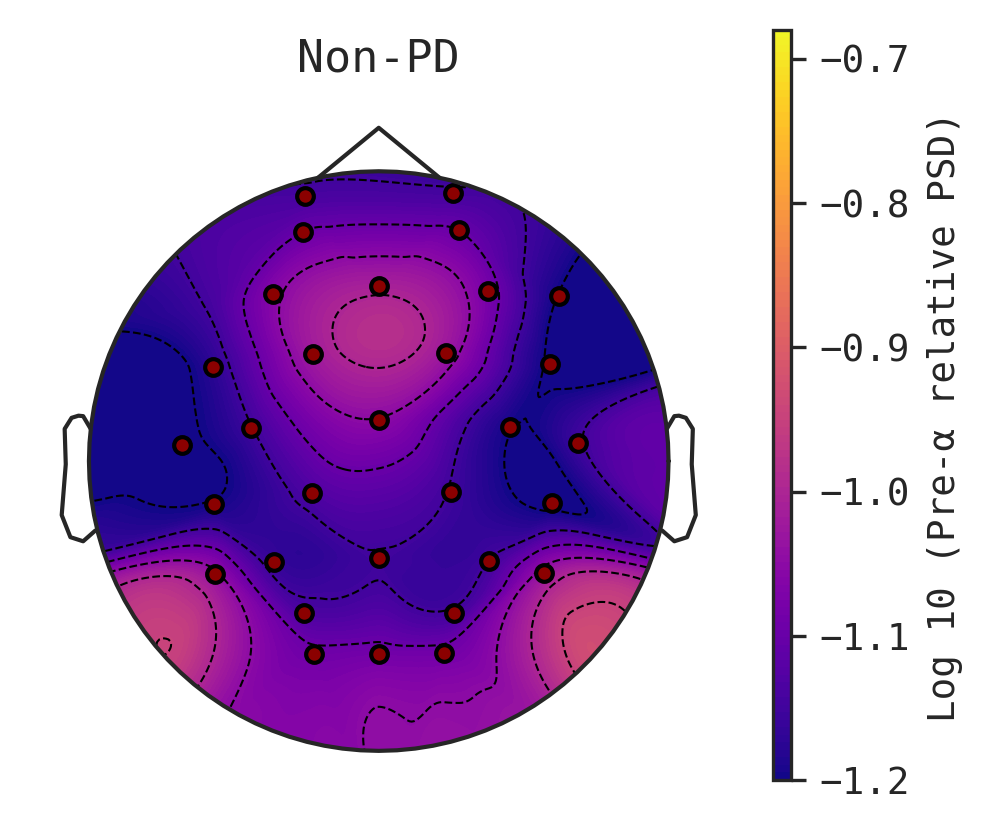

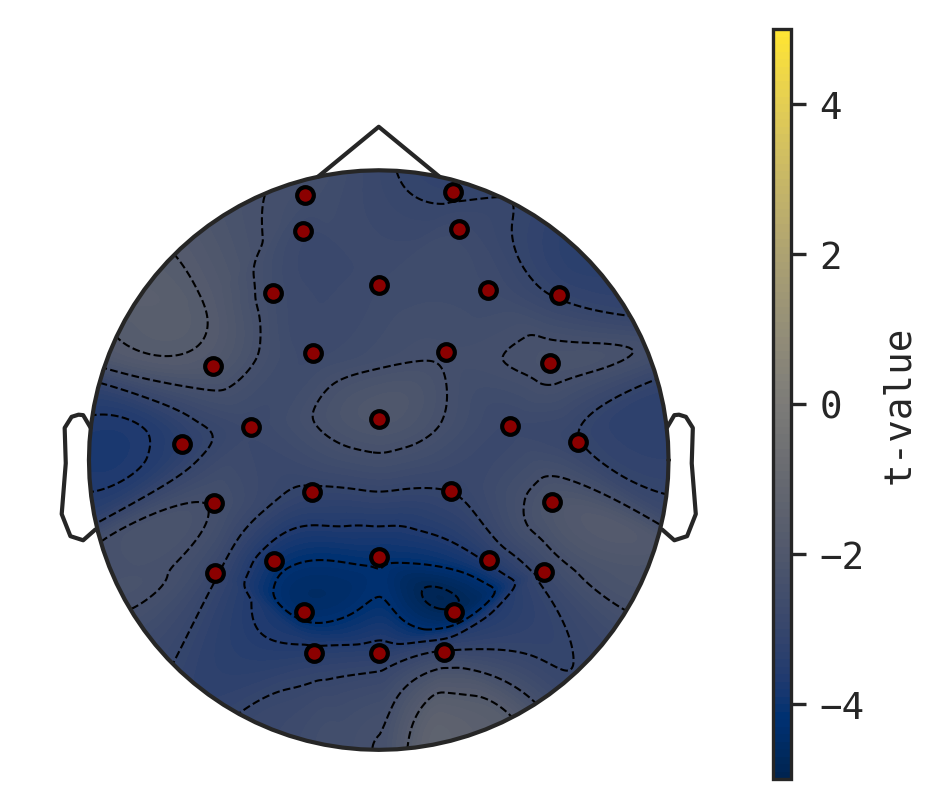

In [13]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_prealpha.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"], vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_pd_prealpha.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_hc_prealpha.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_prealpha.png", dpi = 150)

### TOPOPLOTS ATR

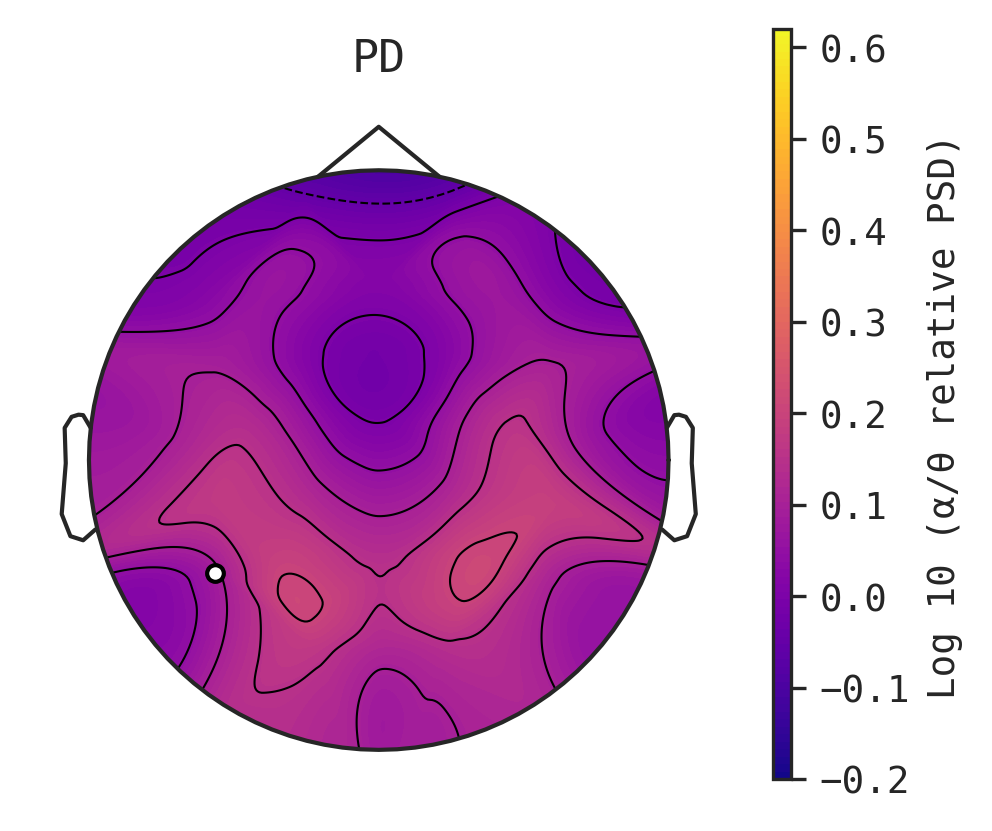

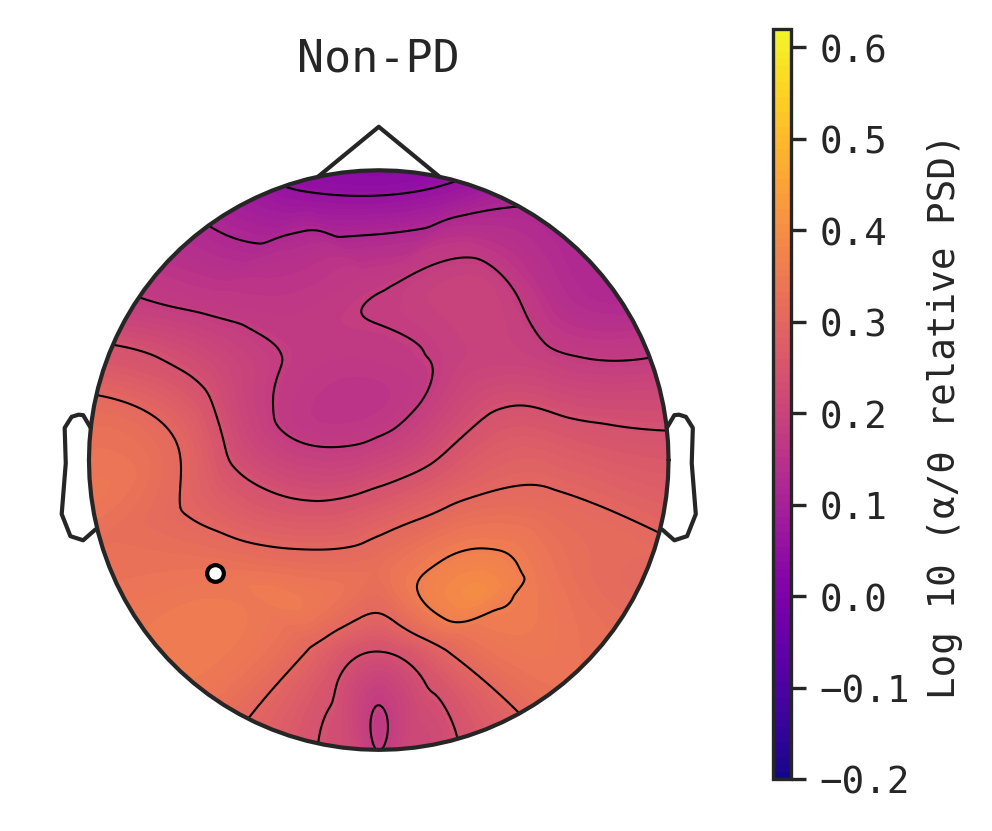

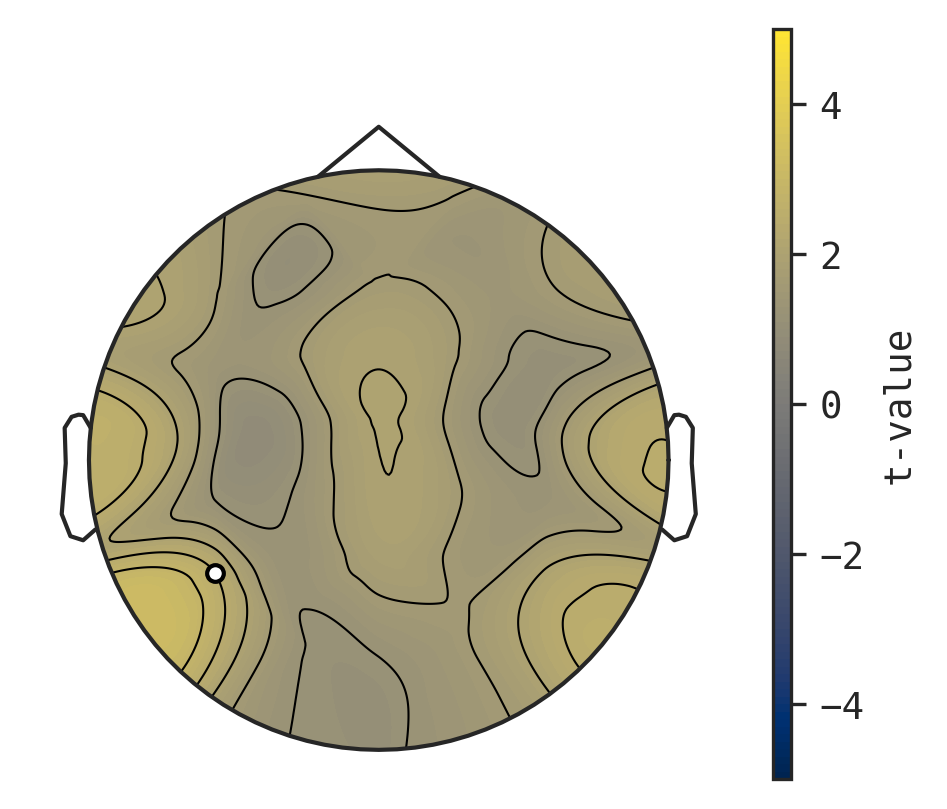

In [14]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_atr.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_pd_atr.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_hc_atr.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_atr.png", dpi = 150)

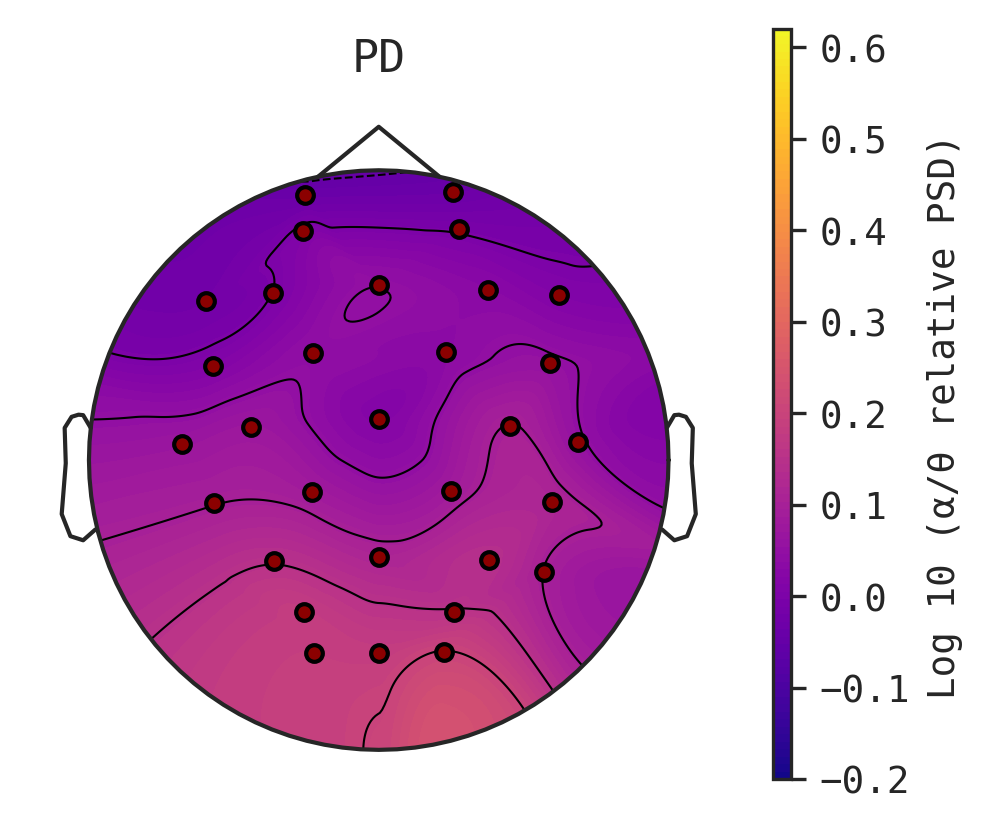

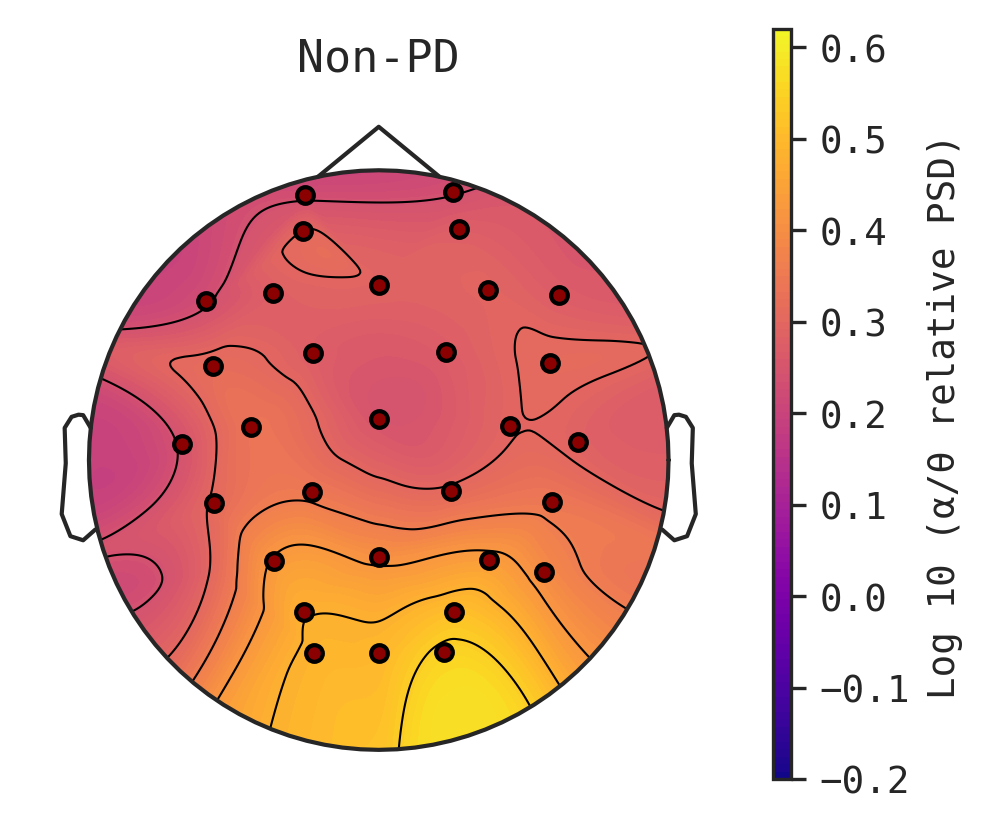

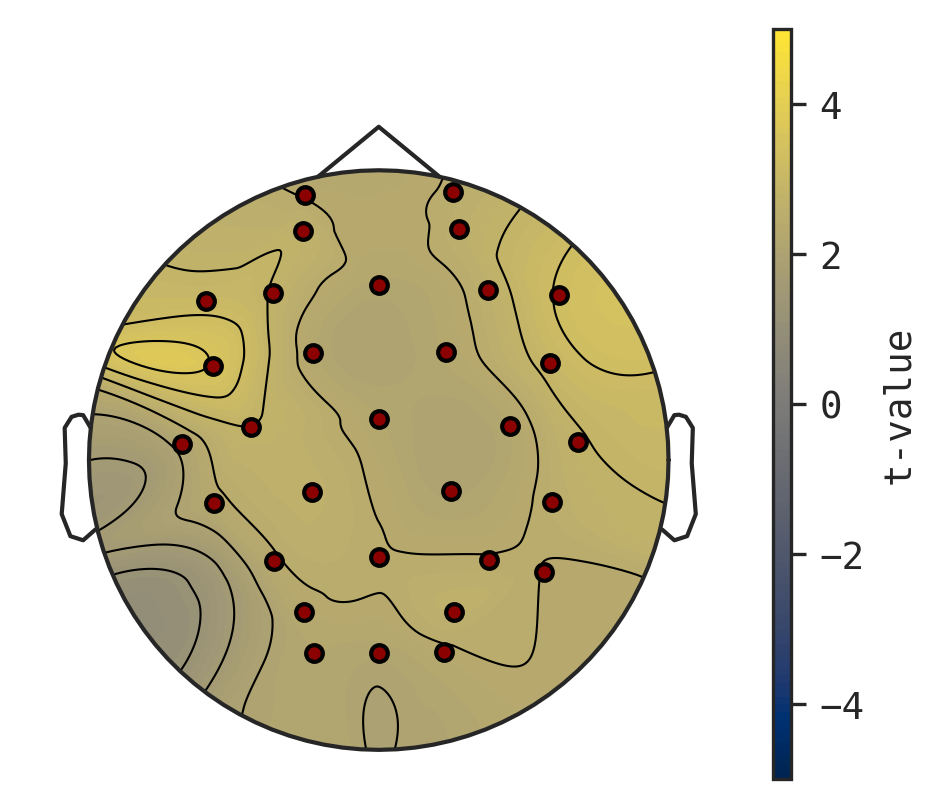

In [15]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_atr.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_pd_atr.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_hc_atr.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_atr.png", dpi = 150)

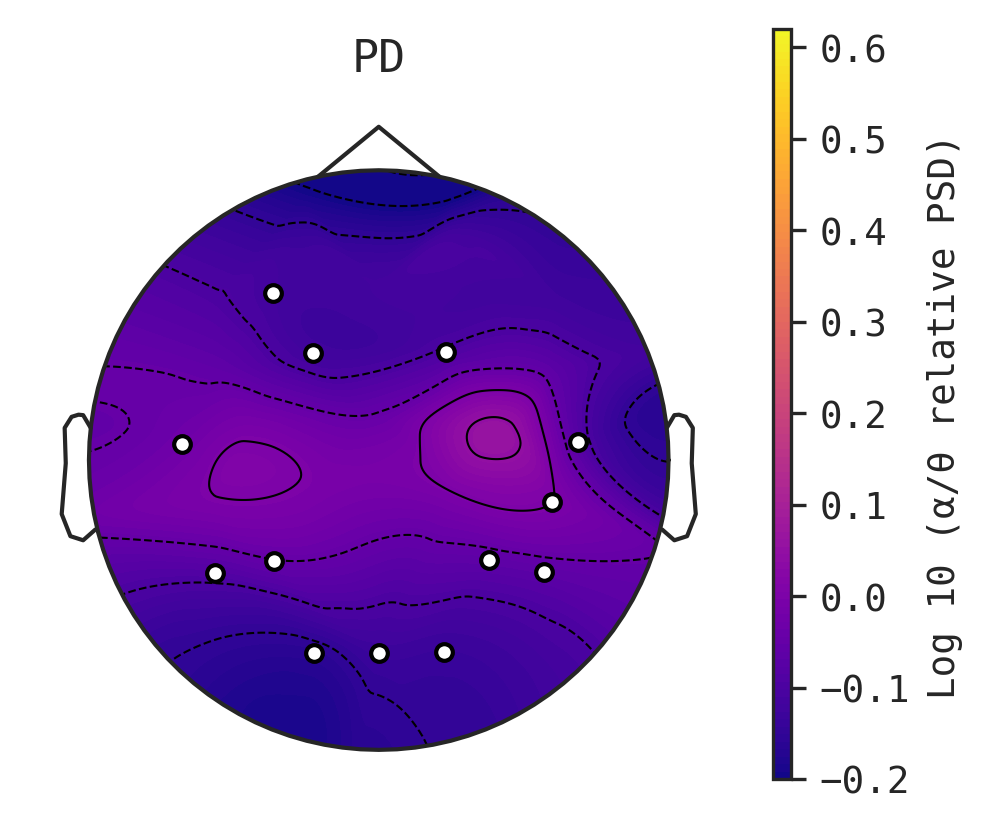

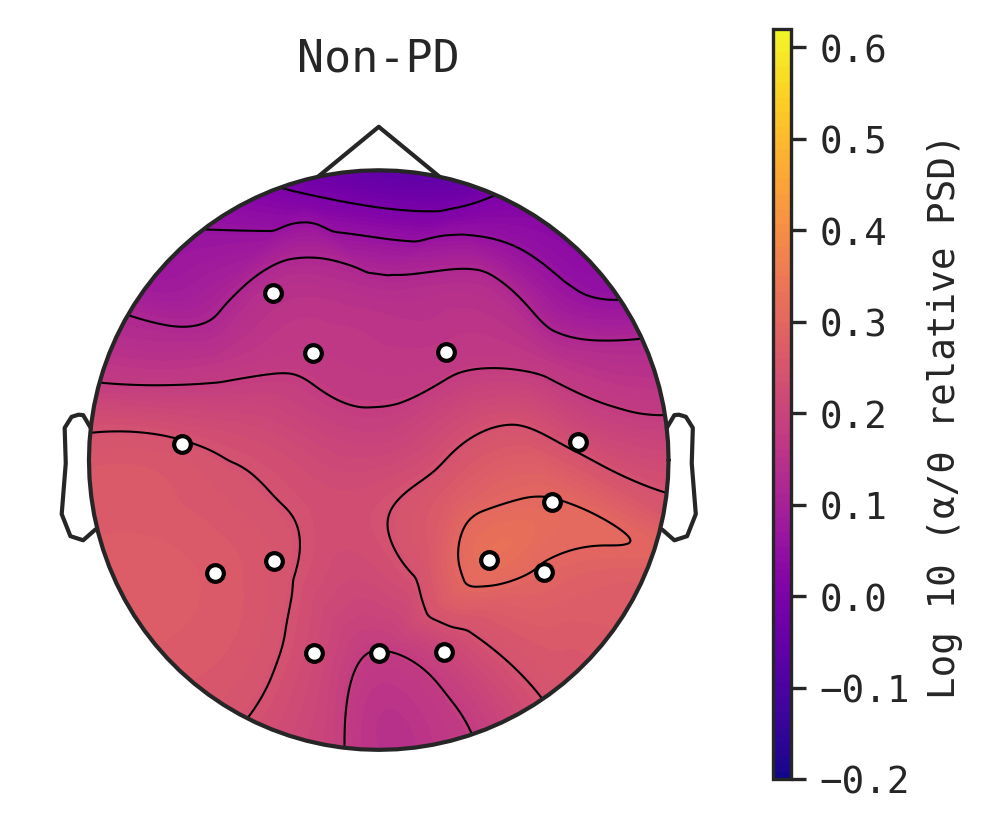

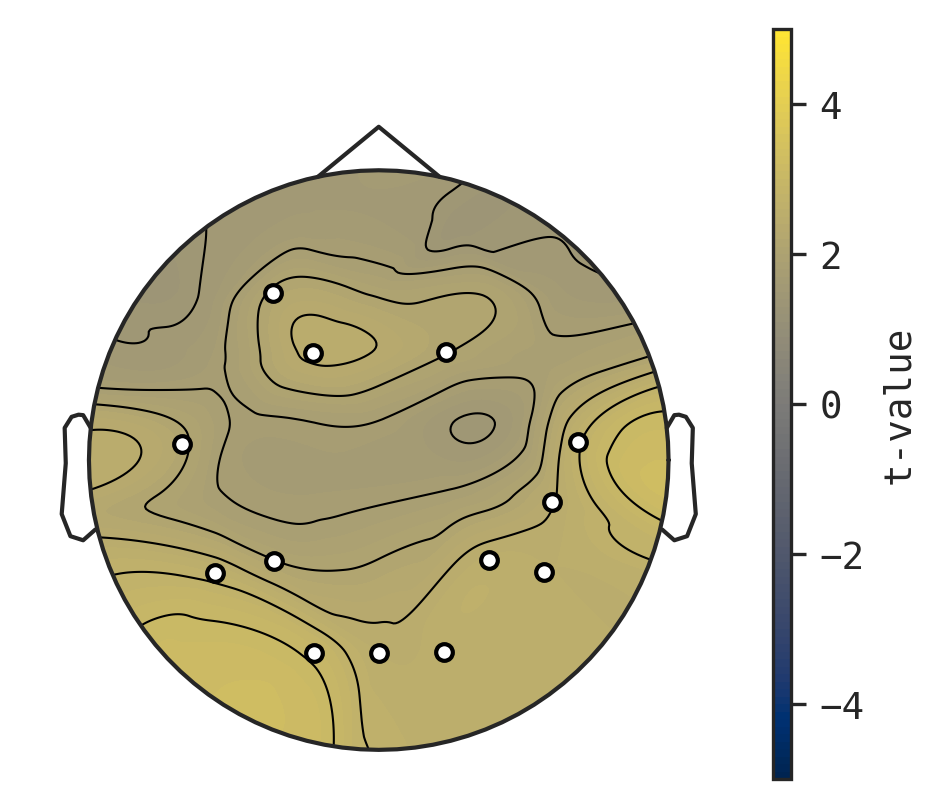

In [16]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_atr.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_pd_atr.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_hc_atr.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_atr.png", dpi = 150)

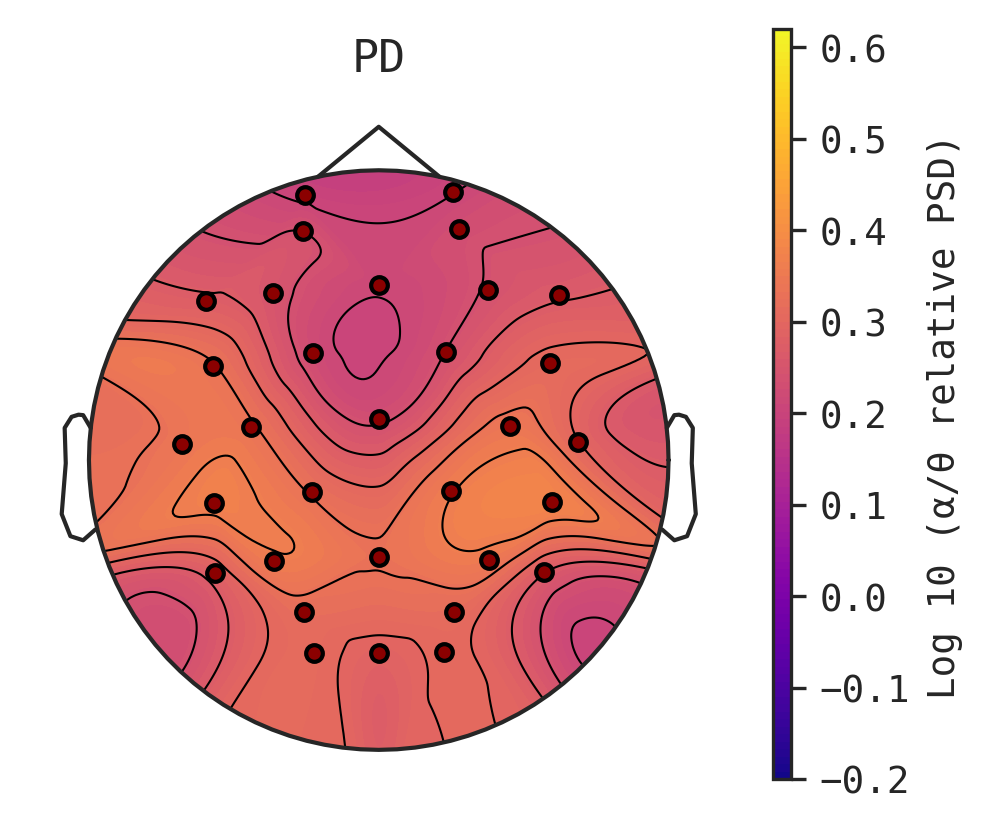

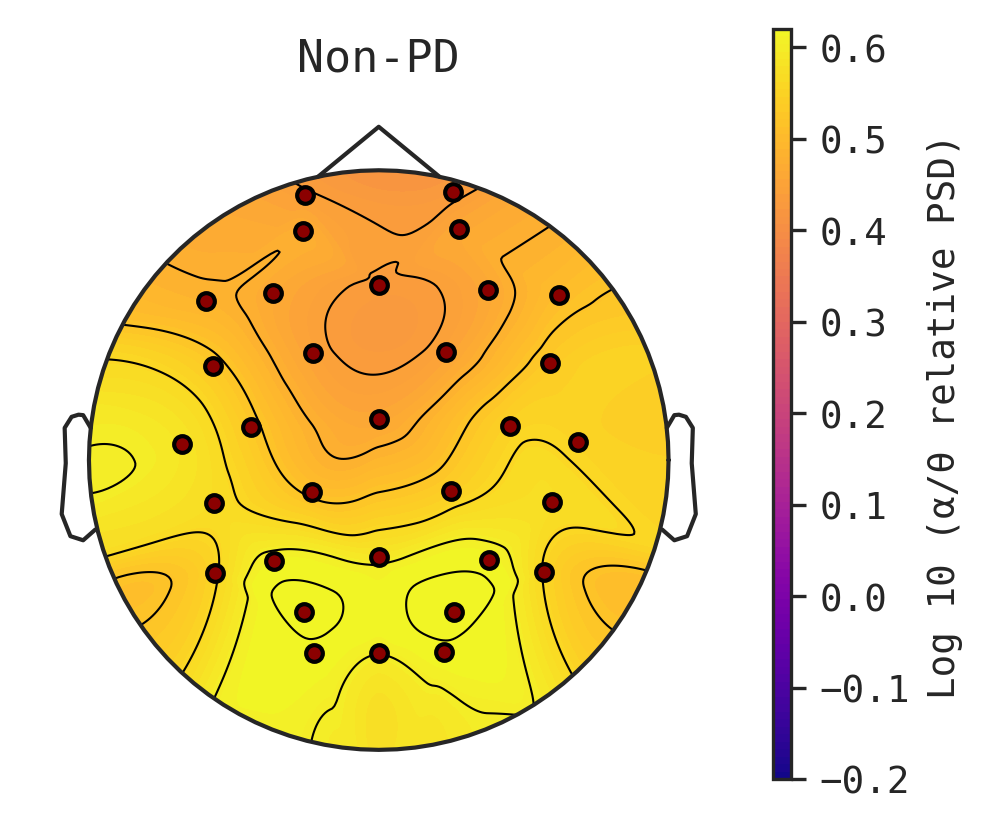

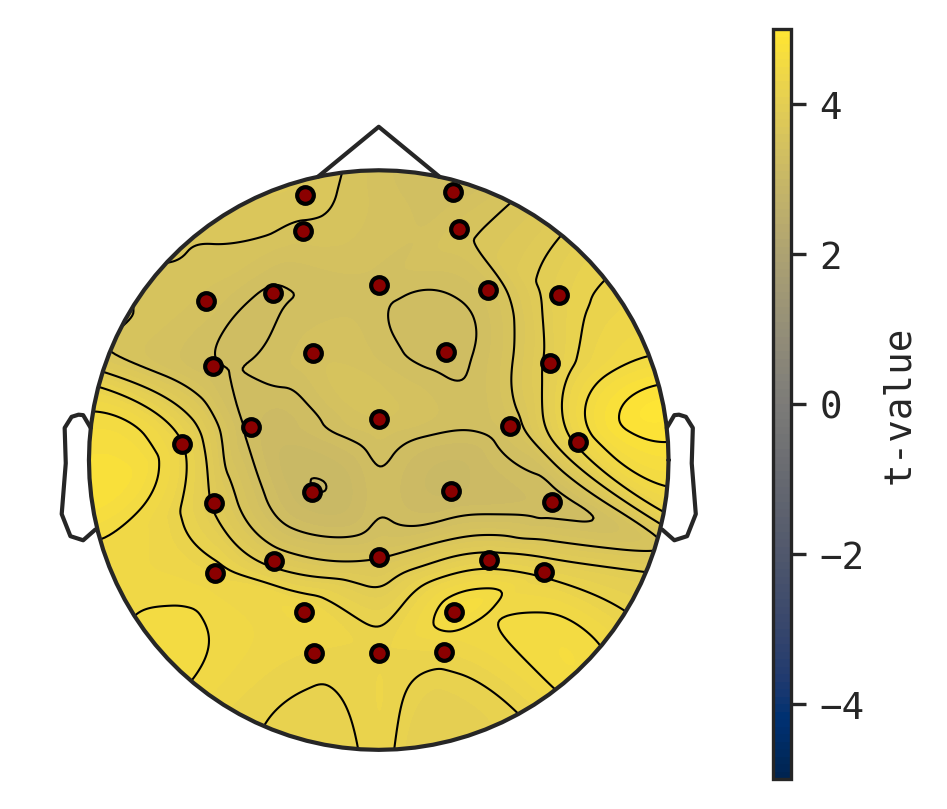

In [17]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_atr.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"], vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_pd_atr.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_hc_atr.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_atr.png", dpi = 150)

### TOPOPLOTS DF

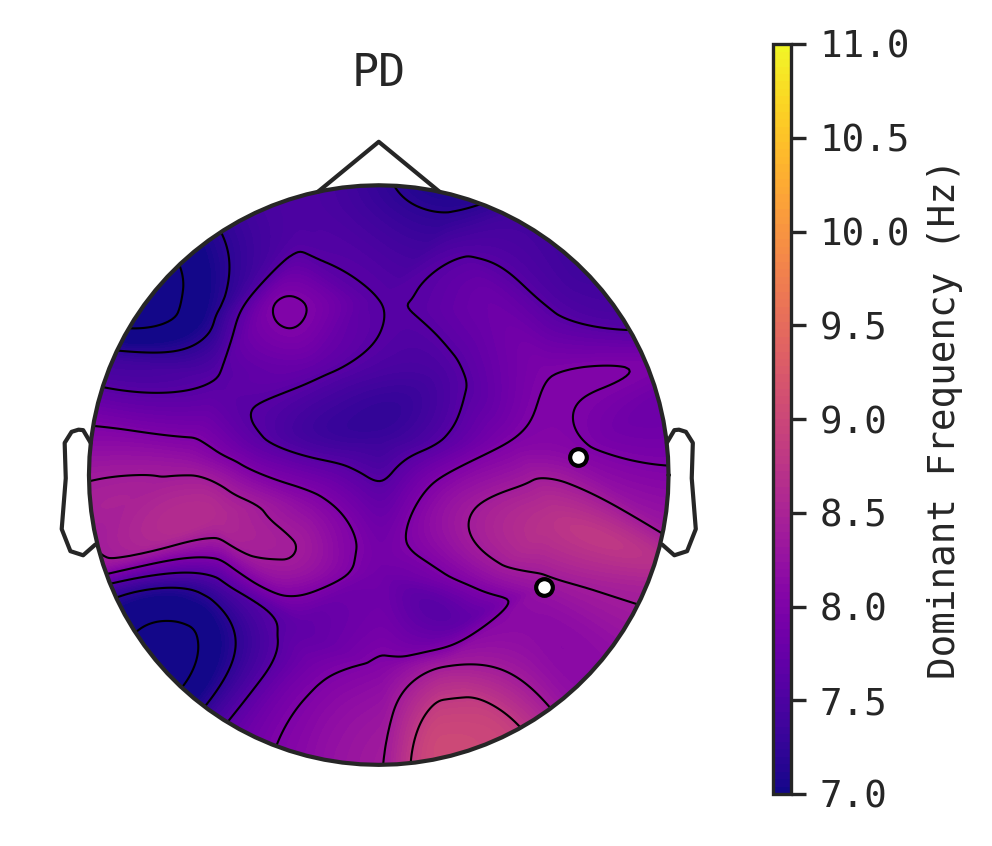

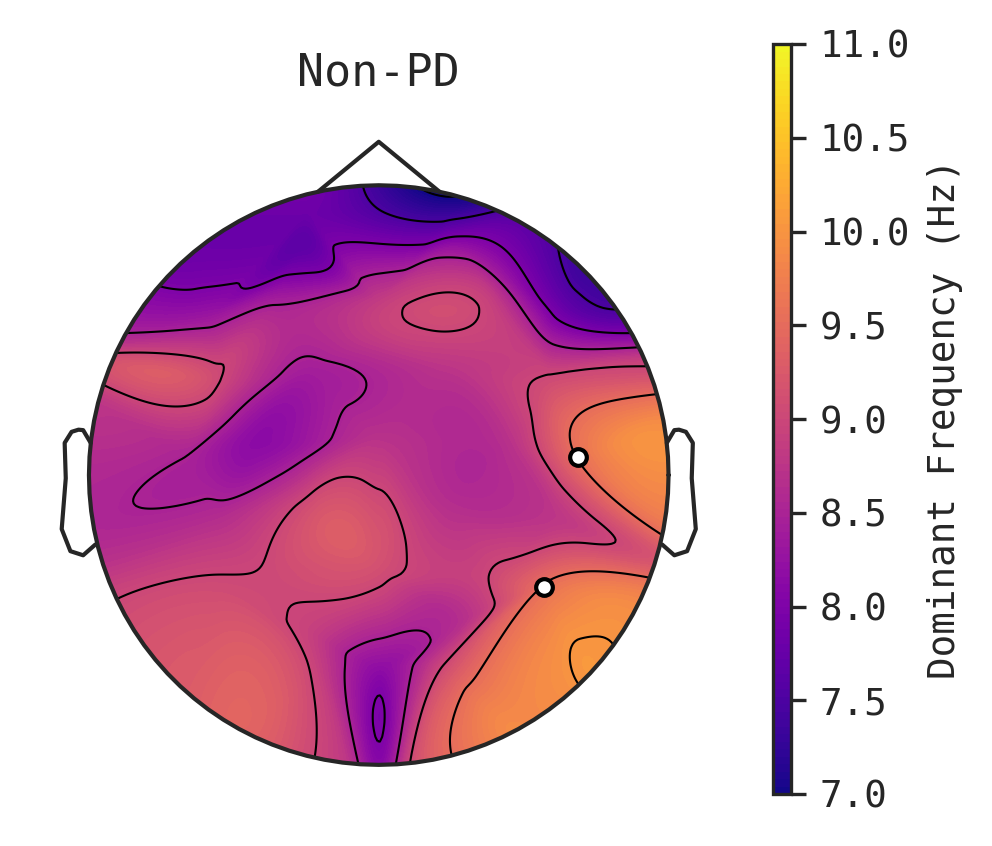

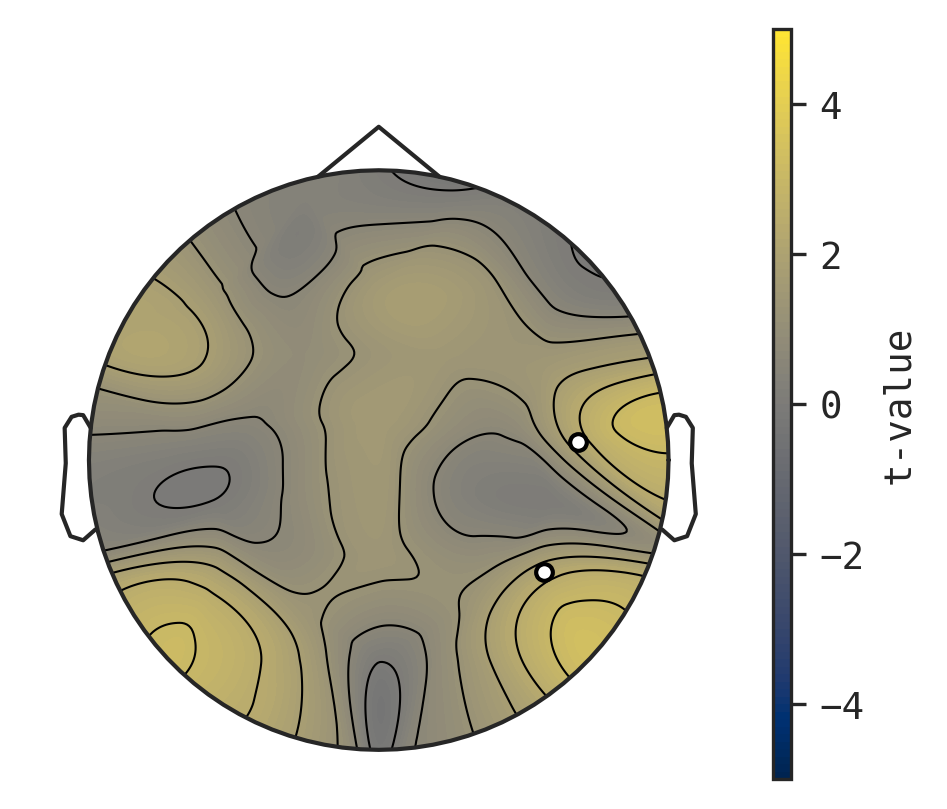

In [12]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_df.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin = 7, vmax = 11,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin = 7, vmax = 11,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_pd_df.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_hc_df.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_df.png", dpi = 150)

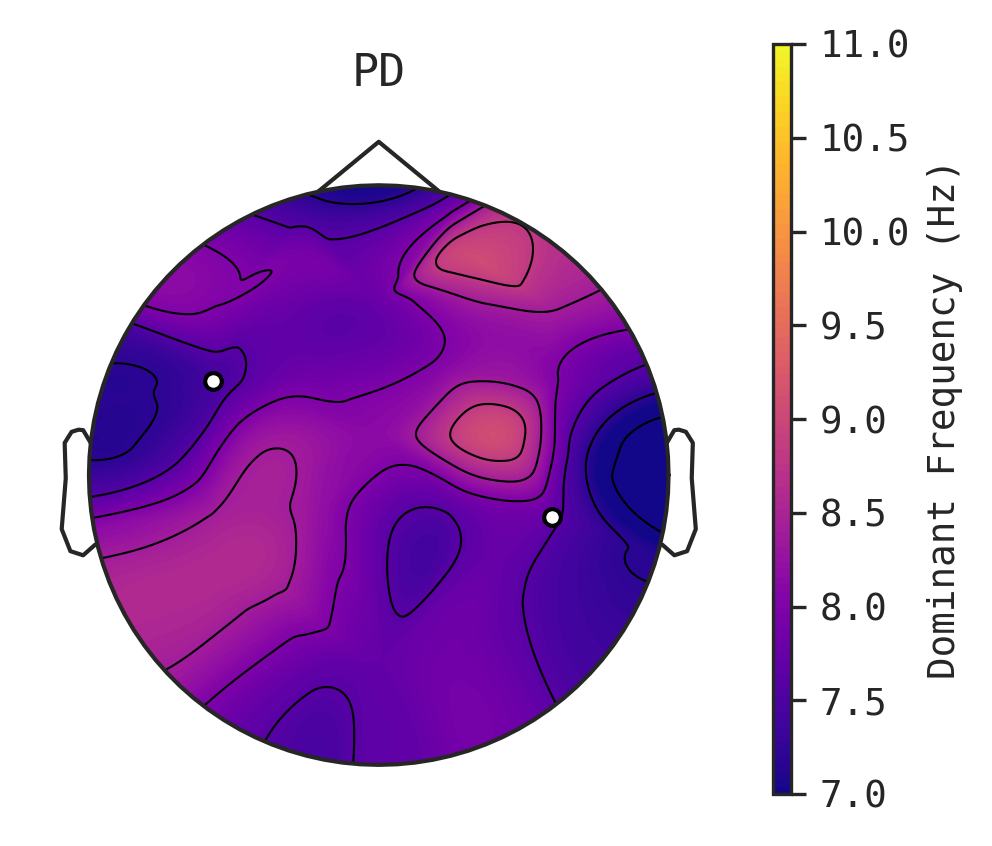

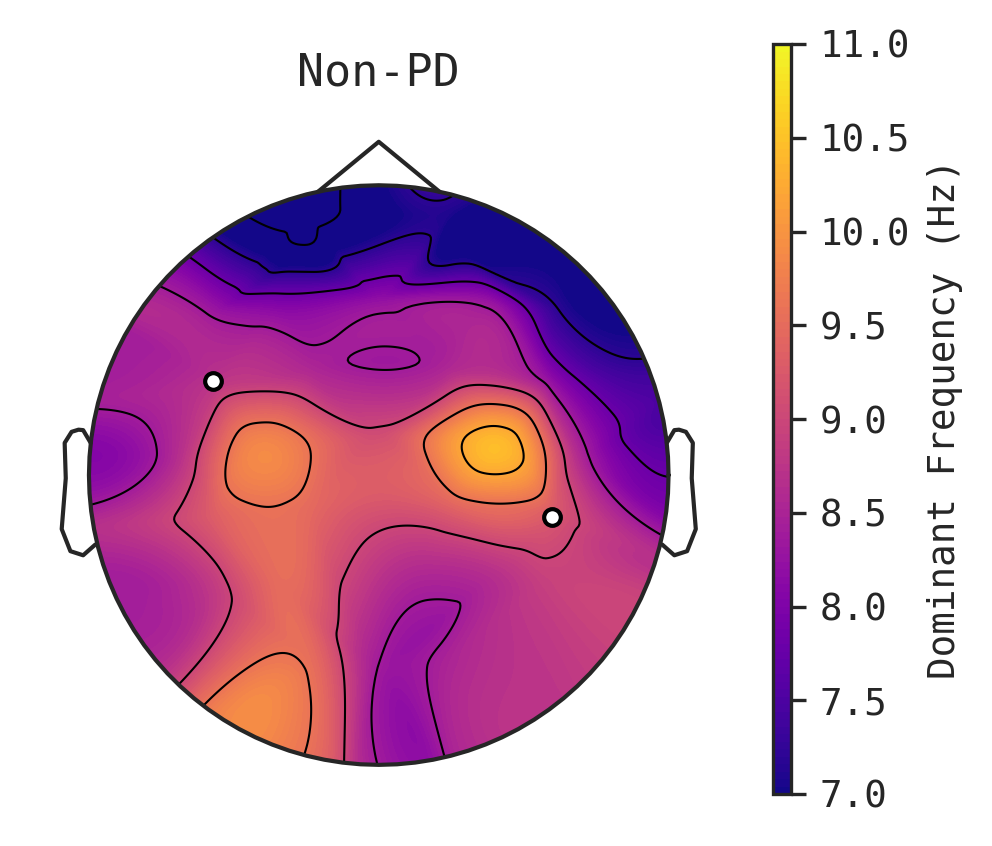

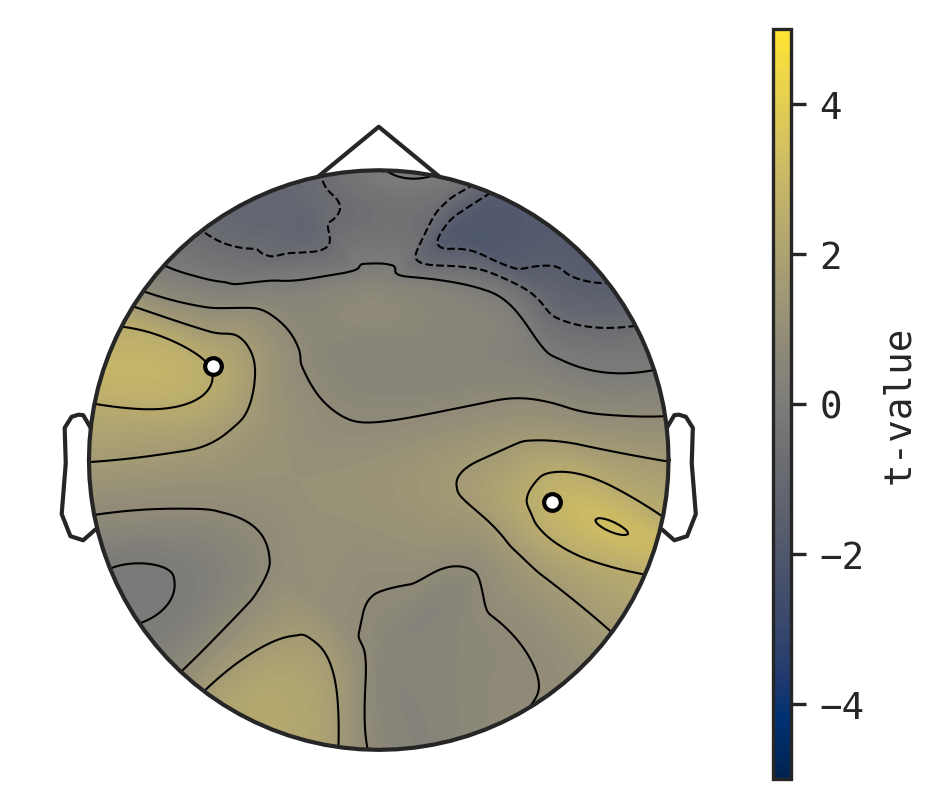

In [13]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_df.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"],  vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_pd_df.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_hc_df.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_df.png", dpi = 150)

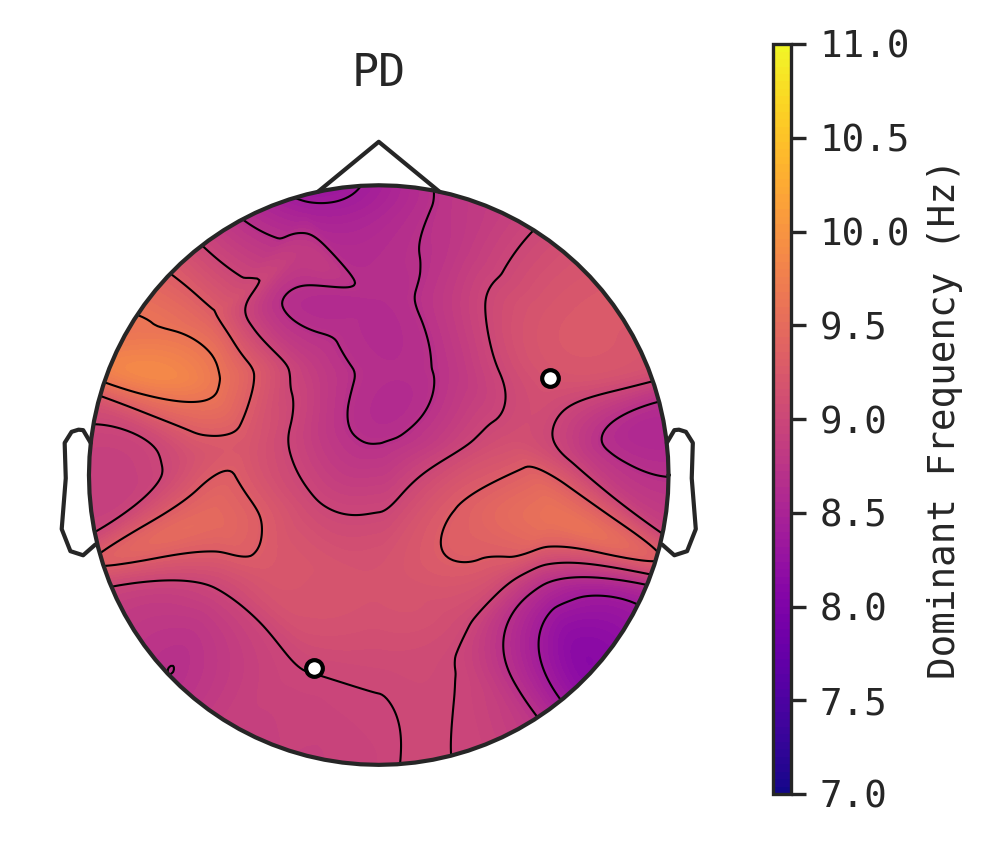

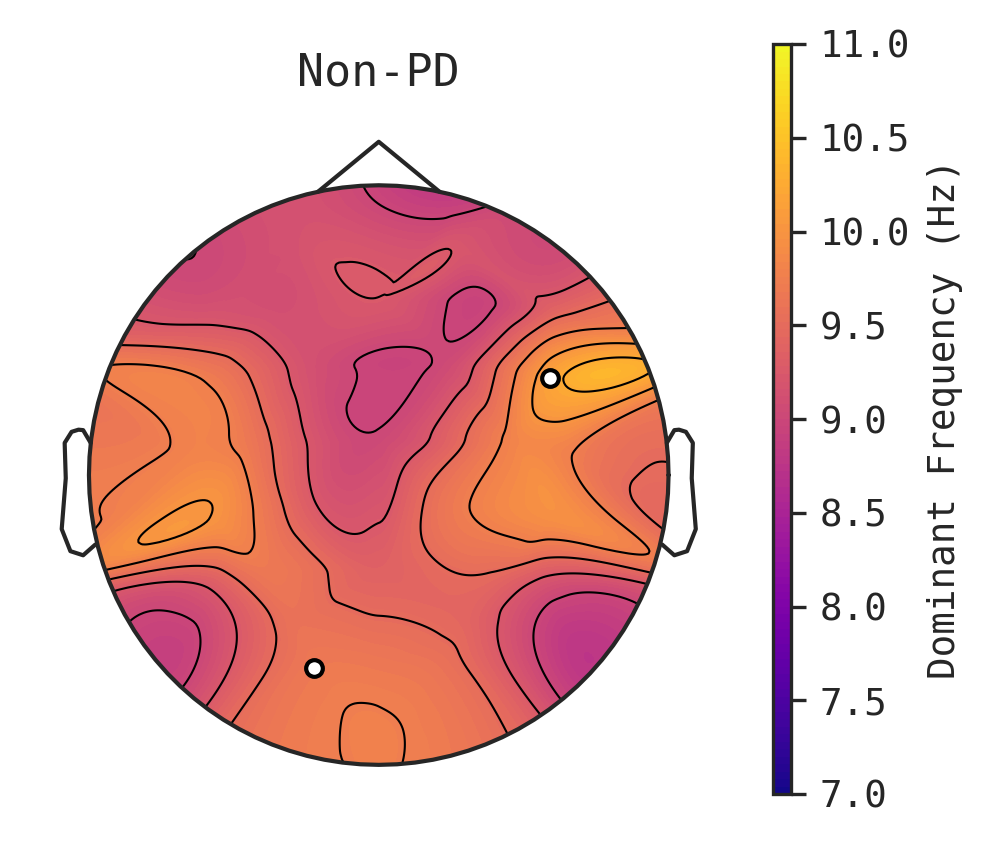

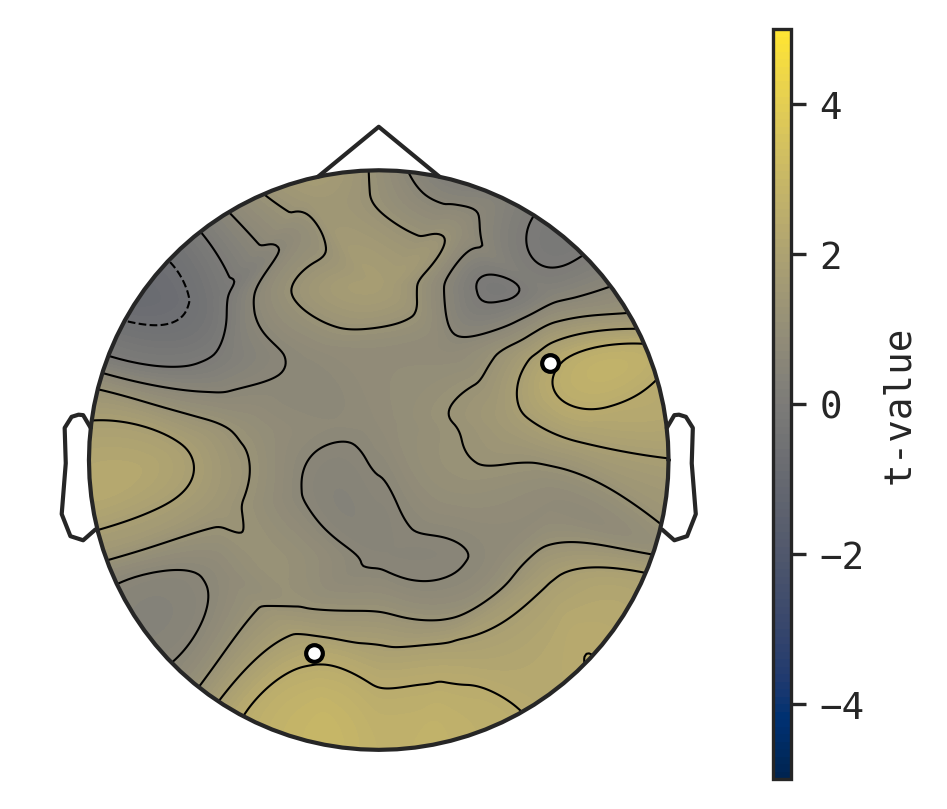

In [14]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_df.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"],  vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_pd_df.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_hc_df.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_df.png", dpi = 150)

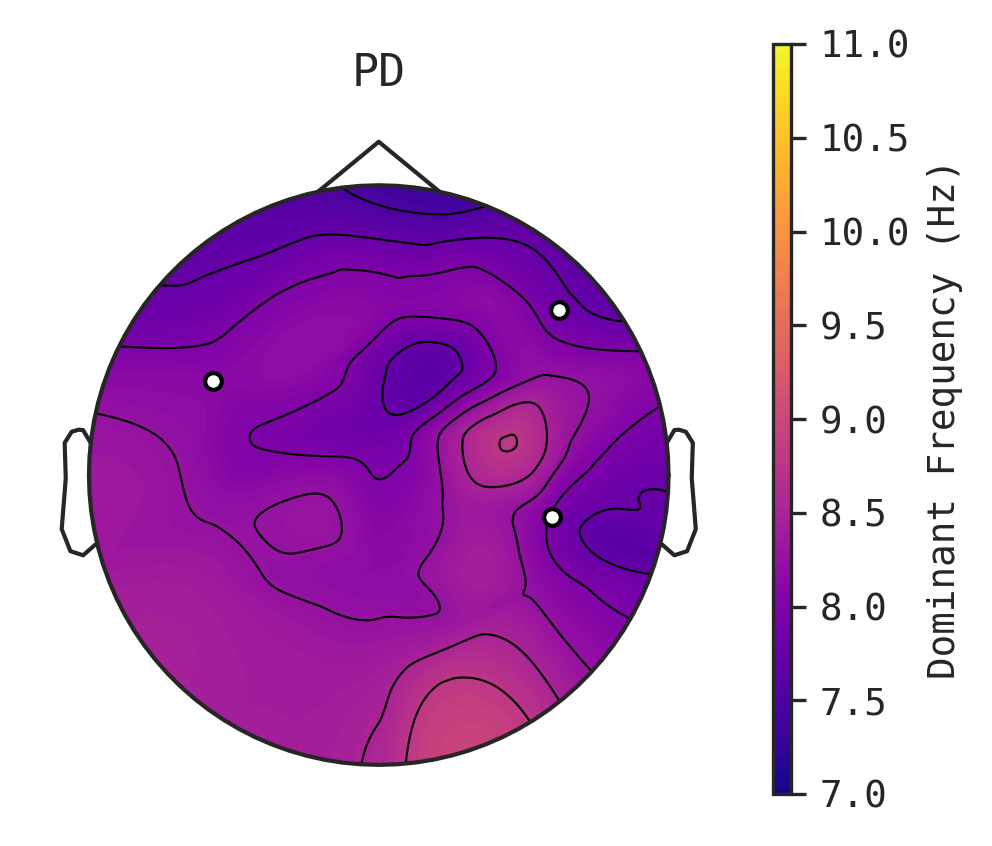

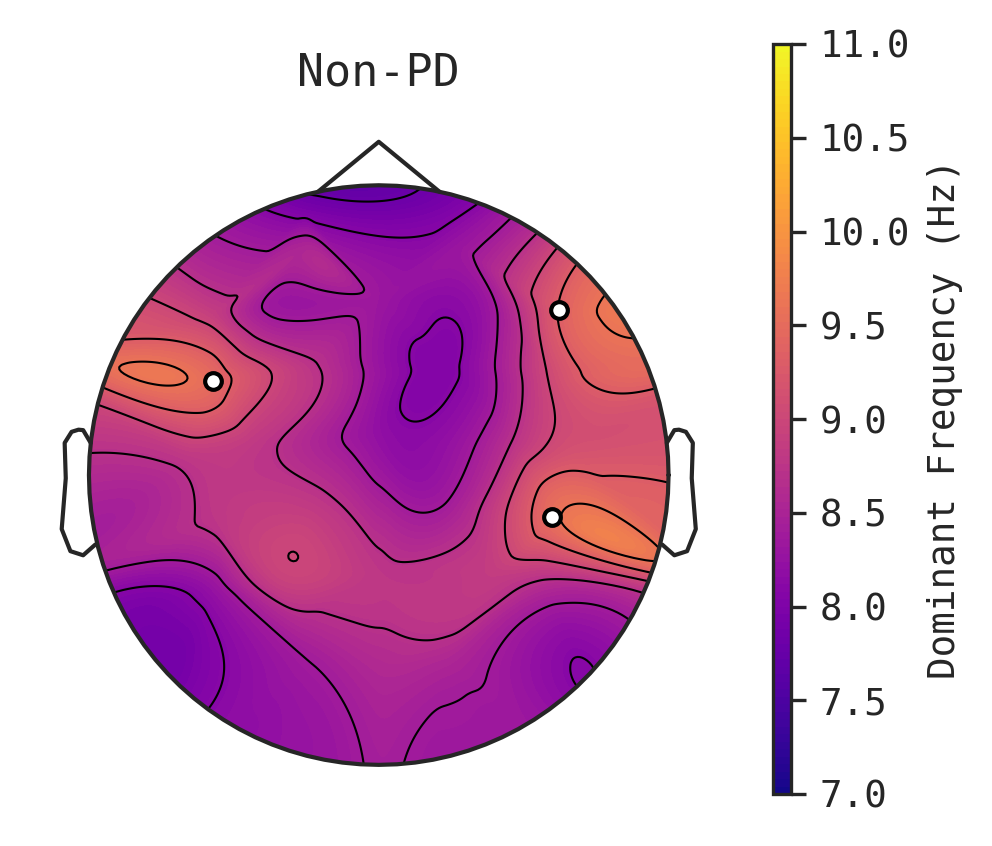

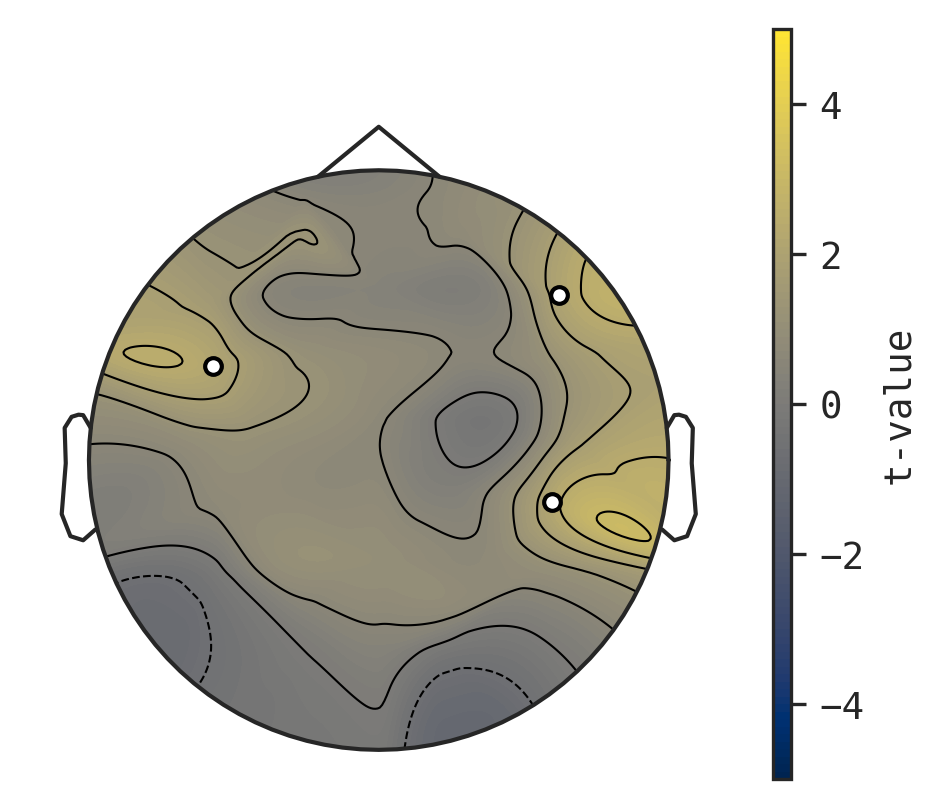

In [15]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_df.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"],  vmin = 7, vmax = 11, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_pd_df.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_hc_df.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_df.png", dpi = 150)

DFV

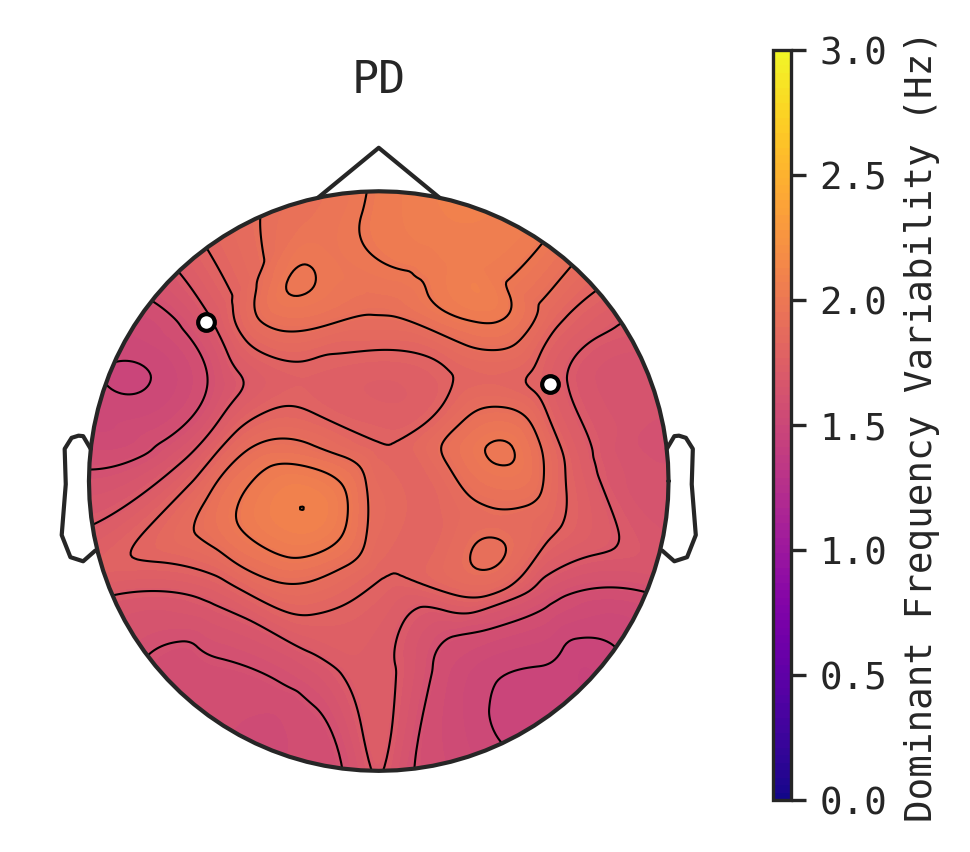

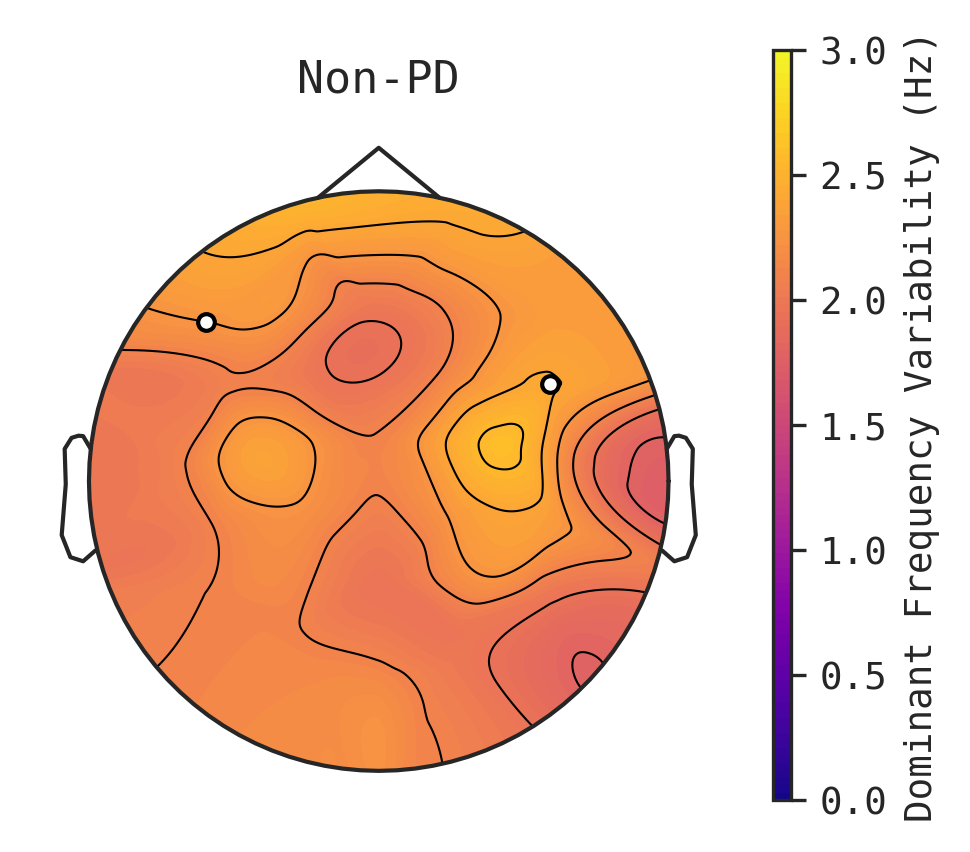

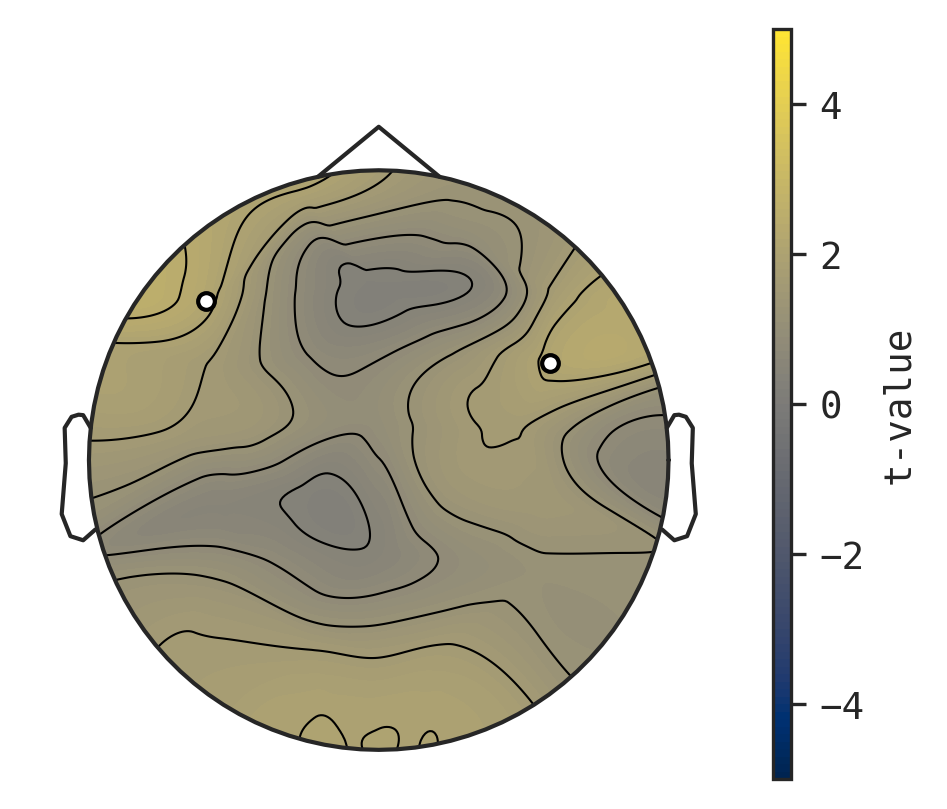

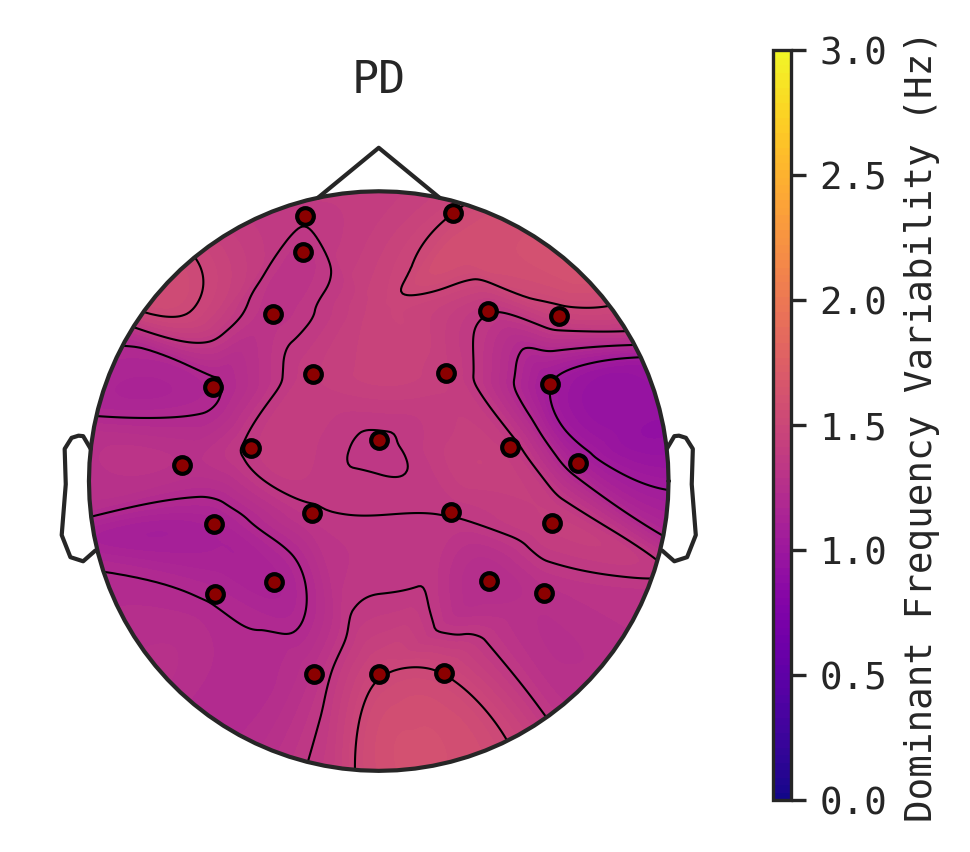

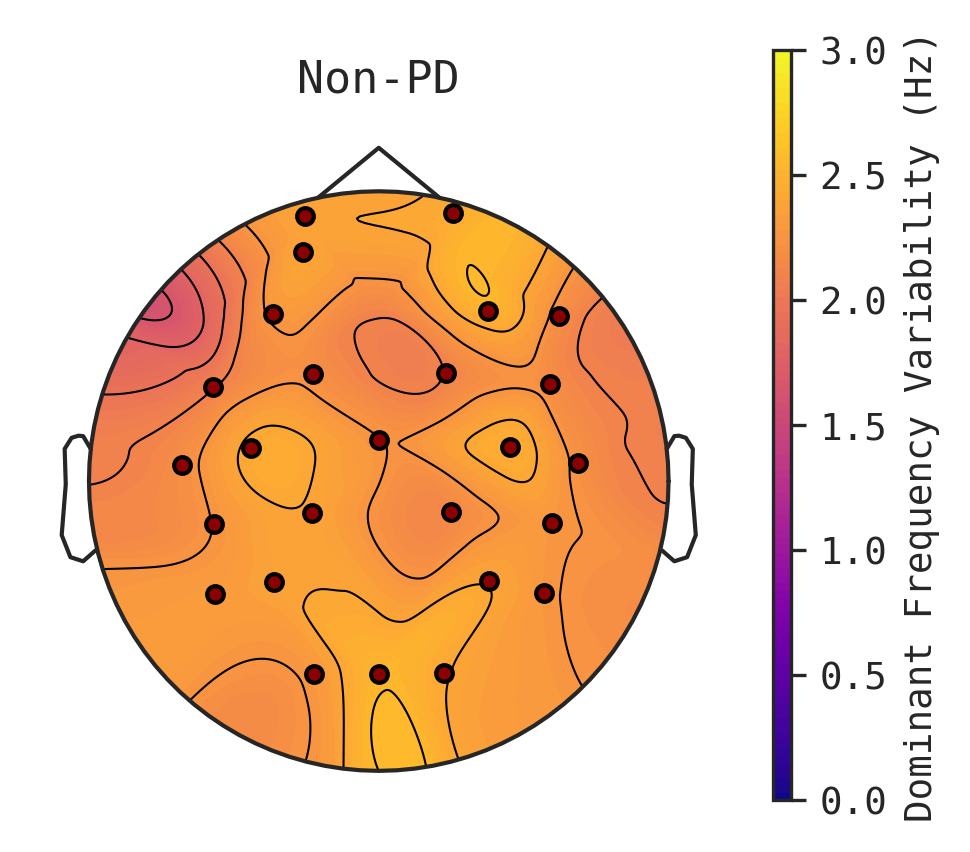

...

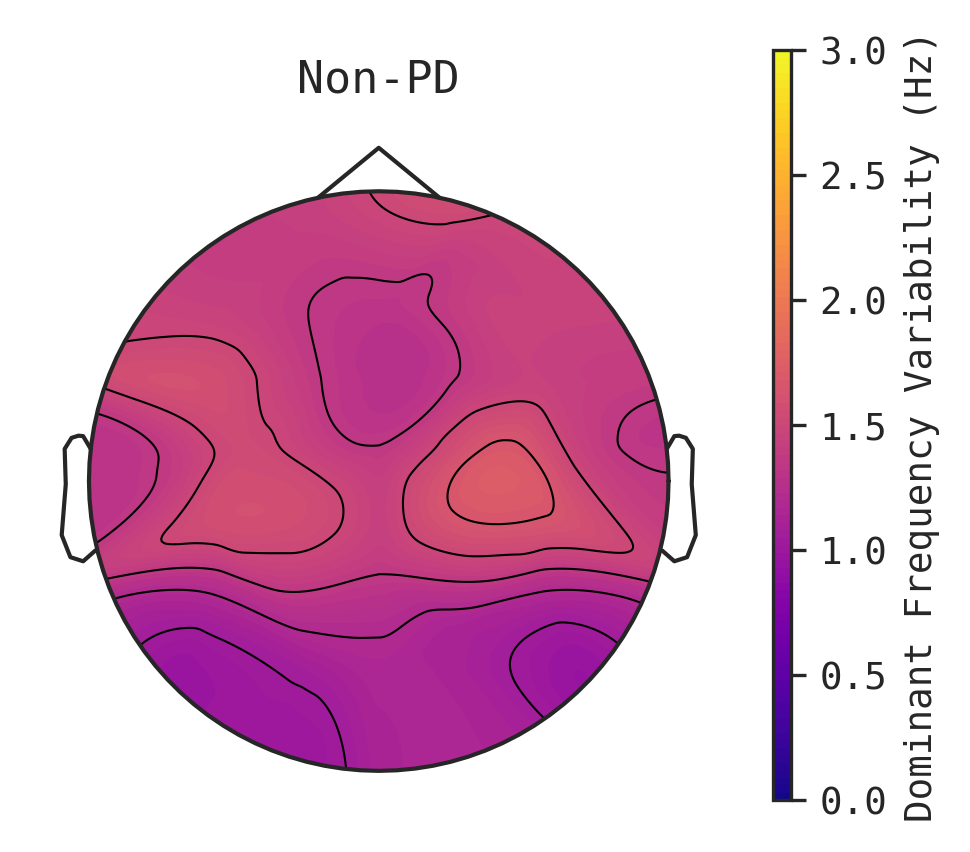

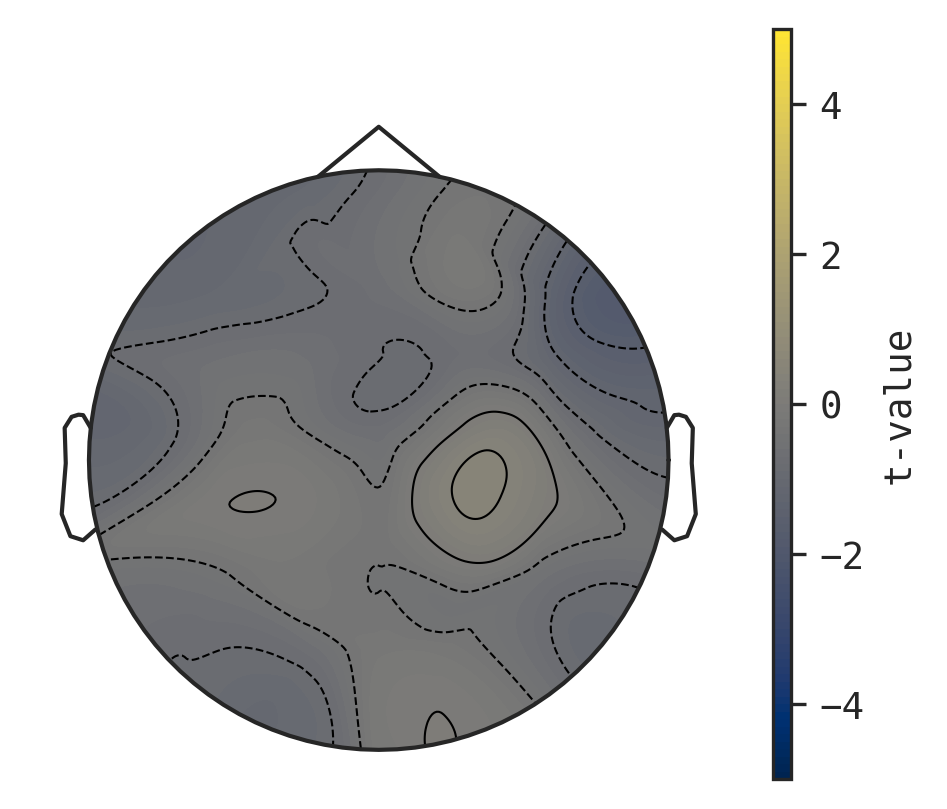

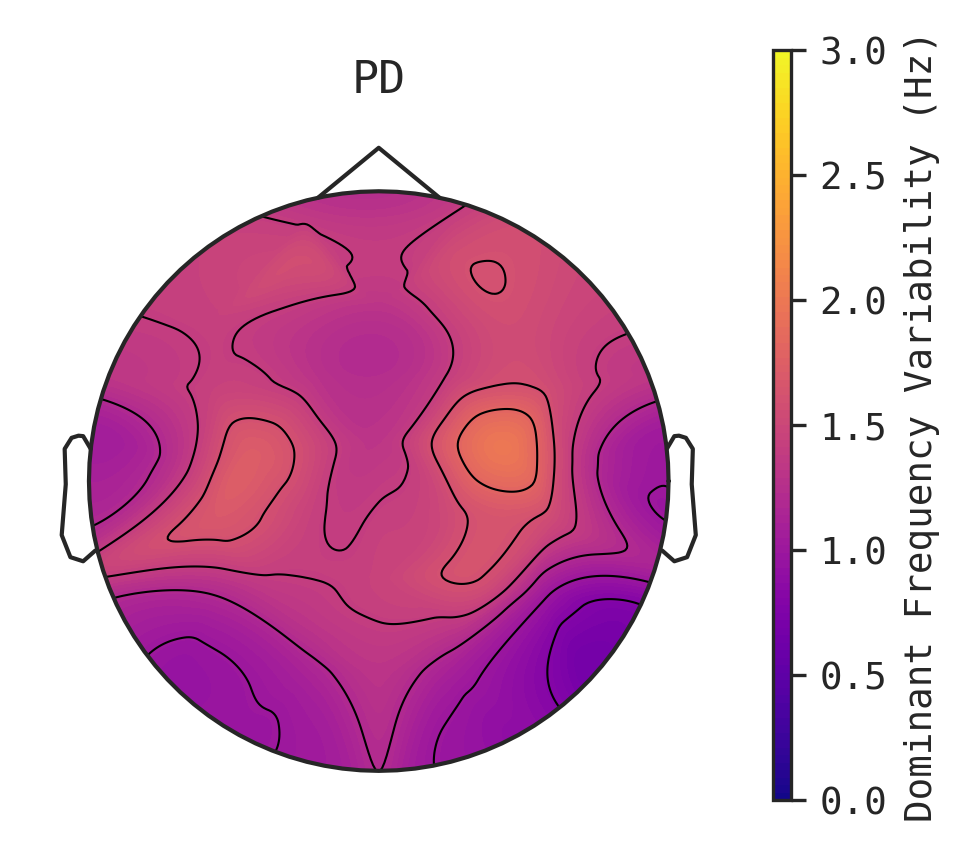

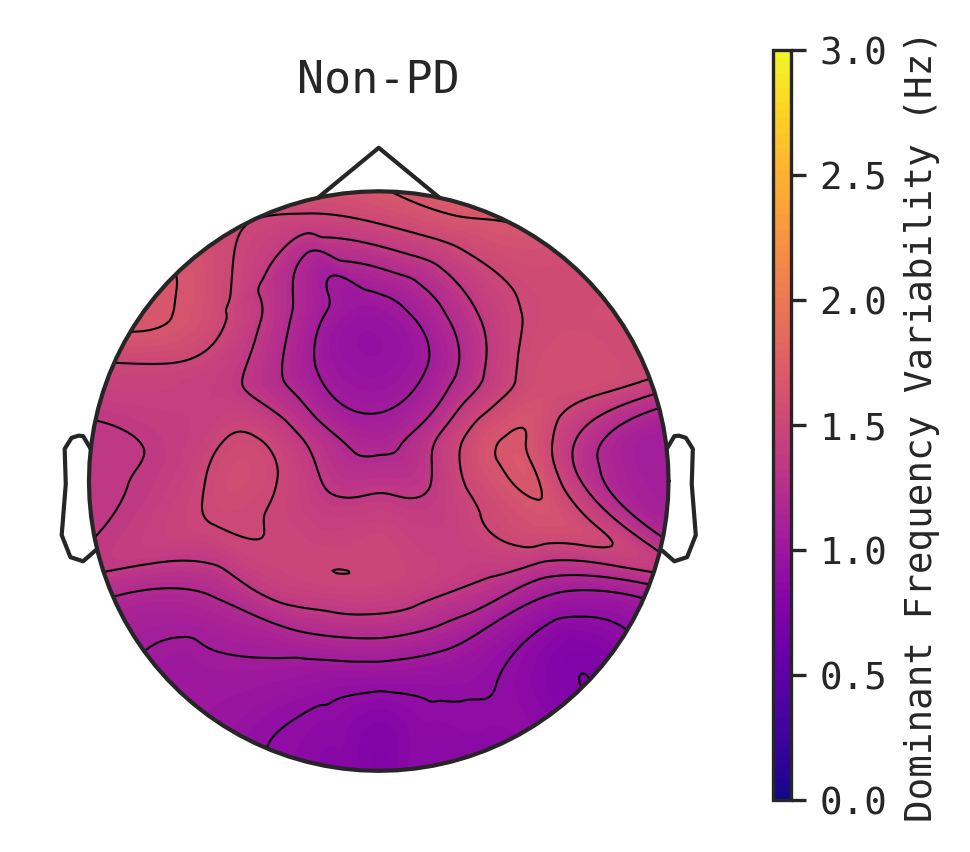

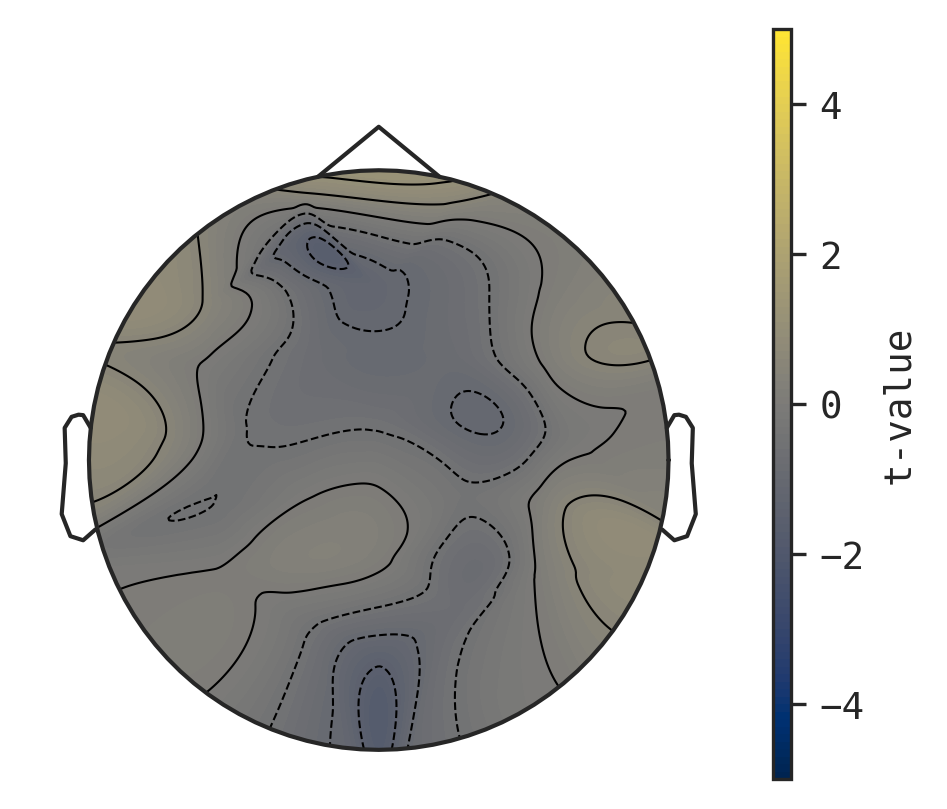

In [30]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_dfv.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin=0, vmax = 3,  montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin=0, vmax = 3,  montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_pd_dfv.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_hc_dfv.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_dfv.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_dfv.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_pd_dfv.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_hc_dfv.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_dfv.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_dfv.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_pd_dfv.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_hc_dfv.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_dfv.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_dfv.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Dominant Frequency Variability (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_pd_dfv.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_hc_dfv.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_dfv.png", dpi = 150)

In [ ]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_topoplot_st.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
cal_pd = topoplot(df["estimate2"], vmin=0, vmax = 3,  montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_hc = topoplot(df["estimate1"], vmin=0, vmax = 3,  montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_pd_st.png", dpi = 150)
cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_hc_st.png", dpi = 150)
cal_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/cal_st.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_topoplot_st.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
iow_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant'], mask_params=dict(marker='o', markerfacecolor='darkred', markeredgecolor='k', linewidth=0, markersize=4))
iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_pd_st.png", dpi = 150)
iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_hc_st.png", dpi = 150)
iow_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iow_st.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_topoplot_st.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
med_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_pd_st.png", dpi = 150)
med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_hc_st.png", dpi = 150)
med_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/med_st.png", dpi = 150)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_topoplot_st.csv",index_col='channel')
df['significant'] = (df['p.adj'] < 0.05)
df['significant_unc'] = (df['p'] < 0.05)
fin_pd = topoplot(df["estimate2"], vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_hc = topoplot(df["estimate1"],  vmin=0, vmax = 3, montage='standard_1020',cbar_title="Slow-theta r",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD",
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_t = topoplot(df["statistic"], vmin=-5, vmax = 5, montage='standard_1020',cbar_title="t-value",fontsize=9, figsize=(3,5), cmap='cividis', show_names=False, dpi = 300, 
         mask=df['significant_unc'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))
fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_pd_st.png", dpi = 150)
fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_hc_st.png", dpi = 150)
fin_t.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/fin_st.png", dpi = 150)

c:\Users\acer\anaconda3\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package yasa is out of date. Your version is 0.6.1, the latest is 0.6.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


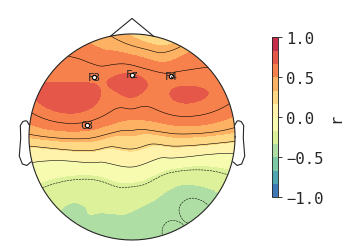

In [4]:
import yasa
import pandas as pd
corr = pd.DataFrame({
    "chan": ["Fp1", "Fp2", "F3", "Fz", "F4", "C3", "Cz", "C4", "P3", "Pz", "P4", "O1", "O2"],
    "r": [0.45, 0.301, 0.65, 0.67, 0.62, 0.57, 0.48, 0.52, -0.13, -0.05, -0.20, -0.31, -0.35],
    "pval": [0.10, 0.15, 0.005, 0.004, 0.01, 0.03, 0.10, 0.07, 0.76, 0.95, 0.63, 0.42, 0.37],
})


corr = corr.set_index("chan")

corr['sig'] = (corr['pval'] < 0.05)


#topoplot(data, vmin=-1, vmax=1, n_colors=8,cbar_title="Pearson correlation",  mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k',
#        linewidth=0, markersize=4))
# Without masking
topoplot(corr['r'], vmin=-1, vmax=1, n_colors=12, mask=corr['sig'], mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k', linewidth=0, markersize=4))

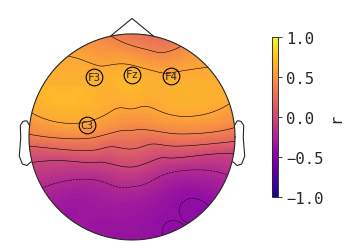

In [40]:
topoplot(corr['r'], vmin=-1, vmax=1, cmap='plasma', mask=corr['sig'], mask_params=dict(marker='o', markerfacecolor='none', markeredgecolor='k', linewidth=0, markersize=15))

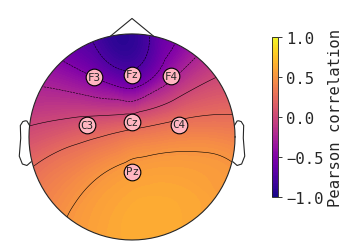

In [30]:
import yasa
import pandas as pd
data = pd.Series([-0.5, -0.7, -0.3, 0.1, 0.15, 0.3, 0.55],
index=['F3', 'Fz', 'F4', 'C3', 'Cz', 'C4', 'Pz'])


topoplot(data, vmin=-1, vmax=1, cmap='plasma',cbar_title="Pearson correlation",  show_names=True, mask_params=dict(marker='o', markerfacecolor='lightred', markeredgecolor='k',
        linewidth=0, markersize=15))


In [5]:
import yasa

In [7]:
import pandas as pd

In [32]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_group_theta.csv")

In [9]:
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + group + "_theta.csv", index=False)

In [ ]:
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/hc_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")


In [47]:
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/hc_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_cal_hc = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/pd_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_cal_pd = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [48]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_group_theta.csv")

grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path +"finland_" + group + "_theta.csv", index=False)
    
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_fin_hc = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_fin_pd = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [49]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_group_theta.csv")

grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path +"iowa_" + group + "_theta.csv", index=False)
    
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_iow_hc = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_iow_pd = topoplot(theta_ser,vmin=-1.1, vmax = - 0.550,  montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [50]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_group_theta.csv")

grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path +"medellin_" + group + "_theta.csv", index=False)
    
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_med_hc = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
t_med_pd = topoplot(theta_ser, vmin=-1.1, vmax = - 0.550, montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [53]:
t_cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_theta.png", dpi = 150)
t_cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_theta.png", dpi = 150)
t_fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_theta.png", dpi = 150)
t_fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_theta.png", dpi = 150)
t_med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_theta.png", dpi = 150)
t_med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_theta.png", dpi = 150)
t_iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_theta.png", dpi = 150)
t_iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_theta.png", dpi = 150)

In [74]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_group_prealpha.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "california_" + group + "_prealpha.csv", index=False)

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_cal_hc = topoplot(prealpha_ser,vmin=-1.2, vmax = - 0.68,  montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_cal_pd = topoplot(prealpha_ser, vmin=-1.2, vmax = - 0.68,montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [75]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_group_prealpha.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "medellin_" + group + "_prealpha.csv", index=False)

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_med_hc = topoplot(prealpha_ser, vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_med_pd = topoplot(prealpha_ser,vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [76]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_group_prealpha.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "iowa_" + group + "_prealpha.csv", index=False)

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_iow_hc = topoplot(prealpha_ser,vmin=-1.2, vmax = - 0.68,  montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_iow_pd = topoplot(prealpha_ser,vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [77]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_group_prealpha.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "finland_" + group + "_prealpha.csv", index=False)

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_fin_hc = topoplot(prealpha_ser, vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()
#topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
pa_fin_pd = topoplot(prealpha_ser, vmin=-1.2, vmax = - 0.68, montage='standard_1020',cbar_title="Log 10 (Pre-α relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [78]:
pa_cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_prealpha.png", dpi = 150)
pa_cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_prealpha.png", dpi = 150)
pa_fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_prealpha.png", dpi = 150)
pa_fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_prealpha.png", dpi = 150)
pa_med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_prealpha.png", dpi = 150)
pa_med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_prealpha.png", dpi = 150)
pa_iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_prealpha.png", dpi = 150)
pa_iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_prealpha.png", dpi = 150)

In [98]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_group_mean_alpha_theta.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "california_" + group + "_atr.csv", index=False)

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrcal_hc = topoplot(atr_ser, vmin = -0.2, vmax=0.62,  montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrcal_pd = topoplot(atr_ser, vmin = -0.2, vmax=0.62,montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_group_mean_alpha_theta.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "medellin_" + group + "_atr.csv", index=False)

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrmed_hc = topoplot(atr_ser, vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrmed_pd = topoplot(atr_ser, vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_group_mean_alpha_theta.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "iowa_" + group + "_atr.csv", index=False)

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atriow_hc = topoplot(atr_ser, vmin = -0.2, vmax=0.62,  montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atriow_pd = topoplot(atr_ser, vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_group_mean_alpha_theta.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "finland_" + group + "_atr.csv", index=False)

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrfin_hc = topoplot(atr_ser, vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

atr = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_atr.csv", index_col='channel')
atr_ser = atr.squeeze()
#topoplot(atr_ser, vmin = -0.2, vmax=0.62, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (α/θ) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
atrfin_pd = topoplot(atr_ser, vmin = -0.2, vmax=0.62, montage='standard_1020',cbar_title="Log 10 (α/θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

atrcal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_atr.png", dpi = 150)
atrcal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_atr.png", dpi = 150)
atrfin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_atr.png", dpi = 150)
atrfin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_atr.png", dpi = 150)
atrmed_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_atr.png", dpi = 150)
atrmed_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_atr.png", dpi = 150)
atriow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_atr.png", dpi = 150)
atriow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_atr.png", dpi = 150)

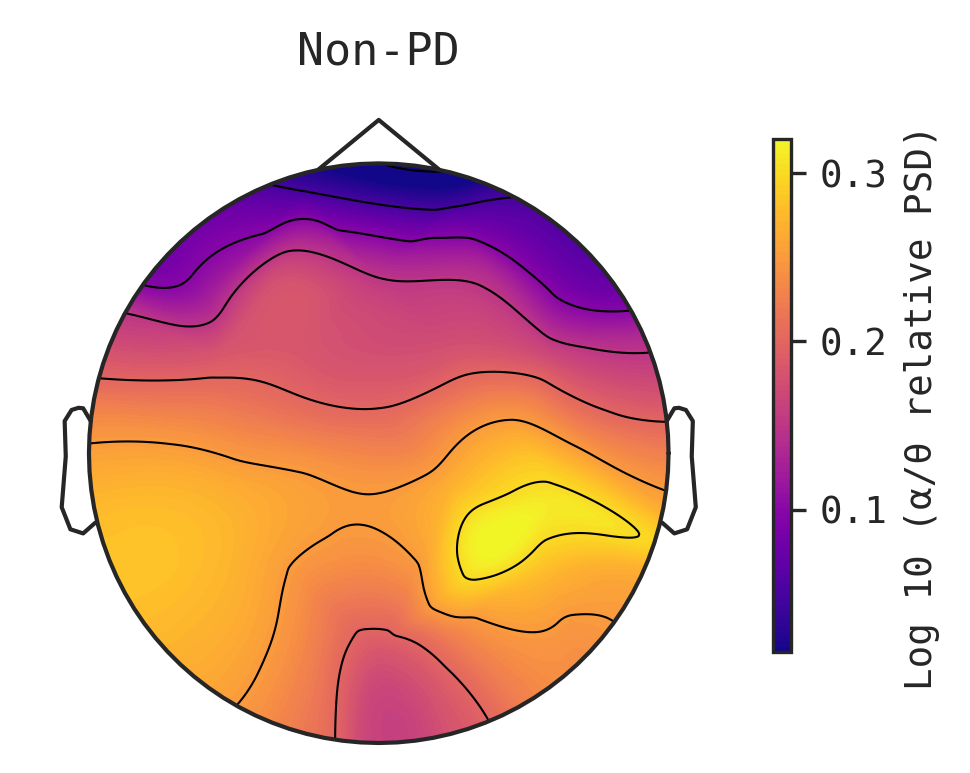

In [104]:
atriow_hc

In [ ]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/california_group_df.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "california_" + group + "_df.csv", index=False)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_cal_hc = topoplot(df_ser, vmin = 7.7, vmax = 10.1,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_cal_pd = topoplot(df_ser, vmin = 7.7, vmax = 10.1, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/medellin_group_df.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "medellin_" + group + "_df.csv", index=False)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_med_hc = topoplot(df_ser, vmin = 7.7, vmax = 10.1,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_med_pd = topoplot(df_ser, vmin = 7.7, vmax = 10.1, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/iowa_group_df.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "iowa_" + group + "_df.csv", index=False)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_iow_hc = topoplot(df_ser, vmin = 7.7, vmax = 10.1,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_iow_pd = topoplot(df_ser, vmin = 7.7, vmax = 10.1, montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data/finland_group_df.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + "finland_" + group + "_df.csv", index=False)

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_fin_hc = topoplot(df_ser, vmin = 7.7, vmax = 10.1,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

df = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_df.csv", index_col='channel')
df_ser = df.squeeze()
#topoplot(df_ser, vmin = 7.7, vmax = 10.1, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
df_fin_pd = topoplot(df_ser, vmin = 7.7, vmax = 10.1,  montage='standard_1020',cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

df_cal_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_pd_df.png", dpi = 150)
df_cal_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/california_hc_df.png", dpi = 150)
df_fin_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_pd_df.png", dpi = 150)
df_fin_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/finland_hc_df.png", dpi = 150)
df_med_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_pd_df.png", dpi = 150)
df_med_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/medellin_hc_df.png", dpi = 150)
df_iow_pd.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_pd_df.png", dpi = 150)
df_iow_hc.savefig("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/iowa_hc_df.png", dpi = 150)

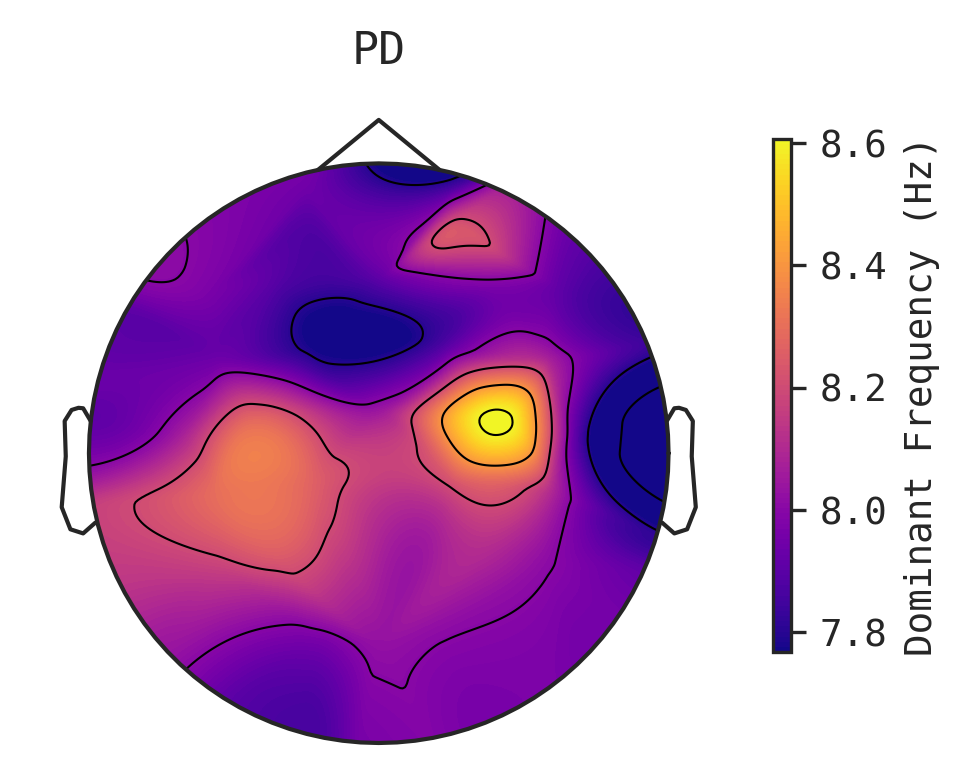

In [87]:
df_iow_pd

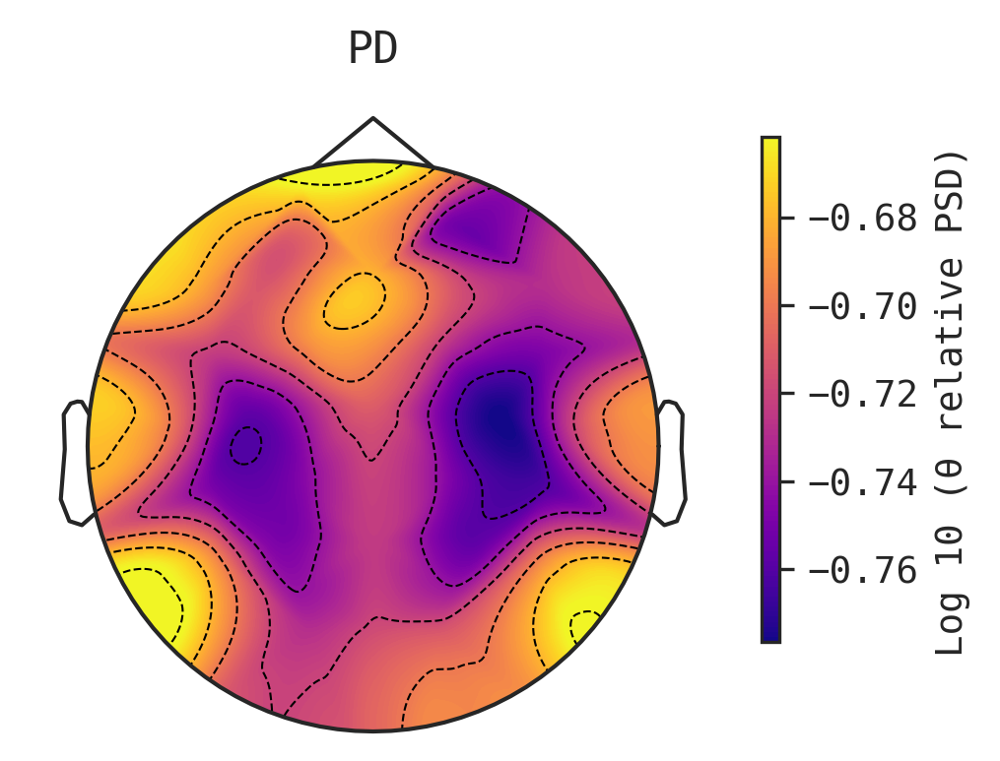

In [17]:
theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/TOPOPLOT/data2/pd_theta.csv", index_col='channel')
theta_ser = theta.squeeze()
#topoplot(theta_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")
topoplot(theta_ser,  montage='standard_1020',cbar_title="Log 10 (θ relative PSD) ",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [164]:
mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/pd_median_alpha_theta.csv", index_col='channel')
mean_alpha_theta_ser = mean_alpha_theta.squeeze()

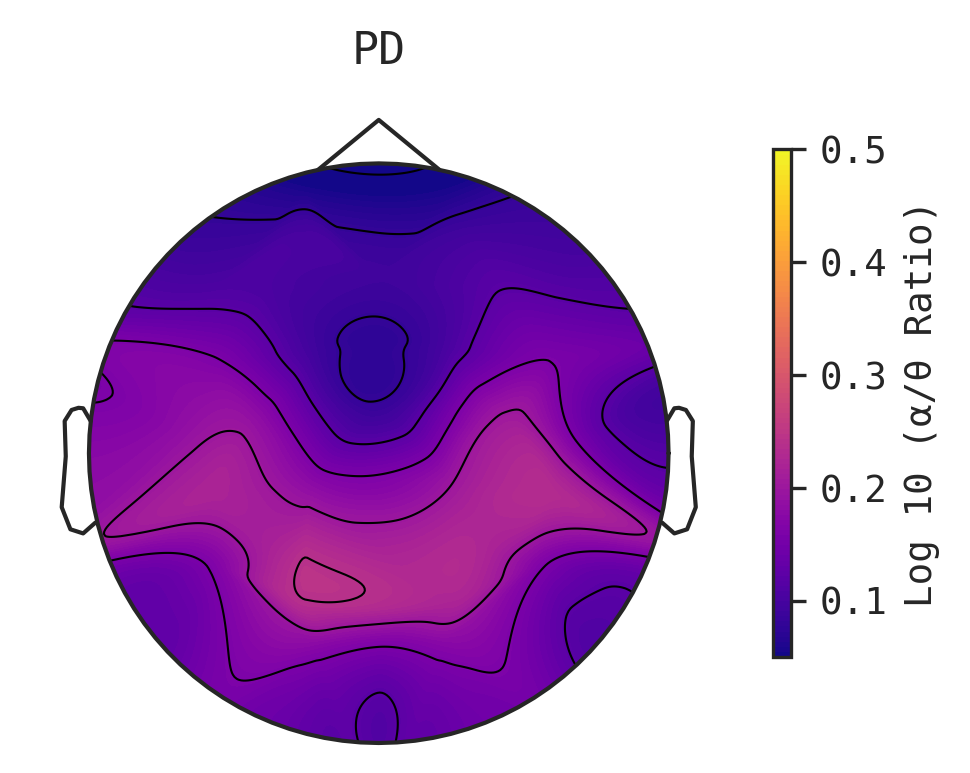

In [166]:
topoplot(mean_alpha_theta_ser, montage='standard_1020', cbar_title="Log 10 (α/θ Ratio)", vmin=0.05, vmax = 0.5, fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

In [167]:
mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/hc_median_alpha_theta.csv", index_col='channel')
mean_alpha_theta_ser = mean_alpha_theta.squeeze()

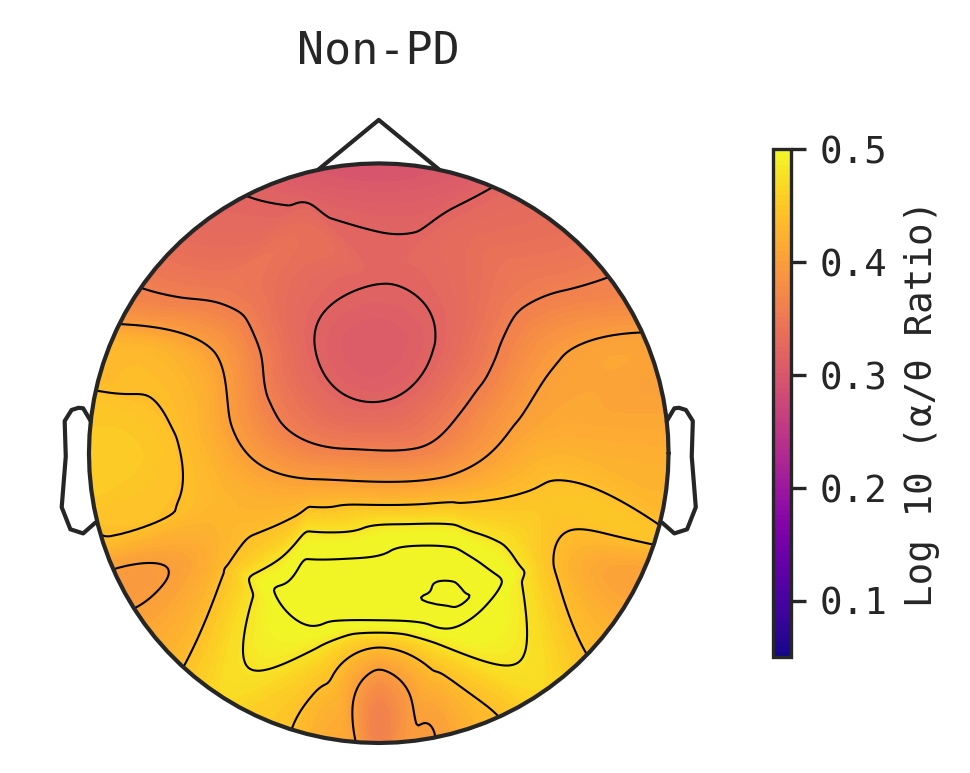

In [168]:
topoplot(mean_alpha_theta_ser, montage='standard_1020', cbar_title="Log 10 (α/θ Ratio)", fontsize=9, vmin=0.05, vmax = 0.5, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

In [15]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/group_prealpha.csv")

In [16]:
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + group + "-prealpha.csv", index=False)

In [170]:
prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/hc-prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()


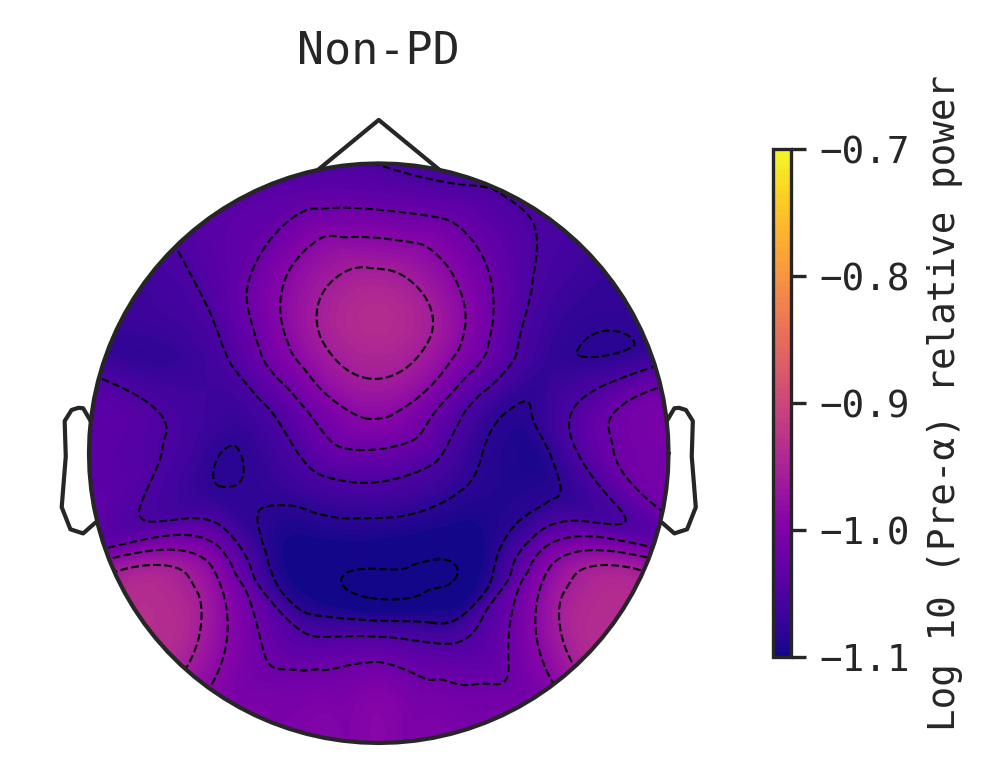

In [171]:
topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")

In [172]:
prealpha = pd.read_csv("D:/escritorio/tSNE_entropia_R/pd-prealpha.csv", index_col='channel')
prealpha_ser = prealpha.squeeze()


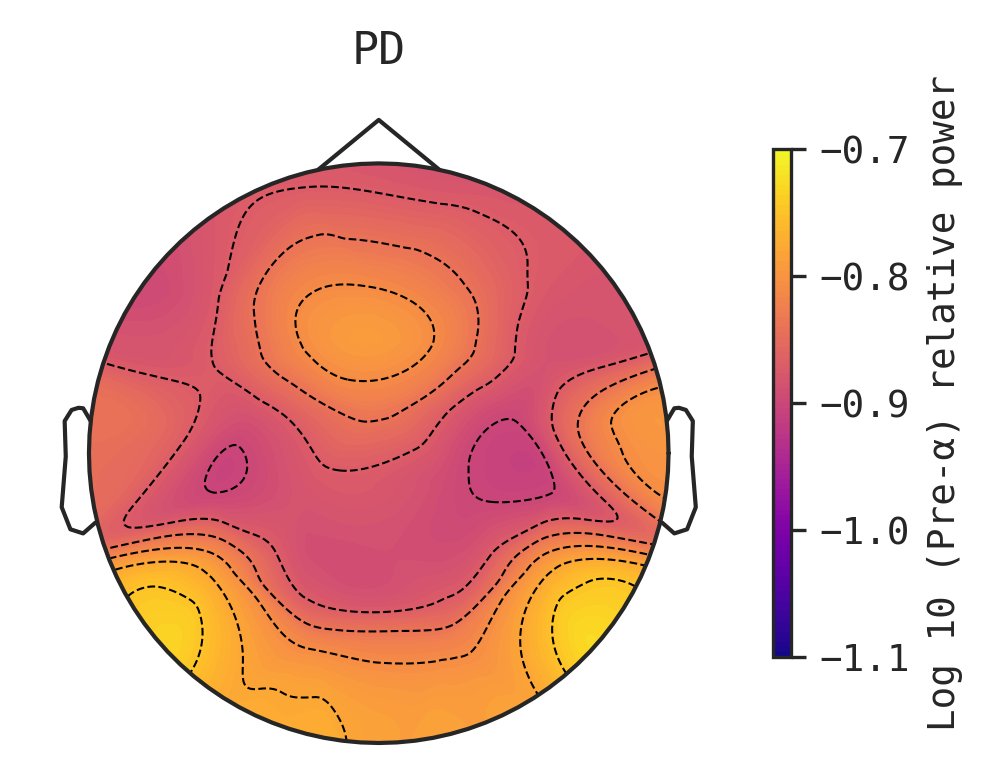

In [174]:
topoplot(prealpha_ser, vmin=-1.1, vmax = - 0.70, fontsize=9, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power", figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

### ATR

In [ ]:
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/group_median_alpha_theta.csv")

In [ ]:
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + group + "_median_alpha_theta.csv", index=False)

In [ ]:
mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/pd_median_alpha_theta.csv", index_col='channel')
mean_alpha_theta_ser = mean_alpha_theta.squeeze()

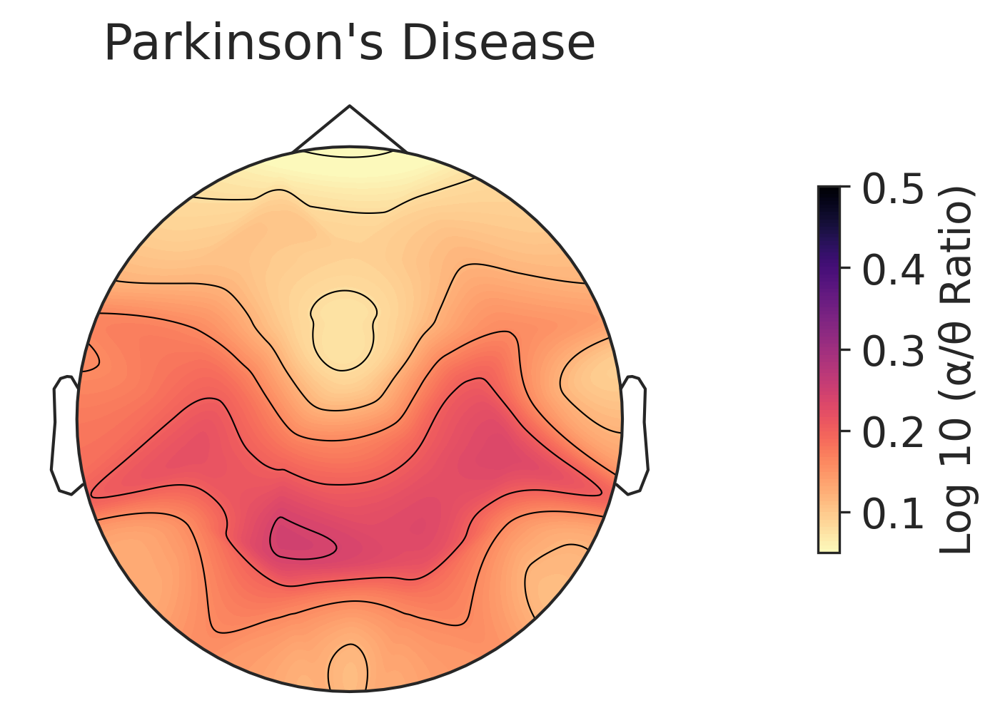

In [ ]:
yasa.topoplot(mean_alpha_theta_ser, montage='standard_1020', cbar_title="Log 10 (α/θ Ratio)", vmin=0.05, vmax = 0.5, figsize=(5,5), cmap='jet_r', show_names=False, dpi = 300, title="Parkinson's Disease")

In [ ]:
mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/hc_median_alpha_theta.csv", index_col='channel')
mean_alpha_theta_ser = mean_alpha_theta.squeeze()

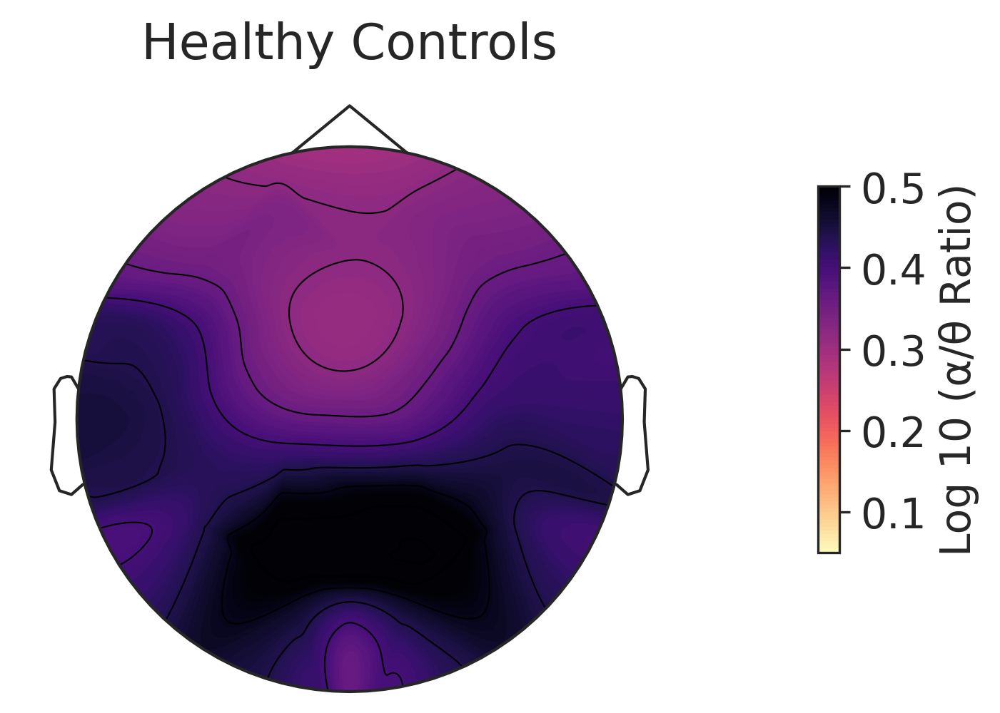

In [ ]:
yasa.topoplot(mean_alpha_theta_ser, montage='standard_1020', cbar_title="Log 10 (α/θ Ratio)", vmin=0.05, vmax = 0.5, figsize=(5,5), cmap='jet_r', show_names=False, dpi = 300, title="Healthy Controls")

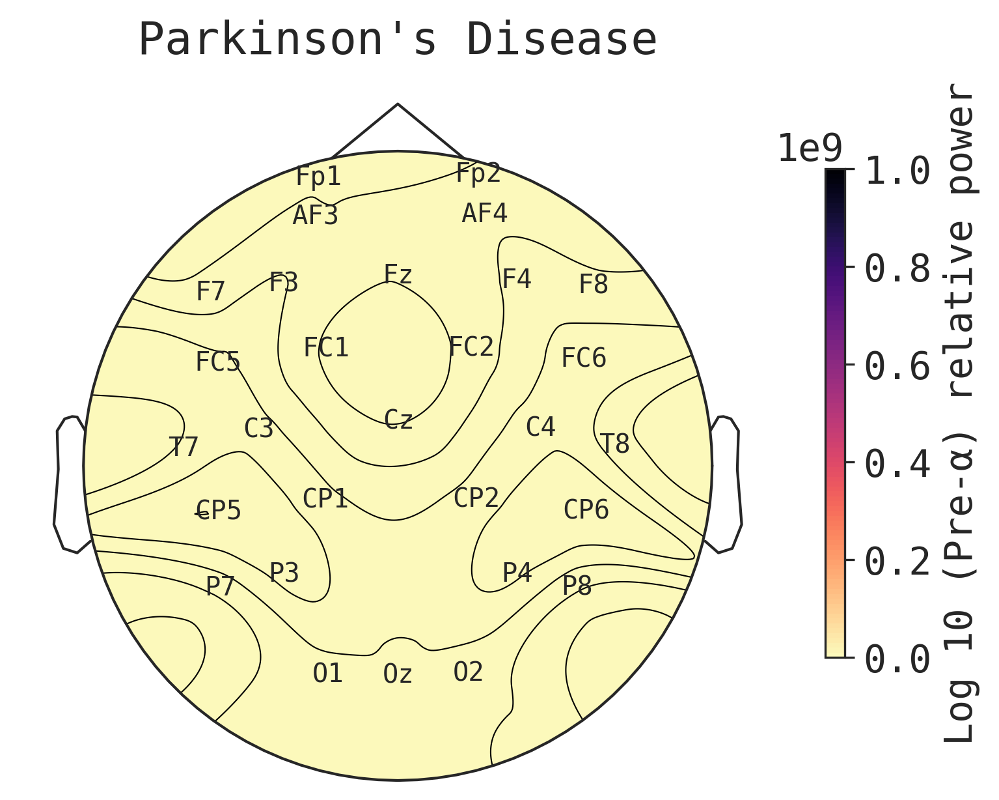

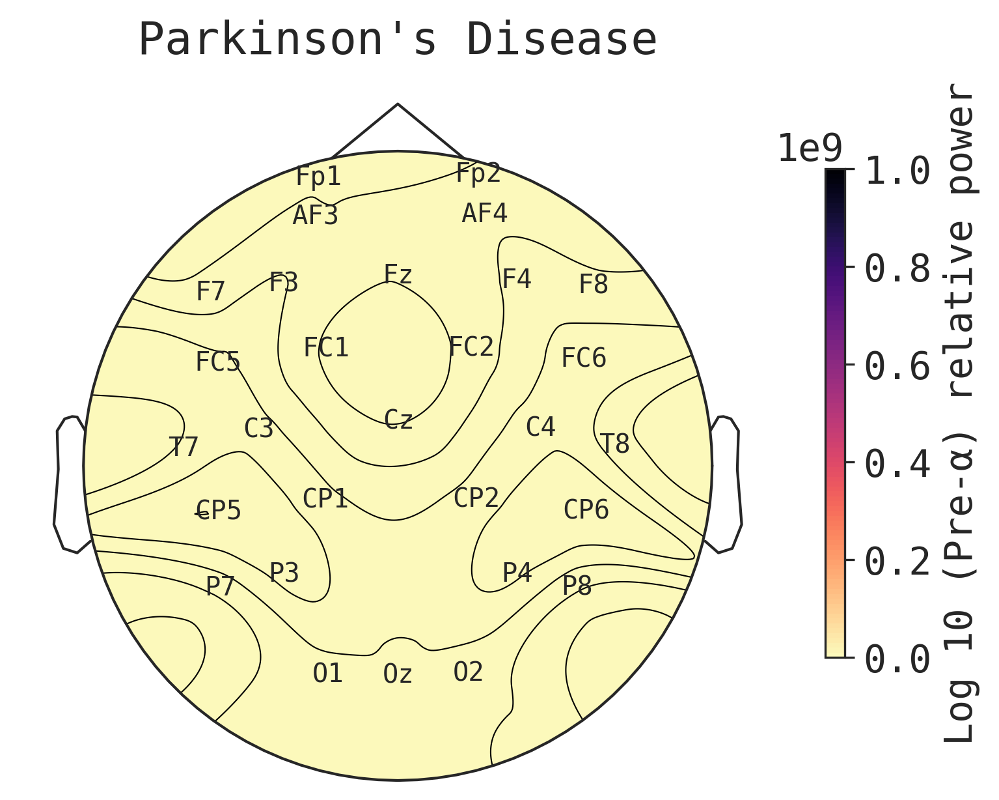

In [50]:
topoplot(prealpha_ser, vmin=-20000, vmax = 1000000000, montage='standard_1020',cbar_title="Log 10 (Pre-α) relative power", figsize=(5,5), cmap='magma_r', show_names=True, dpi = 300, title="Parkinson's Disease")

In [46]:
np.min(df["delta_group"])

8.37797619047619

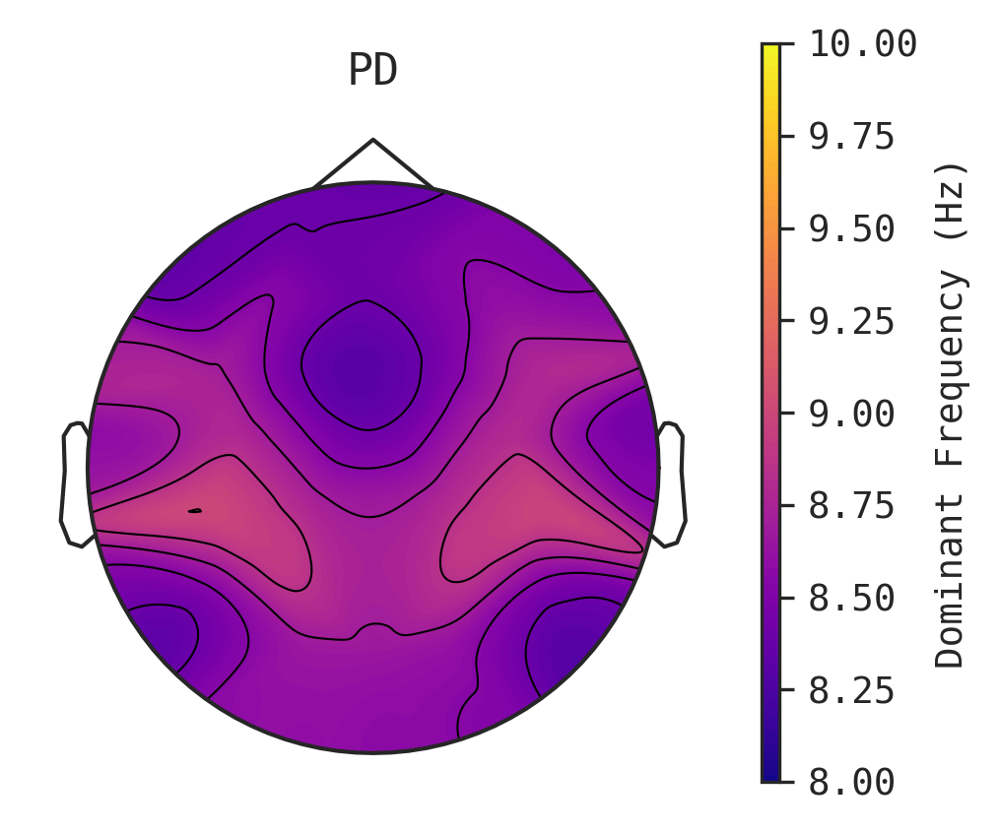

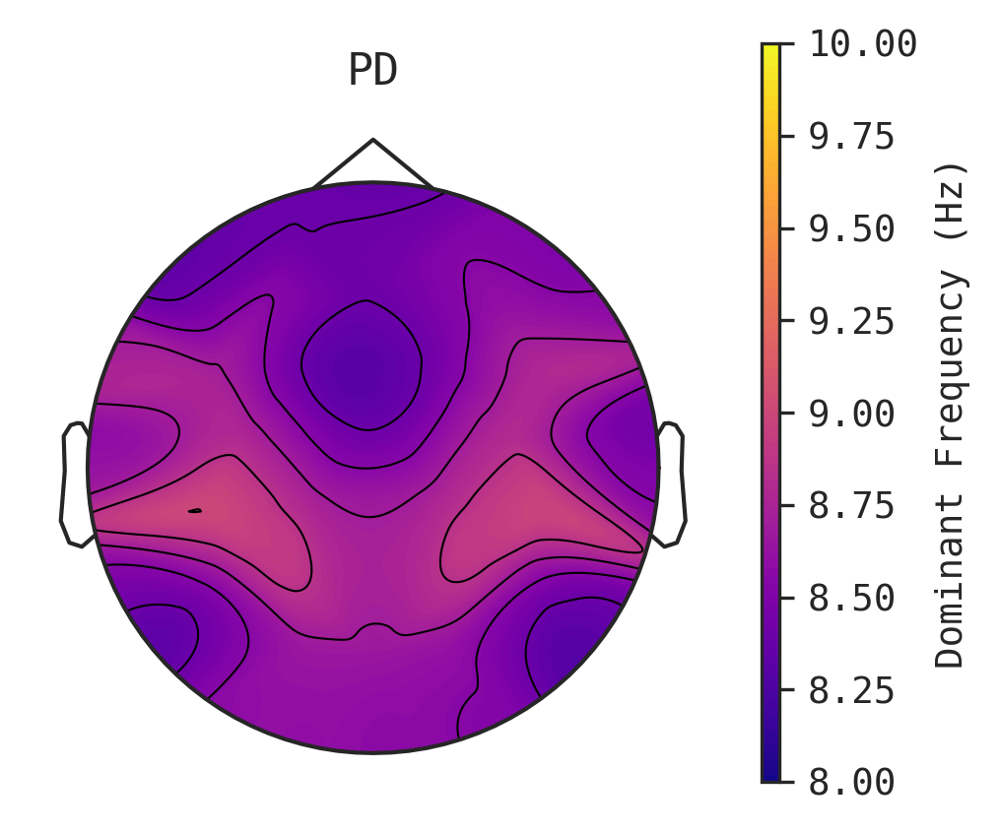

In [47]:
import yasa
import pandas as pd
df = pd.read_csv("D:/escritorio/tSNE_entropia_R/dag_df.csv")
grouped_obj = df.groupby(['group'])
output_path = "D:/escritorio/tSNE_entropia_R/"

for group, filtered_df in grouped_obj:
    filtered_df.drop("group", axis=1, inplace=True)
    filtered_df.to_csv(output_path + group + "_dag_df.csv", index=False)
    
mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/pd_dag_df.csv", index_col='channel')
prealpha_ser = mean_alpha_theta.squeeze()
topoplot(prealpha_ser,  montage='standard_1020',vmin=8, vmax = 10, cbar_title="Dominant Frequency (Hz)",fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="PD")

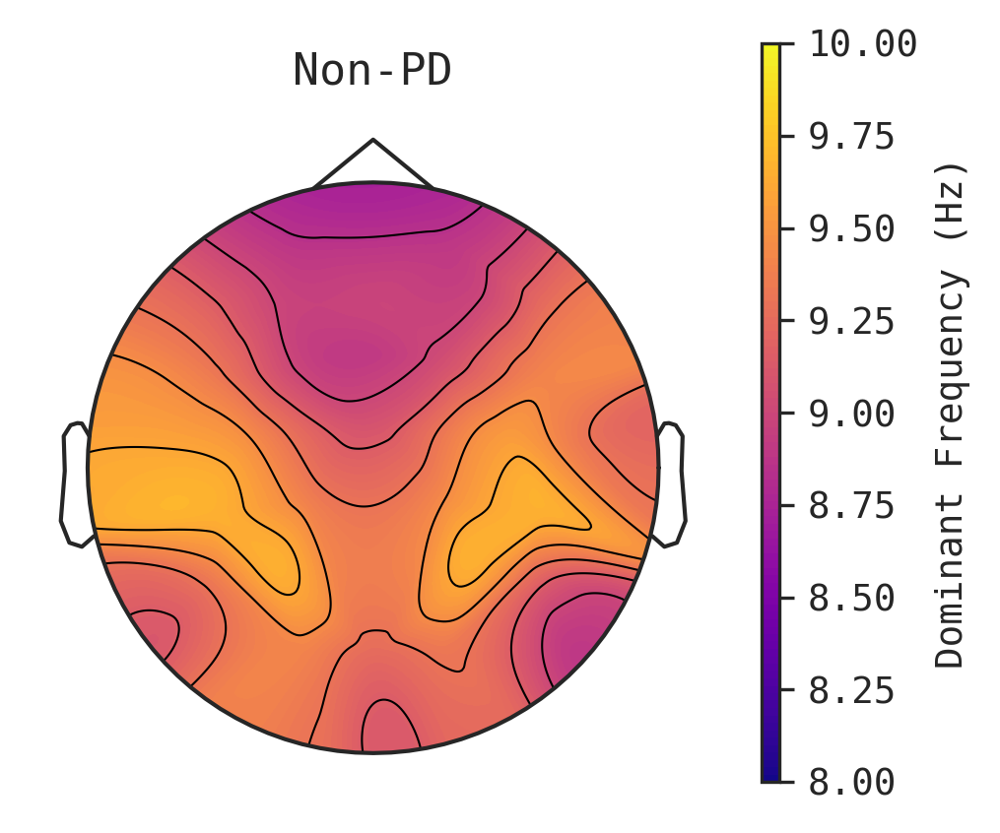

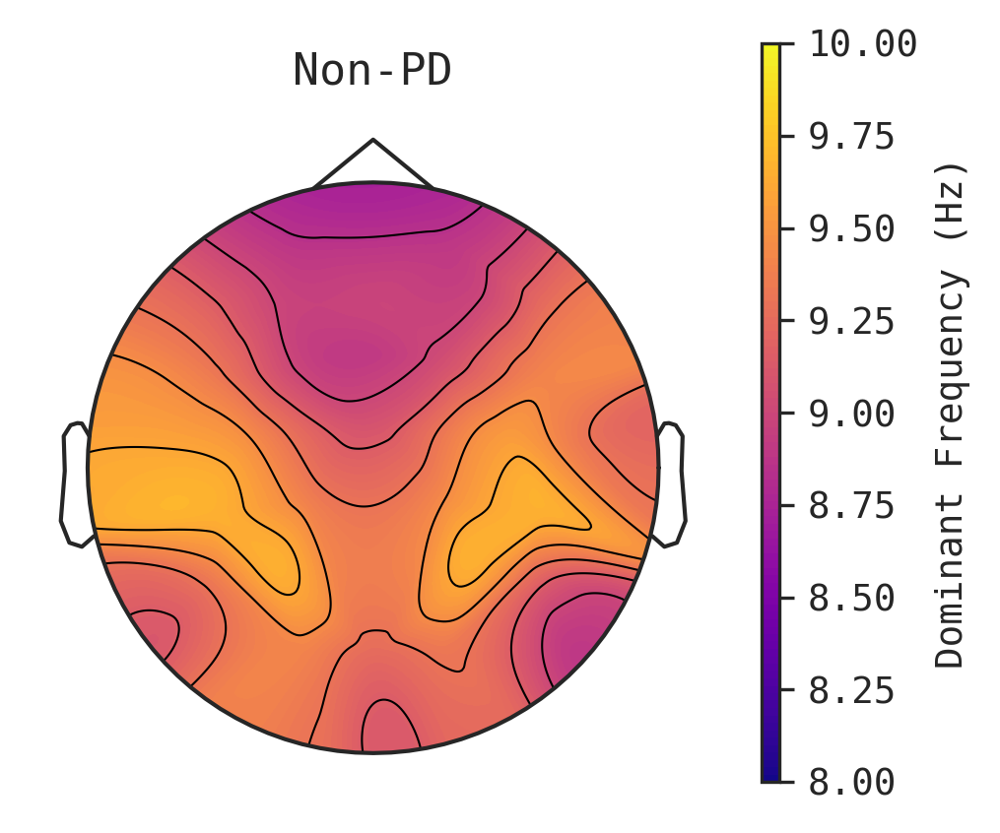

In [49]:

mean_alpha_theta = pd.read_csv("D:/escritorio/tSNE_entropia_R/hc_dag_df.csv", index_col='channel')
mean_alpha_theta_ser = mean_alpha_theta.squeeze()
topoplot(mean_alpha_theta_ser, montage='standard_1020', vmin=8, vmax = 10, cbar_title="Dominant Frequency (Hz)", fontsize=9, figsize=(3,5), cmap='plasma', show_names=False, dpi = 300, title="Non-PD")